# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [34]:
pip install plotnine


Note: you may need to restart the kernel to use updated packages.


Running this project require the following imports 

In [35]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram,linkage
from scipy.stats import multivariate_normal

In [88]:
def display_cluster(X, km=None, num_clusters=0, no_center=1):
    color = ['#FF0000', '#00FF00', '#0000FF', '#FFFF00', '#00FFFF', '#FF00FF', '#800000', '#008000', '#000080', '#808000', 
         '#008080', '#800080', '#FFA500', '#8A2BE2', '#FF4500', '#32CD32', '#FF69B4', '#BA55D3', '#7B68EE', '#4169E1',
         '#FFD700', '#ADFF2F', '#FF8C00', '#00FFFF', '#4B0082', '#9370DB', '#6A5ACD', '#00FF7F', '#ADFF2F', '#FFD700',
         '#FF6347', '#A52A2A', '#FFFF00', '#808080', '#FFA07A', '#20B2AA', '#FFC0CB', '#8B0000', '#FF00FF', '#800080',
         '#800000', '#00FF00', '#FFFF00', '#00FA9A', '#3CB371', '#4682B4', '#FF1493', '#483D8B', '#B22222', '#FF4500',
         '#228B22', '#DAA520']
    no_of_features = X.shape[1]
    plt.rcParams['figure.figsize'] = [10,3]
    #labels=np.unique(km.labels_)
    if no_of_features != 2:
        for i in range(no_of_features-1):
            for j in range(i+1, no_of_features):
                fig,ax = plt.subplots()  
                if km is not None:  
                    for k in range(num_clusters):
                        if(no_center==0):
                            ax.scatter(km.cluster_centers_[:, i][k], km.cluster_centers_[:, j][k], c=color[k], marker='s', s=20)
                            ax.scatter(X[km.labels_ == k, i], X[km.labels_ == k, j], c=color[k], alpha=0.5, s=20)
                            ax.set_xlabel('Feature ' + str(i+1))
                            ax.set_ylabel('Feature ' + str(j+1))
                        else:
                            ax.scatter(X[km.labels_ == k, i], X[km.labels_ == k, j], c=color[k], alpha=0.5, s=20)
                            ax.set_xlabel('Feature ' + str(i+1))
                            ax.set_ylabel('Feature ' + str(j+1))              
                        
                    ax.set_title('Clustered Data with ' + str(num_clusters) + ' Clusters')
                else:
                     ax.scatter(X[:, i], X[:, j], c=color[0], alpha=0.5, s=20)
                     ax.set_xlabel('Feature ' + str(i+1))
                     ax.set_ylabel('Feature ' + str(j+1))
                     ax.set_title('Original Data')
                plt.show();
    
    else:  
        fig, ax = plt.subplots()  
        if km is not None: 
            for k in range(num_clusters):
                if(no_center==0):
                    ax.scatter(km.cluster_centers_[:, 0][k], km.cluster_centers_[:, 1][k], c=color[k], marker='s', s=20)
                    ax.scatter(X[km.labels_ == k, 0], X[km.labels_ == k, 1], c=color[k], alpha=0.5, s=20)
                    ax.set_xlabel('Feature 1')
                    ax.set_ylabel('Feature 2')
                else:
                    ax.scatter(X[km.labels_ == k, 0], X[km.labels_ == k, 1], c=color[k], alpha=0.5, s=20)
                    ax.set_xlabel('Feature 1')
                    ax.set_ylabel('Feature 2')
                    

            ax.set_title('Clustered Data with ' + str(num_clusters) + ' Clusters')
        else:
            ax.scatter(X[:, 0], X[:, 1], c=color[0], alpha=0.5, s=20)
            ax.set_xlabel('Feature 1')
            ax.set_ylabel('Feature 2')
            ax.set_title('Original Data')

        plt.show();

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



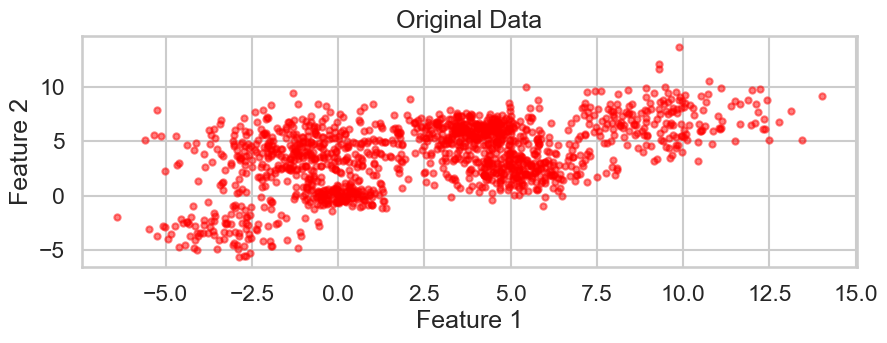

In [79]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

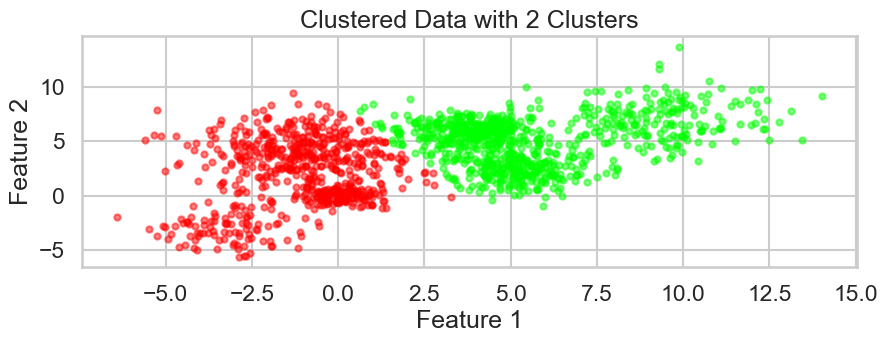

Cluster centers: [[-1.14174087  1.94113519]
 [ 5.57064923  5.0082254 ]]
Cluster labels: [0 0 0 ... 1 1 1]


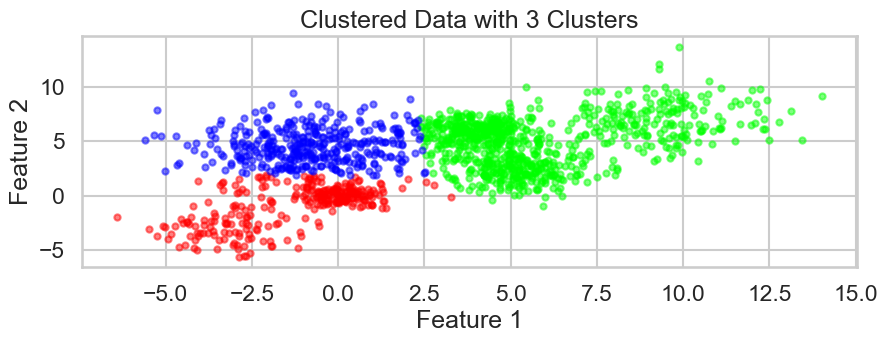

Cluster centers: [[-1.22162329 -0.86177632]
 [ 5.73634728  4.9539016 ]
 [-0.81454911  4.55092669]]
Cluster labels: [0 0 0 ... 1 1 1]


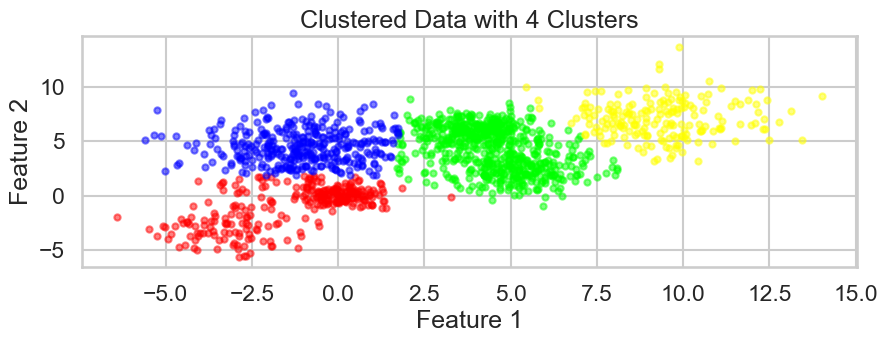

Cluster centers: [[-1.27129331 -0.88665735]
 [ 4.47479142  4.29705361]
 [-1.06018283  4.52694454]
 [ 9.33525812  7.05451123]]
Cluster labels: [0 0 0 ... 3 3 3]


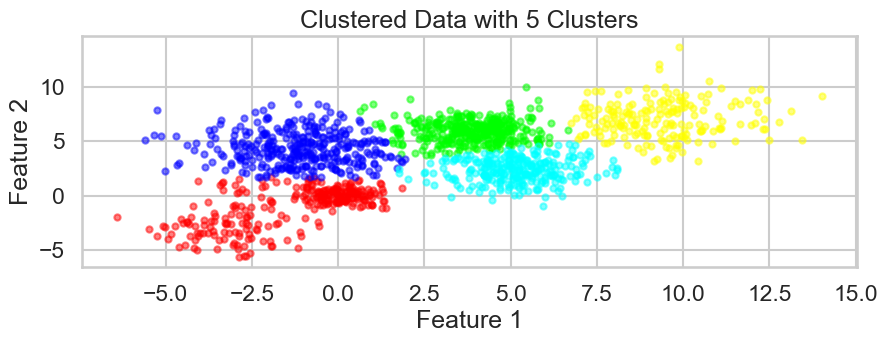

Cluster centers: [[-1.27268136 -0.95175627]
 [ 3.85034126  5.94508375]
 [-1.13656367  4.35788959]
 [ 9.36856474  7.00625988]
 [ 5.14571224  2.35871056]]
Cluster labels: [0 0 0 ... 3 1 3]


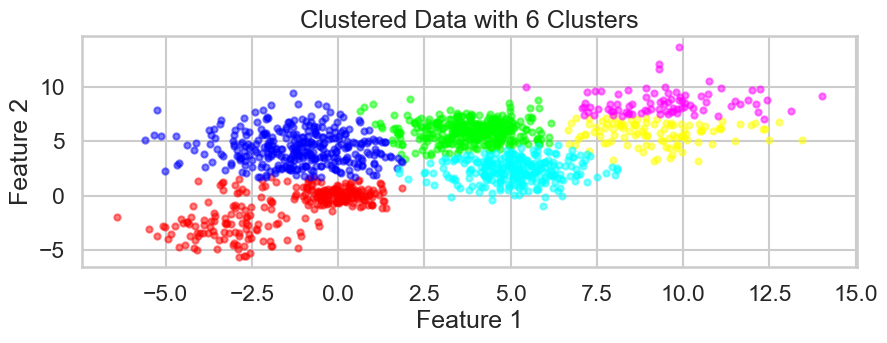

Cluster centers: [[-1.27268136 -0.95175627]
 [ 3.83280974  5.92650712]
 [-1.14568059  4.36096755]
 [ 9.17159958  5.70309901]
 [ 5.11608158  2.33222293]
 [ 9.43875827  8.55270223]]
Cluster labels: [0 0 0 ... 5 5 5]


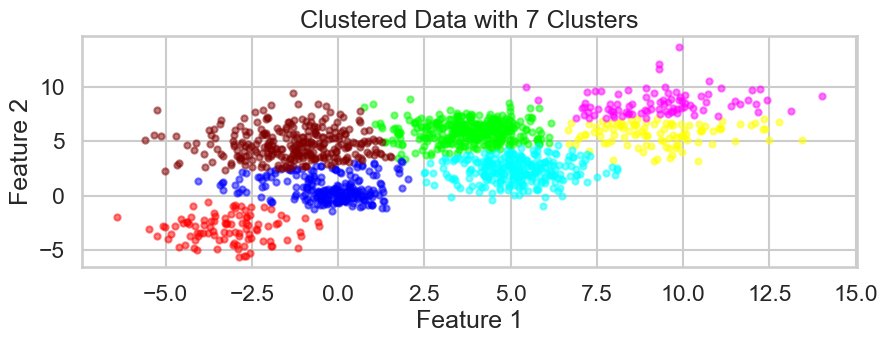

Cluster centers: [[-3.16735394 -3.03549079]
 [ 3.81677452  5.90130174]
 [-0.28066191  0.65760213]
 [ 9.26959996  5.6466717 ]
 [ 5.15175183  2.3357517 ]
 [ 9.27316569  8.49399391]
 [-1.29244234  4.74201653]]
Cluster labels: [0 0 0 ... 5 5 5]


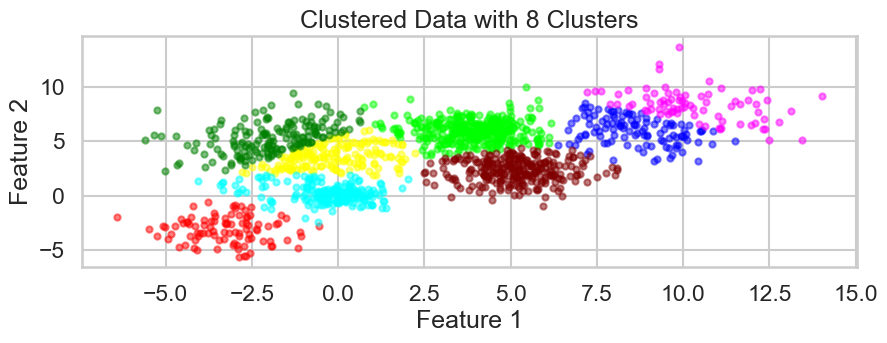

Cluster centers: [[-3.24231328 -3.09398719]
 [ 3.89733912  5.96361034]
 [ 8.59159366  5.95073898]
 [-0.16810528  3.60649614]
 [-0.32136727  0.21817818]
 [10.29032386  8.31831164]
 [ 5.13727877  2.31330103]
 [-1.97714437  5.31537927]]
Cluster labels: [0 4 0 ... 5 1 2]


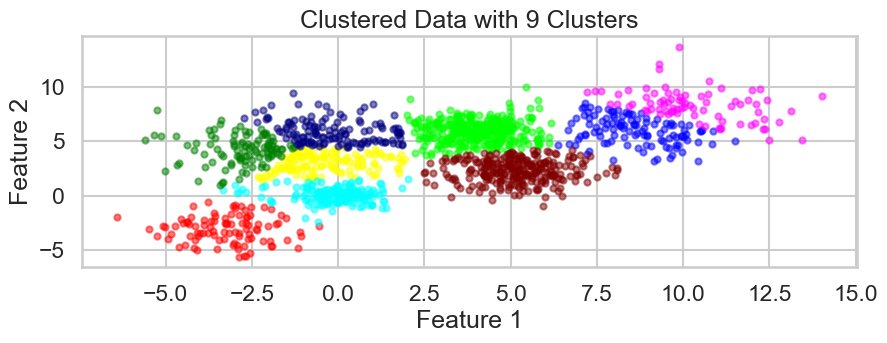

Cluster centers: [[-3.21749135 -3.05303901]
 [ 4.01281478  5.92802885]
 [ 8.59159366  5.95073898]
 [-0.38662012  3.04534781]
 [-0.13794806  0.06860527]
 [10.29032386  8.31831164]
 [ 5.13758725  2.29845165]
 [-2.82353317  4.22452598]
 [-0.18821027  5.9070062 ]]
Cluster labels: [0 0 0 ... 5 1 2]


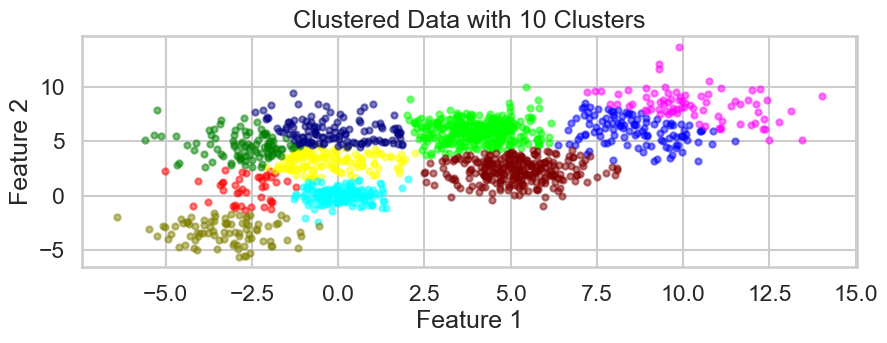

Cluster centers: [[-2.64884977  0.62595531]
 [ 4.0180524   5.93400283]
 [ 8.59159366  5.95073898]
 [-0.27364766  3.13135163]
 [ 0.06238285  0.03512518]
 [10.29032386  8.31831164]
 [ 5.13758725  2.29845165]
 [-2.72303827  4.54852204]
 [-0.12751487  5.9265871 ]
 [-3.25260842 -3.29105692]]
Cluster labels: [9 0 9 ... 5 1 2]


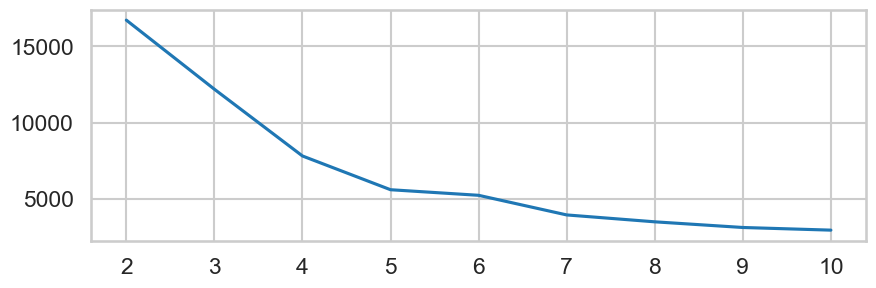

[5]


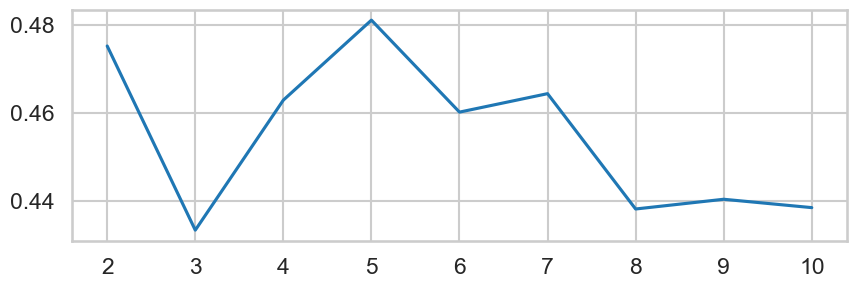

In [56]:

def euclidean_distance(point1, point2):
    point1 = np.array(point1)
    point2 = np.array(point2)
    return np.linalg.norm(point1 - point2)
# Initialize KMeans with the number of clusters you want to create
def distortion(data, centroids, assignments): ## takes min_idx_Array(assignment),list of centroids,list of data and returns distortion of the whole data from their corresponding cluster heads
    total_distortion = 0
    for i in range(len(centroids)):
        cluster_points = [data[j] for j in range(len(data)) if assignments[j] == i]
        for point in cluster_points:
            total_distortion += euclidean_distance(point, centroids[i])**2
    return total_distortion
clusters_num=np.arange(2,11)
SSE_draw=np.zeros(9,dtype=float)
Silhouette=np.zeros(9,dtype=float)
for n_clusters in range(2,11):
    kmeans = KMeans(n_clusters, random_state=0)

    # Fit the model to the data
    kmeans.fit(Multi_blob_Data)

    # Get the cluster centers
    centroids = kmeans.cluster_centers_

    # Get the cluster assignments for each data point
    labels = kmeans.labels_
    display_cluster(Multi_blob_Data,kmeans,n_clusters)
    SSE=distortion(Multi_blob_Data,centroids,labels)
    SSE_draw[n_clusters-2]=SSE
    Silhouette[n_clusters-2]=silhouette_score(Multi_blob_Data,labels)
    print("Cluster centers:", centroids)
    print("Cluster labels:", labels)

plt.figure();
plt.plot(clusters_num,SSE_draw);
plt.show();
plt.figure();
plt.plot(clusters_num,Silhouette);
kmeans_sil_rank= 2+np.where(Silhouette == max(Silhouette))[0]
print(kmeans_sil_rank)
plt.show();

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

Affinity: euclidean, Linkage: average, Distance Threshold: 3
Silhouette Score: 0.35500586075131524
16


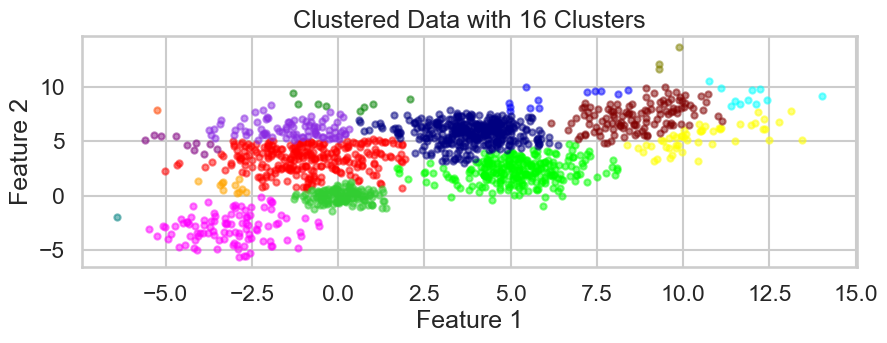

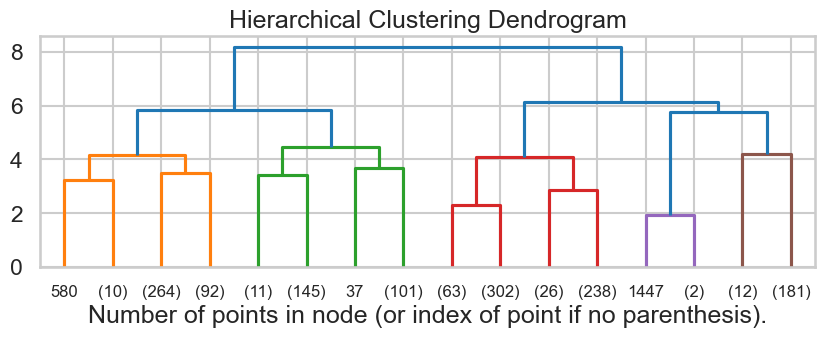

Affinity: euclidean, Linkage: average, Distance Threshold: 4
Silhouette Score: 0.37378418096239385
10


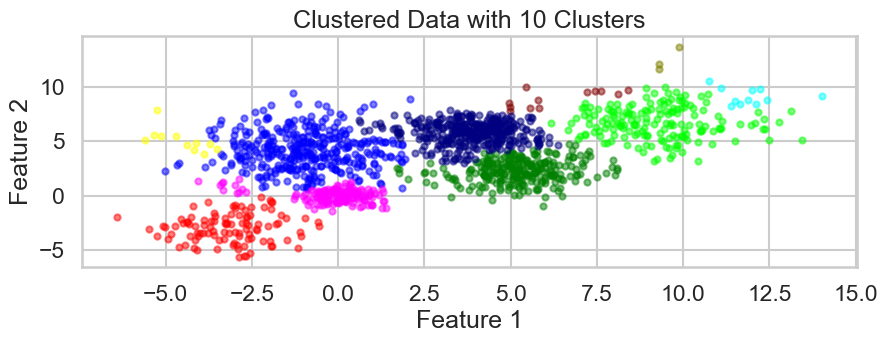

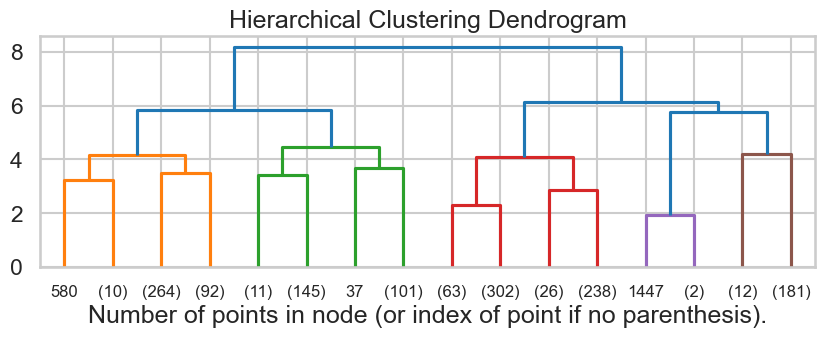

Affinity: euclidean, Linkage: average, Distance Threshold: 5
Silhouette Score: 0.433187948807373
5


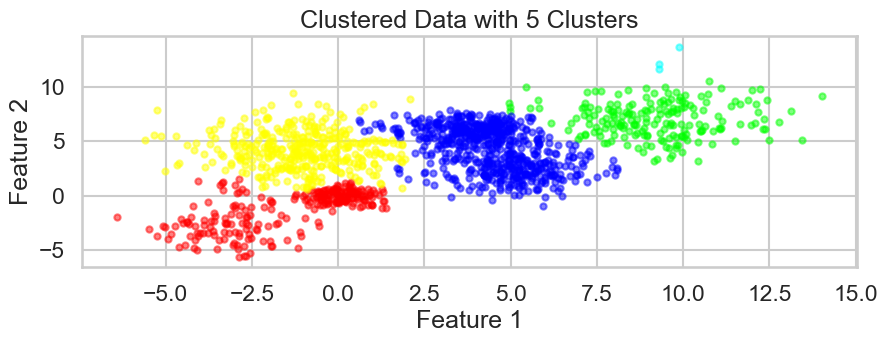

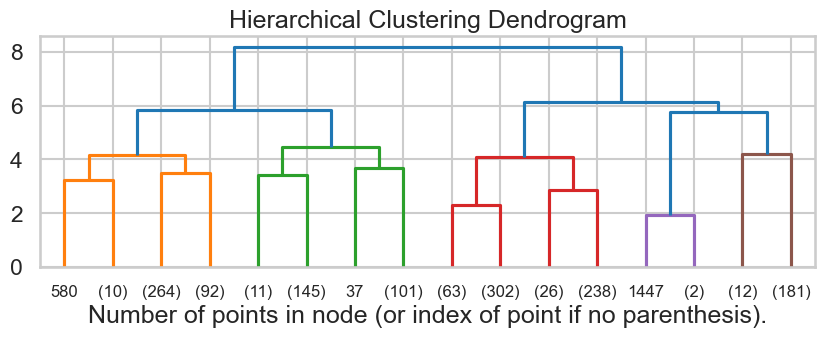

Affinity: euclidean, Linkage: single, Distance Threshold: 3
Silhouette Score: 0.17400752332621522
5


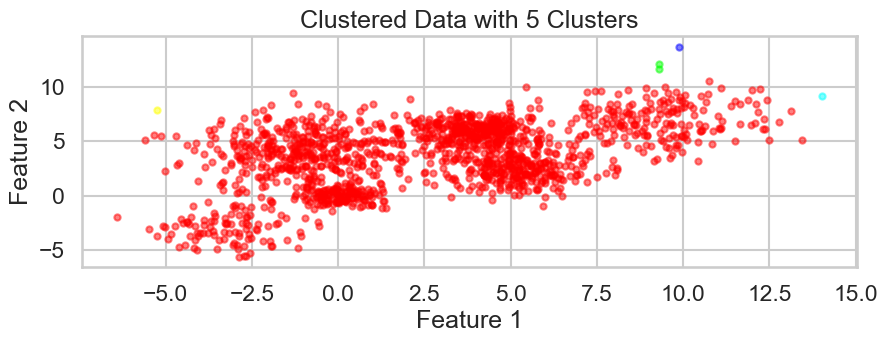

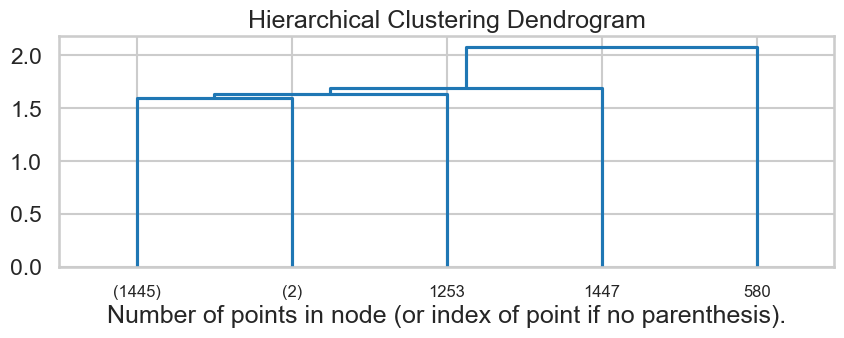

Affinity: euclidean, Linkage: single, Distance Threshold: 4
Silhouette Score: 0.3218066204847175
2


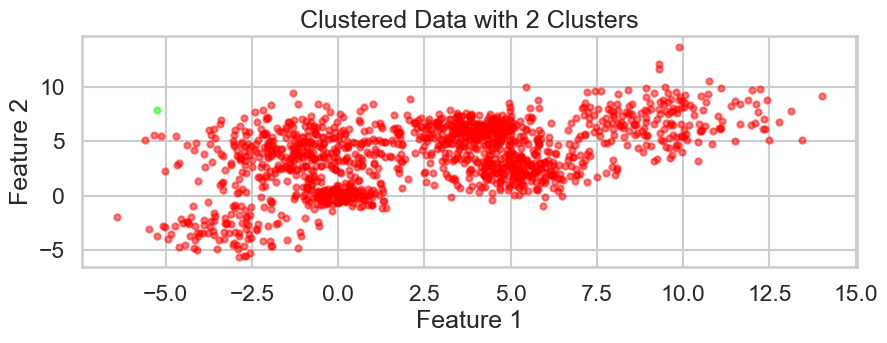

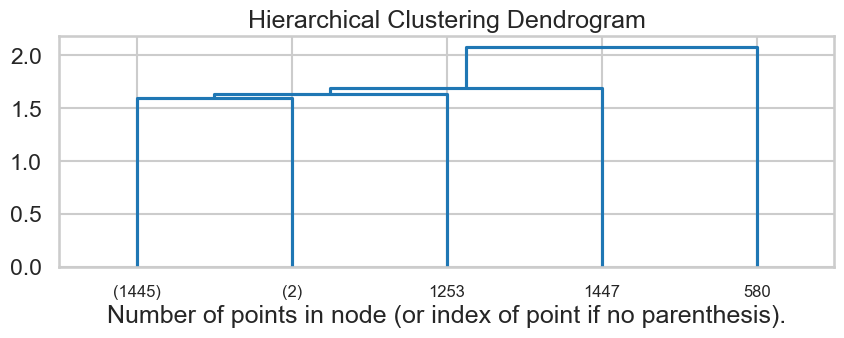

Affinity: euclidean, Linkage: single, Distance Threshold: 5
Silhouette Score: 0.08705564851389591
6


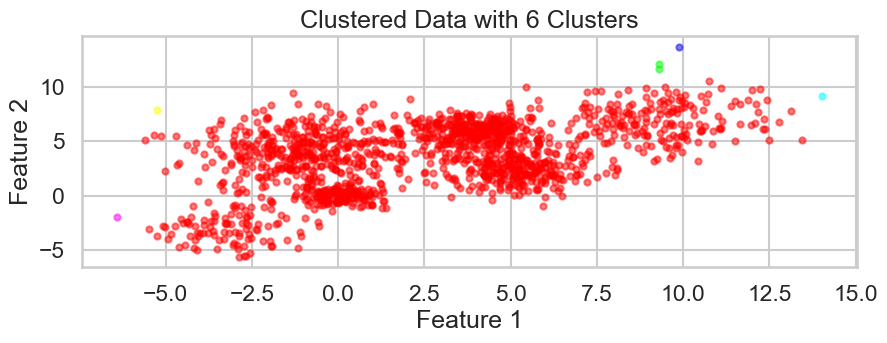

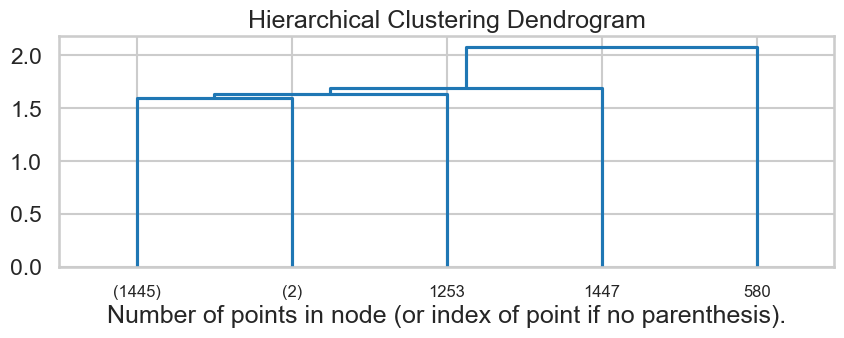

Affinity: manhattan, Linkage: average, Distance Threshold: 3
Silhouette Score: 0.38029768112070367
6


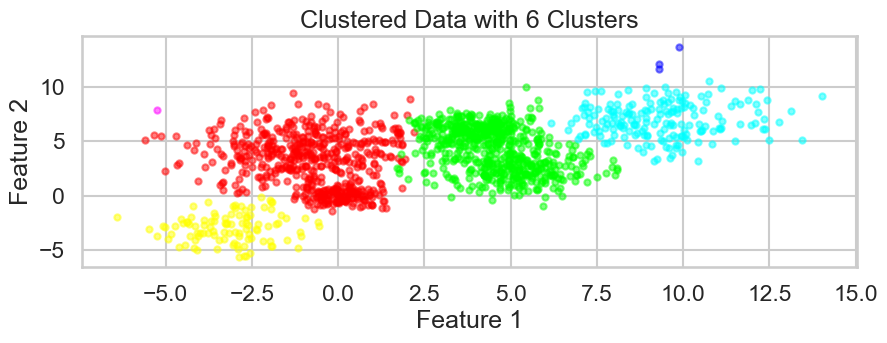

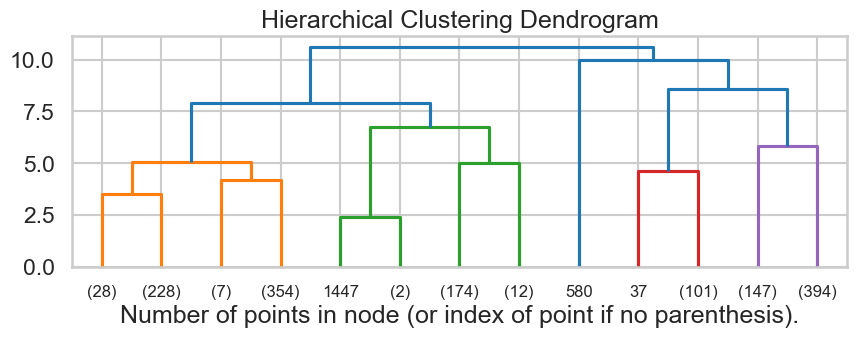

Affinity: manhattan, Linkage: average, Distance Threshold: 4
Silhouette Score: 0.3331978782243237
16


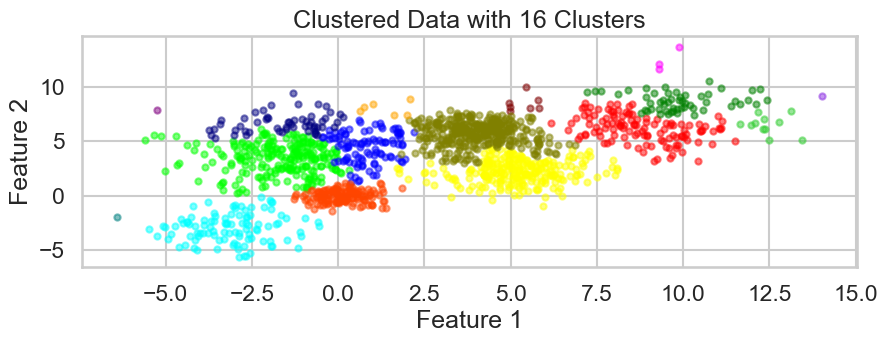

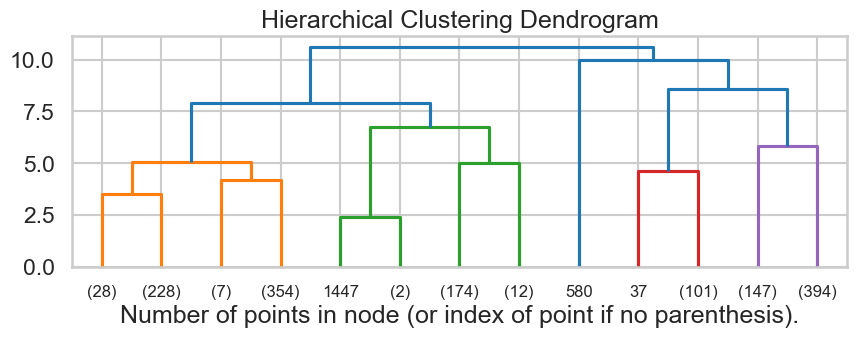

Affinity: manhattan, Linkage: average, Distance Threshold: 5
Silhouette Score: 0.399558543983381
9


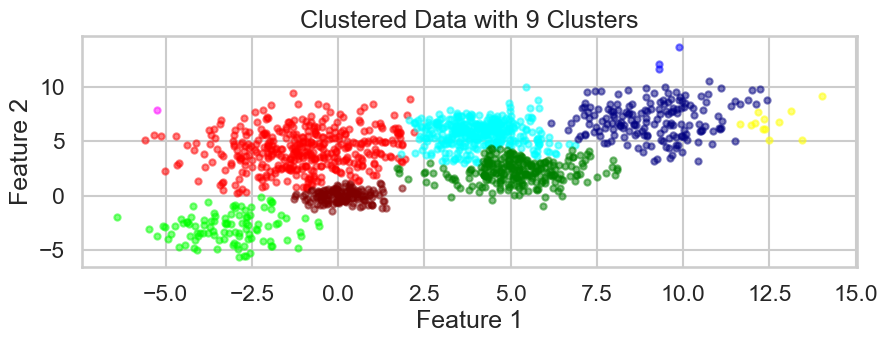

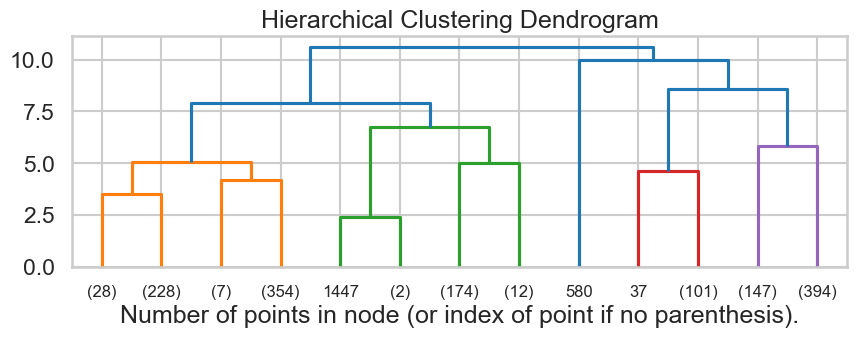

Affinity: manhattan, Linkage: single, Distance Threshold: 3
Silhouette Score: 0.08705564851389591
6


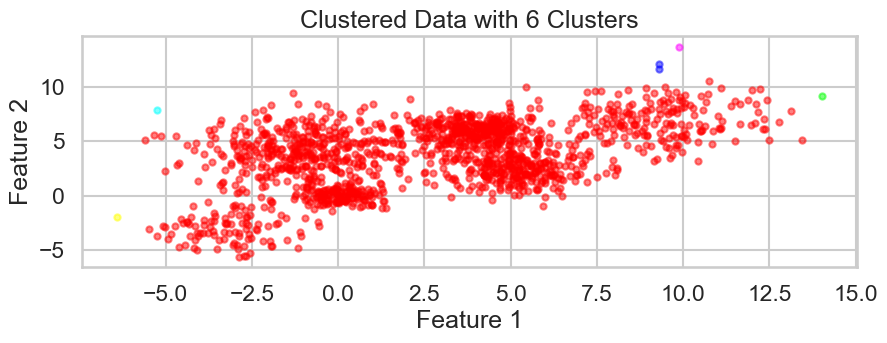

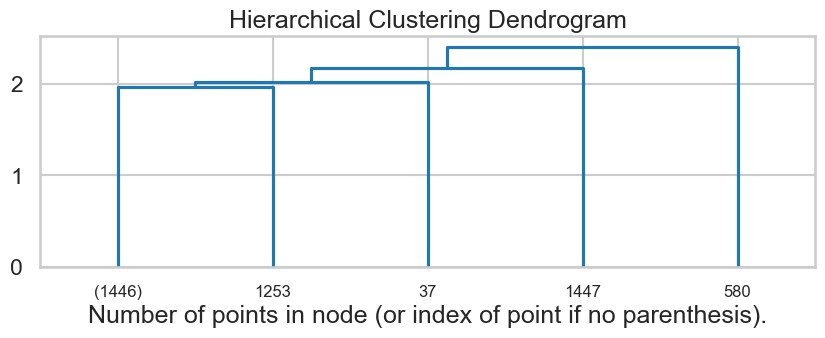

Affinity: manhattan, Linkage: single, Distance Threshold: 4
Silhouette Score: 0.14871638406533946
4


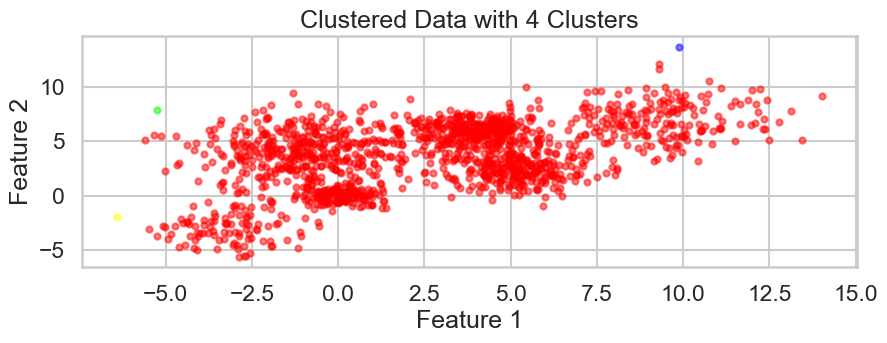

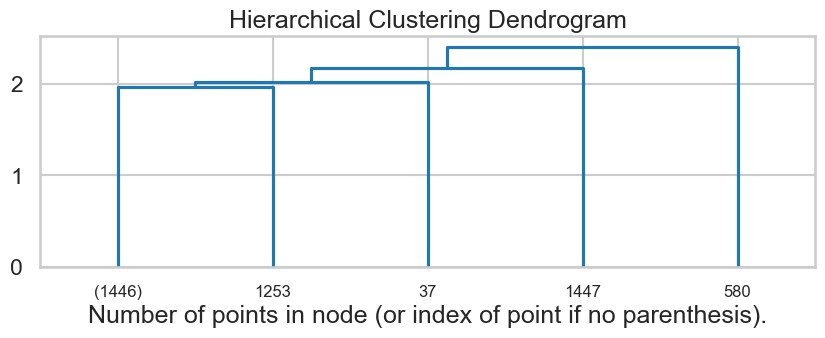

Affinity: manhattan, Linkage: single, Distance Threshold: 5
Silhouette Score: -0.144702446818925
8


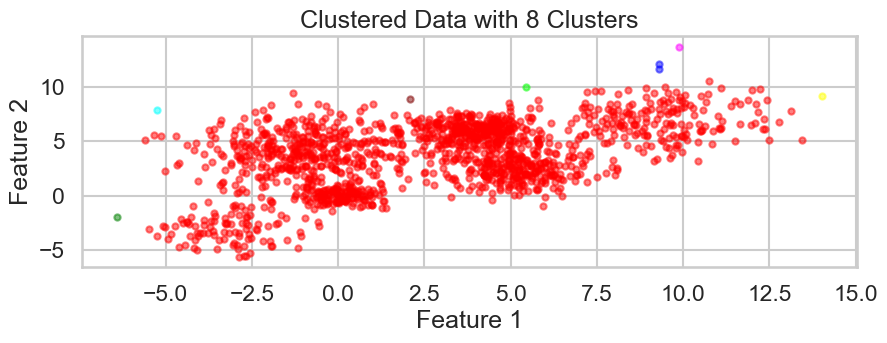

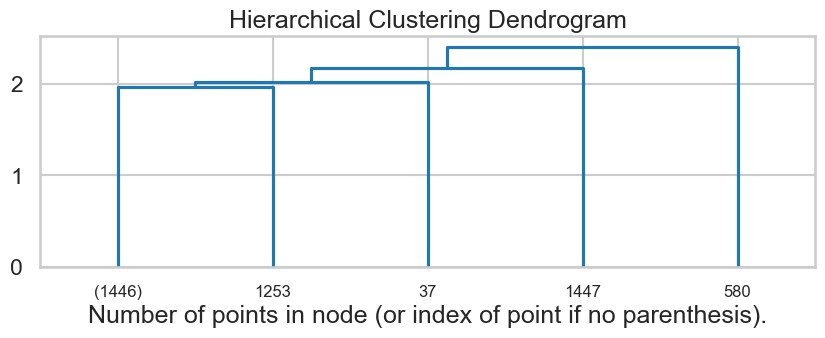

Affinity: cosine, Linkage: average, Distance Threshold: 3
Silhouette Score: 0.35251834131557364
2


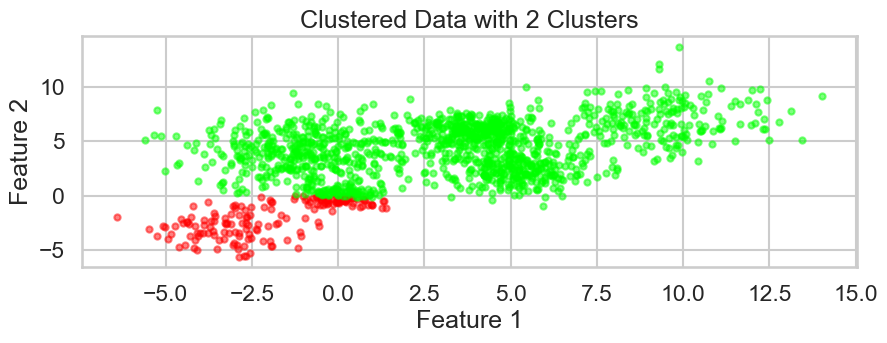

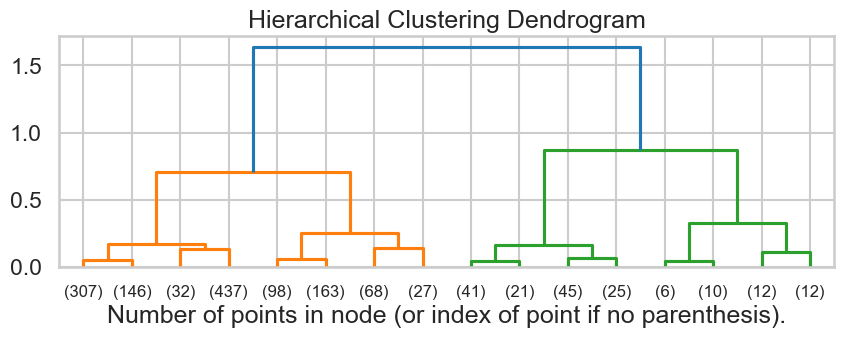

Affinity: cosine, Linkage: average, Distance Threshold: 4
Silhouette Score: 0.35251834131557364
2


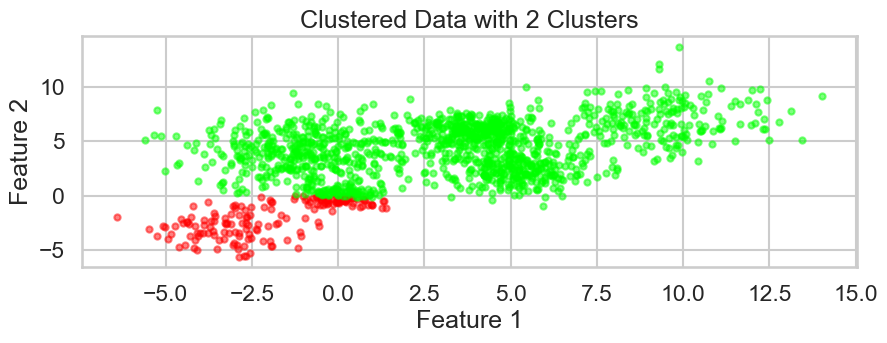

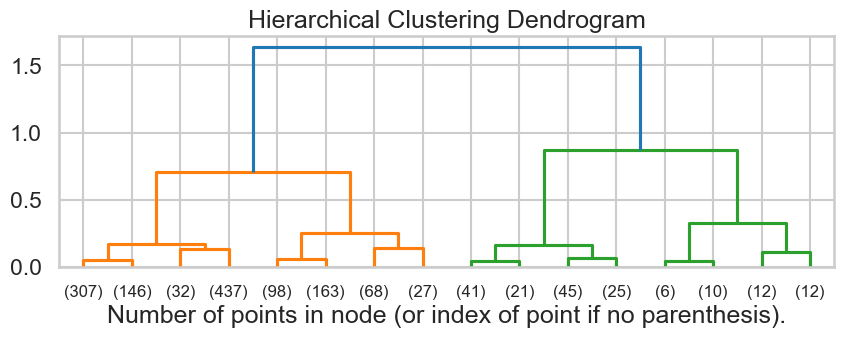

Affinity: cosine, Linkage: average, Distance Threshold: 5
Silhouette Score: 0.35251834131557364
2


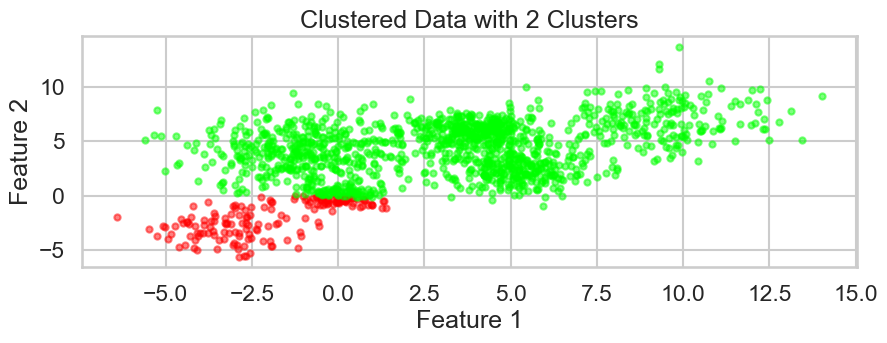

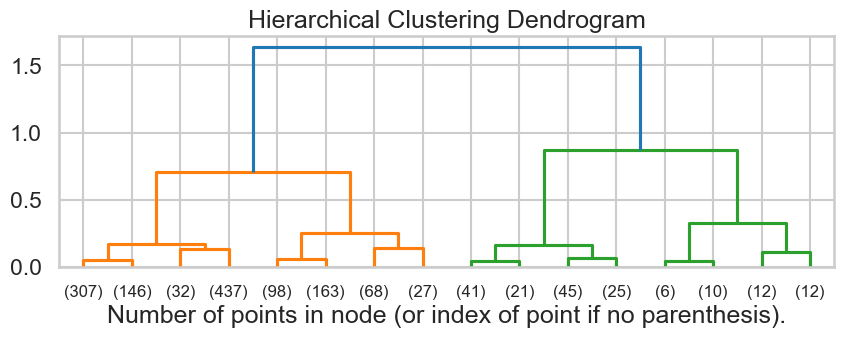

Affinity: cosine, Linkage: single, Distance Threshold: 3
Silhouette Score: -0.03872065159633617
4


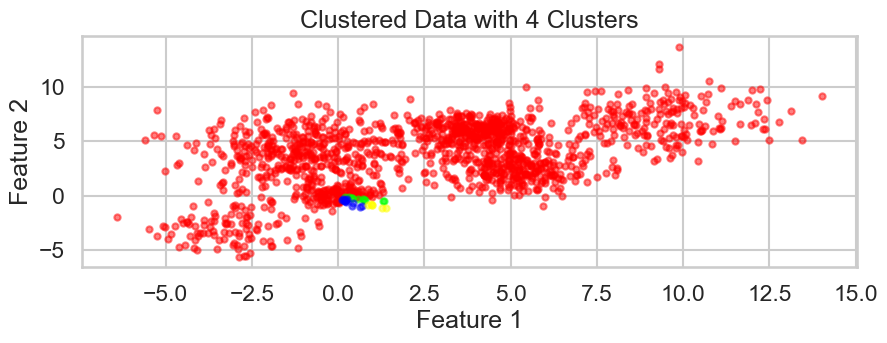

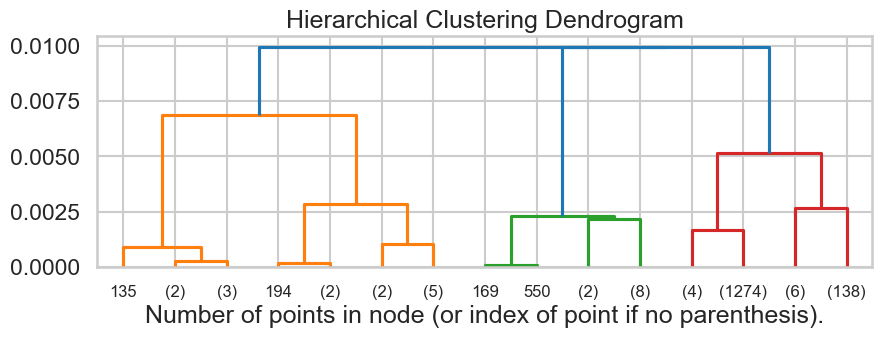

Affinity: cosine, Linkage: single, Distance Threshold: 4
Silhouette Score: -0.027300281882024397
3


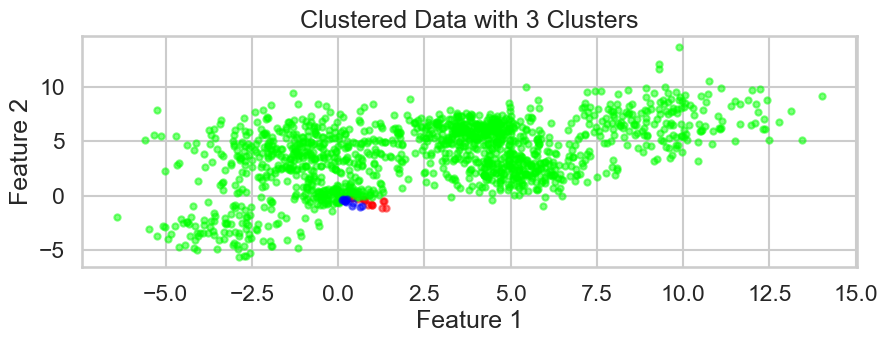

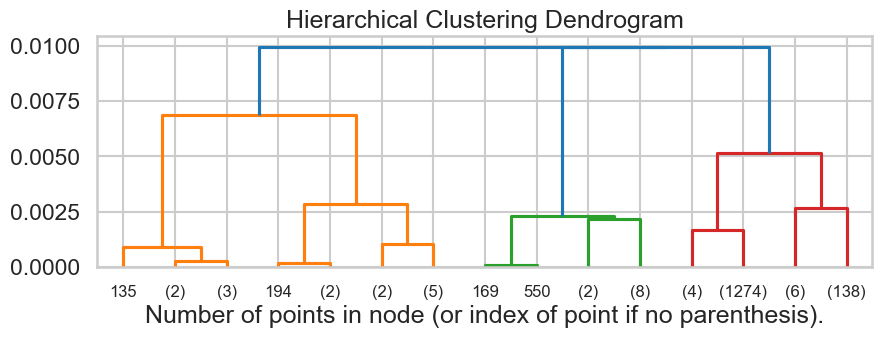

Affinity: cosine, Linkage: single, Distance Threshold: 5
Silhouette Score: -0.027300281882024397
3


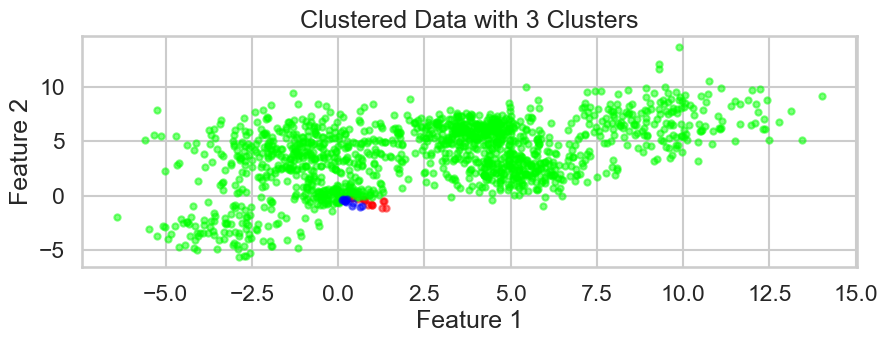

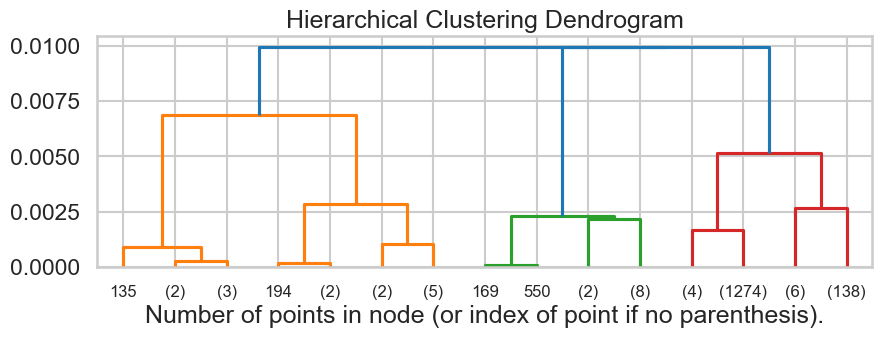

Best Silhouette Score: 0.433187948807373
Best Parameters: ('euclidean', 'average', 5)
Cluster labels for best parameters: [0 0 0 ... 4 1 1]


In [68]:



def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


X = Multi_blob_Data


# Define parameters to try
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['average', 'single']
distance_thresholds = [3,4,5]

best_silhouette_score = -1
best_parameters = None
best_labels = None

# Iterate over parameter combinations
for affinity in affinities:
    for linkage in linkages:
        for distance_threshold in distance_thresholds:
            print(f"Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold}")
            
            # Compute pairwise distances
           
            
            # Initialize AgglomerativeClustering with parameters
            model = AgglomerativeClustering(n_clusters=None, linkage=linkage,metric=affinity, distance_threshold=distance_threshold)
            
            # Fit the model to the data
            labels = model.fit_predict(Multi_blob_Data)
            for J in range (1000):        
                if (len(np.unique(model.labels_))<2 ):
                    distance_threshold=distance_threshold/2
                    model = AgglomerativeClustering(n_clusters=None, linkage=linkage,metric=affinity, distance_threshold=distance_threshold)
                    labels = model.fit_predict(Multi_blob_Data)
                elif (len(np.unique(model.labels_))>16 ):
                    distance_threshold=distance_threshold*2
                    model = AgglomerativeClustering(n_clusters=None, linkage=linkage,metric=affinity, distance_threshold=distance_threshold)
                    labels = model.fit_predict(Multi_blob_Data)
                else:
                    break;
            # Calculate silhouette score
            silhouette_avg = silhouette_score(Multi_blob_Data, labels)
            print("Silhouette Score:", silhouette_avg)
            print(len(np.unique(model.labels_)))
            display_cluster(Multi_blob_Data,km=model,num_clusters=len(np.unique(model.labels_)))
            # Plot dendrogram
            #plt.figure(figsize=(10, 5))
            plt.title("Hierarchical Clustering Dendrogram")
            # plot the top three levels of the dendrogram
            plot_dendrogram(model, truncate_mode="level", p=3)
            plt.xlabel("Number of points in node (or index of point if no parenthesis).")
            plt.show()
            
            # Update best silhouette score and parameters
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_parameters = (affinity, linkage, distance_threshold)
                best_labels = labels

# Display the resulting clusters for the best parameters
print("Best Silhouette Score:", best_silhouette_score)
print("Best Parameters:", best_parameters)
print("Cluster labels for best parameters:", best_labels)


### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

EPS: 0.1, Min_samples: 5
EPS: 0.1, Min_samples: 6
EPS: 0.1, Min_samples: 7
EPS: 0.1, Min_samples: 8
EPS: 0.1, Min_samples: 9
EPS: 0.1, Min_samples: 10
EPS: 0.1, Min_samples: 11
EPS: 0.1, Min_samples: 12
EPS: 0.1, Min_samples: 13
EPS: 0.1, Min_samples: 14
EPS: 0.1, Min_samples: 15
EPS: 0.1, Min_samples: 16
EPS: 0.1, Min_samples: 17
EPS: 0.1, Min_samples: 18
EPS: 0.1, Min_samples: 19
EPS: 0.1, Min_samples: 20
EPS: 0.1, Min_samples: 21
EPS: 0.1, Min_samples: 22
EPS: 0.1, Min_samples: 23
EPS: 0.1, Min_samples: 24
EPS: 0.1, Min_samples: 25
EPS: 0.2, Min_samples: 5
EPS: 0.2, Min_samples: 6
EPS: 0.2, Min_samples: 7
EPS: 0.2, Min_samples: 8
EPS: 0.2, Min_samples: 9
EPS: 0.2, Min_samples: 10
EPS: 0.2, Min_samples: 11
EPS: 0.2, Min_samples: 12
EPS: 0.2, Min_samples: 13
EPS: 0.2, Min_samples: 14
EPS: 0.2, Min_samples: 15
EPS: 0.2, Min_samples: 16
EPS: 0.2, Min_samples: 17
EPS: 0.2, Min_samples: 18
EPS: 0.2, Min_samples: 19
EPS: 0.2, Min_samples: 20
EPS: 0.2, Min_samples: 21
EPS: 0.2, Min_samples:

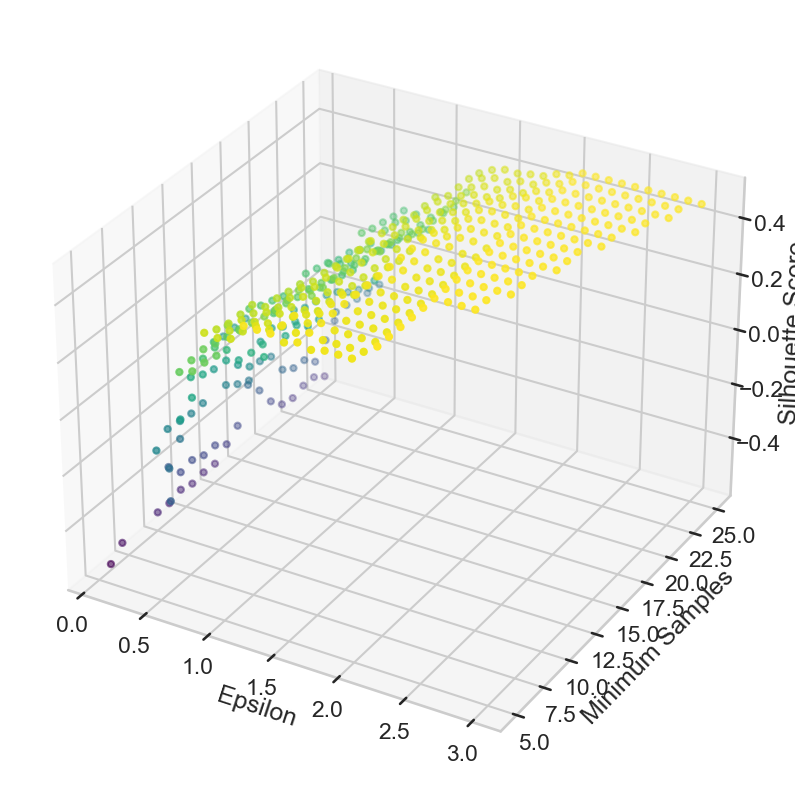

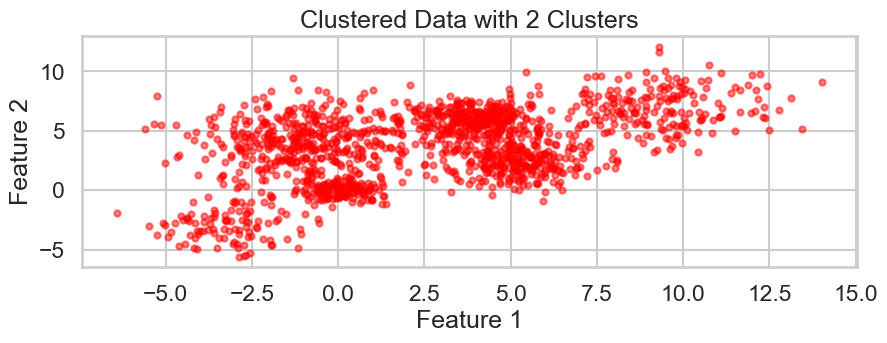

In [76]:
X = Multi_blob_Data

# Define parameters to try
EPS_range = np.linspace(0.1, 3, 30)
min_samples_range = range(5, 26)

best_silhouette_score = -1
best_parameters = None
best_labels = None
silhouette_scores = []

# Iterate over parameter combinations
for EPS in EPS_range:
    for min_samples in min_samples_range:
        print(f"EPS: {EPS}, Min_samples: {min_samples}")
        
        # Initialize DBSCAN with parameters
        dbscan = DBSCAN(eps=EPS, min_samples=min_samples)
        
        # Fit the model to the data
        labels = dbscan.fit_predict(X)
          
        if (len(np.unique(dbscan.labels_))>1 and len(np.unique(dbscan.labels_))<=16):
            silhouette_avg = silhouette_score(X, labels)
            silhouette_scores.append((EPS, min_samples, silhouette_avg))
            #display_cluster(Multi_blob_Data,km=dbscan,num_clusters=len(np.unique(dbscan.labels_)))
        # Calculate silhouette score

        
        # Update best silhouette score and parameters
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_parameters = (EPS, min_samples)
            best_labels = labels
x = [s[0] for s in silhouette_scores]
y = [s[1] for s in silhouette_scores]
z = [s[2] for s in silhouette_scores]

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=z, cmap='viridis') #color scheme that ranges from a deep blue (for low values) to a bright yellow (for high values)
ax.set_xlabel('Epsilon')
ax.set_ylabel('Minimum Samples')
ax.set_zlabel('Silhouette Score')
plt.show()
dbscan = DBSCAN(eps=best_parameters[0], min_samples=best_parameters[1])
labels = dbscan.fit_predict(X)
display_cluster(Multi_blob_Data,km=dbscan,num_clusters=len(np.unique(dbscan.labels_)))
        # Fit the model to the data
    

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


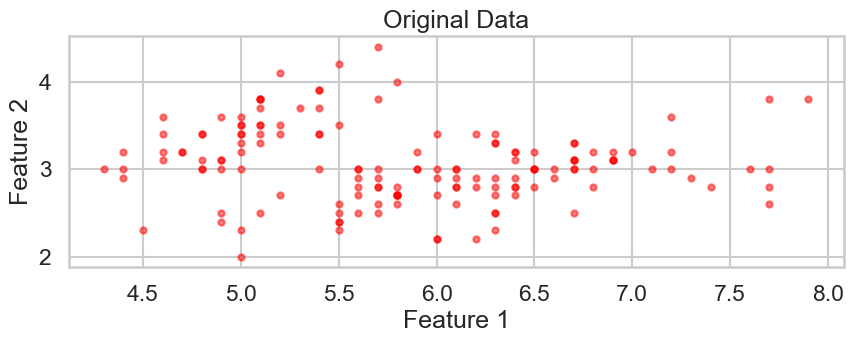

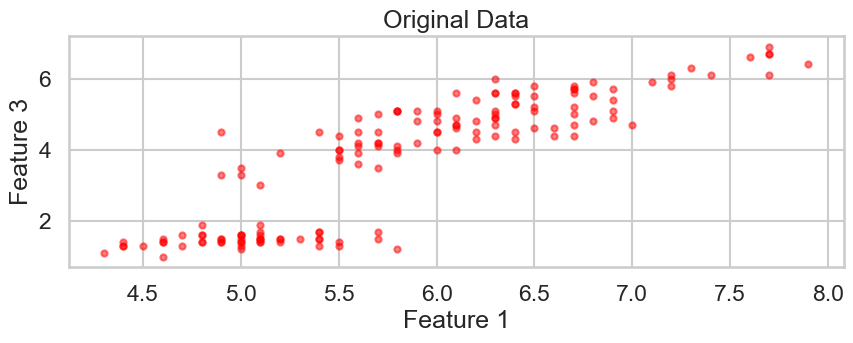

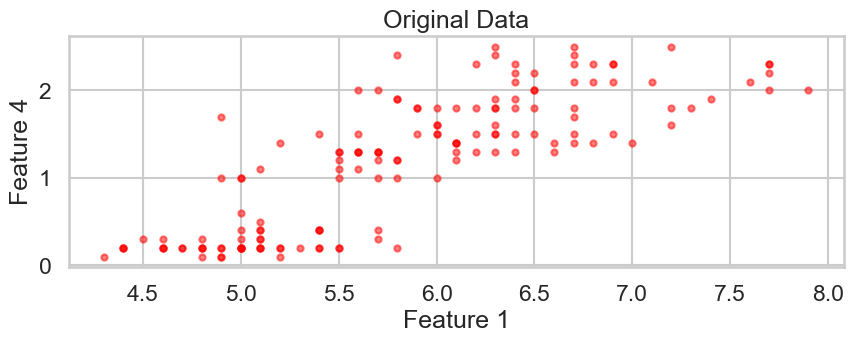

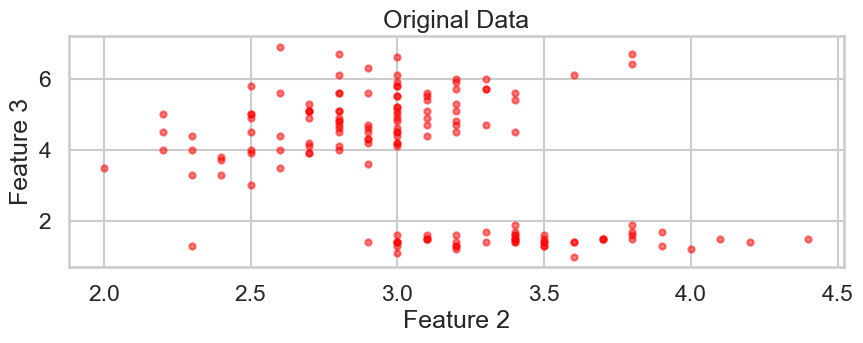

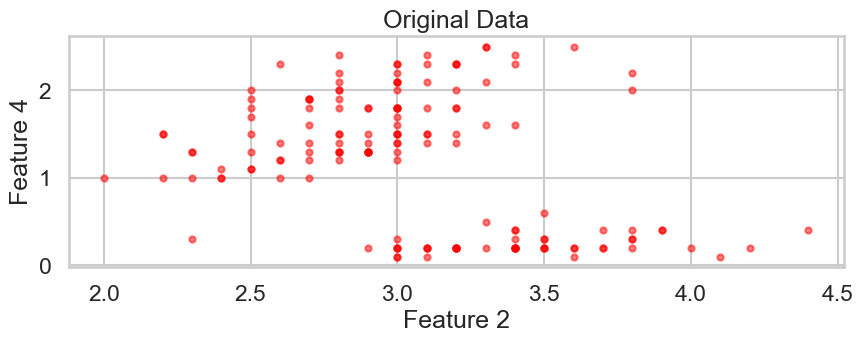

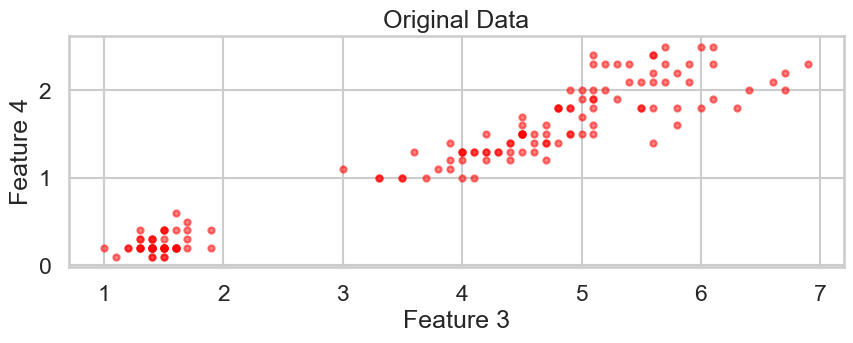

In [80]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
#list(iris_data.target)
X = np.array(iris_data.data)
Y= np.array(iris_data.target)
display_cluster(X)

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

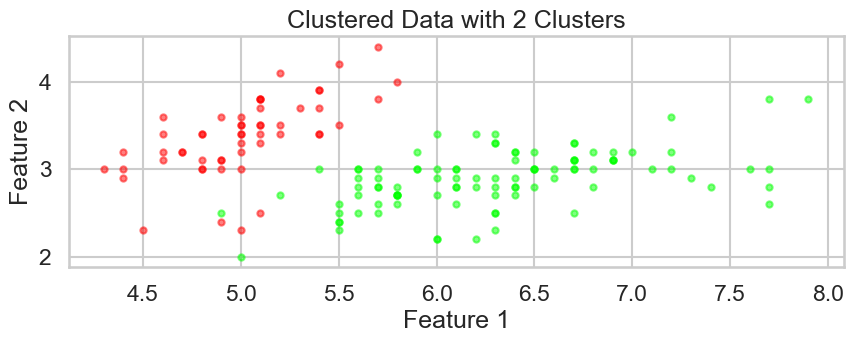

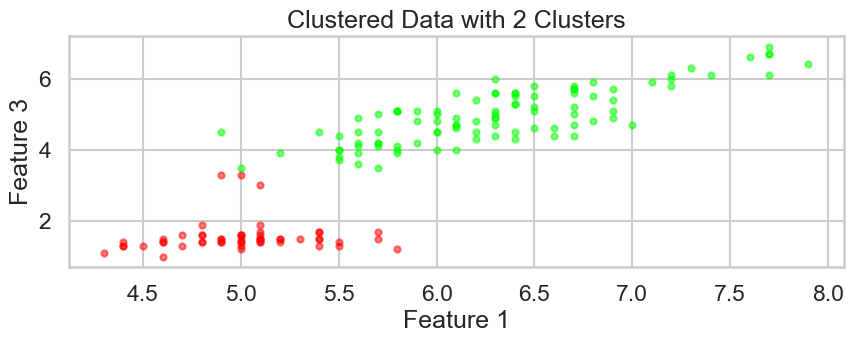

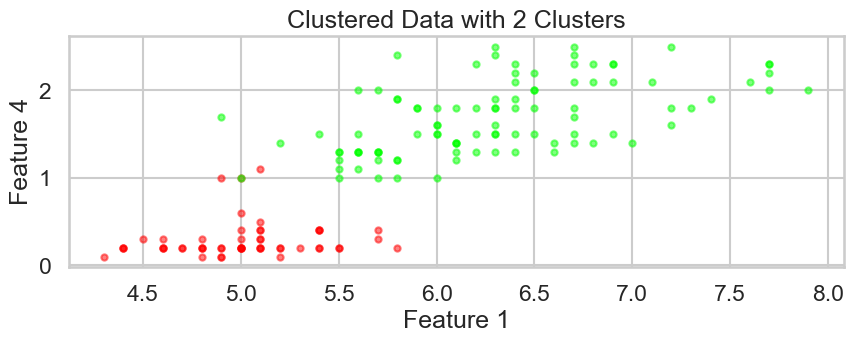

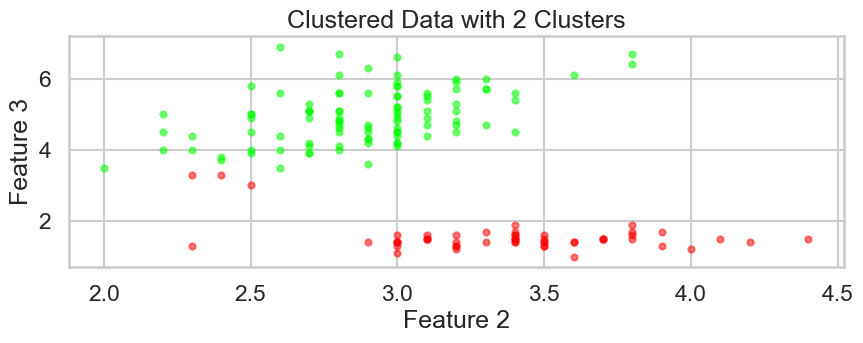

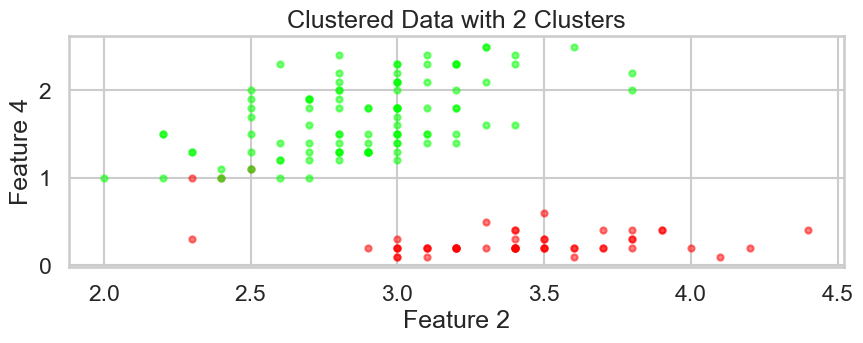

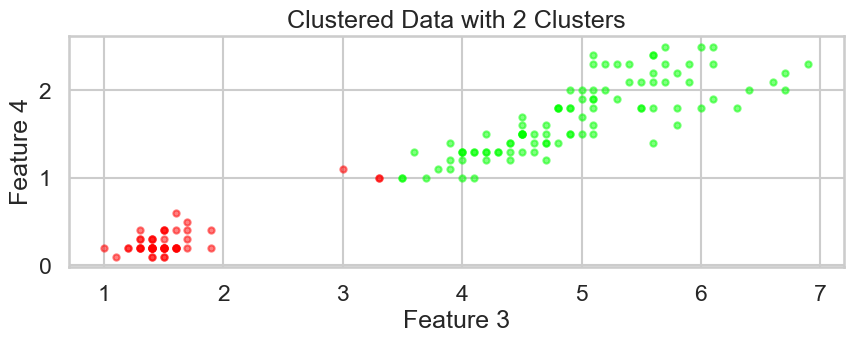

Cluster centers: [[5.00566038 3.36981132 1.56037736 0.29056604]
 [6.30103093 2.88659794 4.95876289 1.69587629]]
Cluster labels: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1]


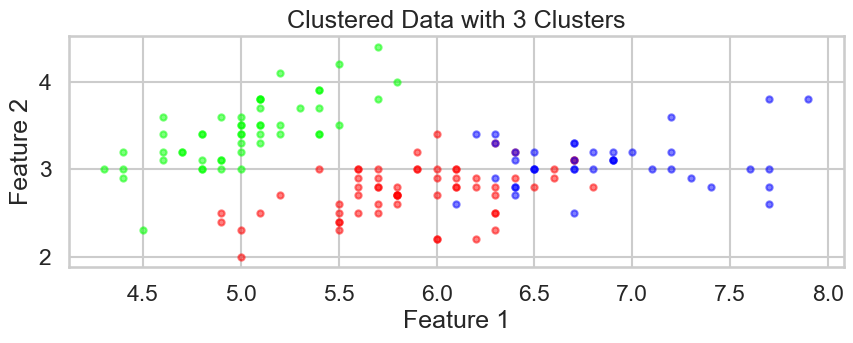

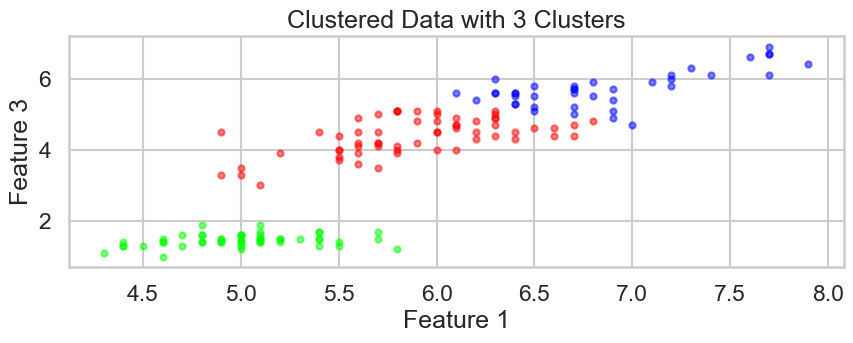

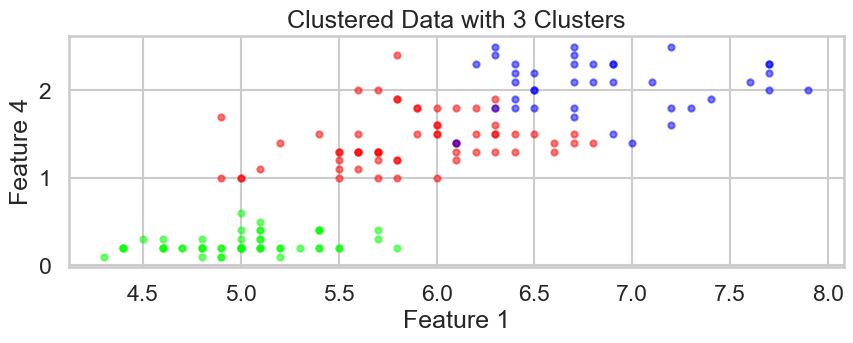

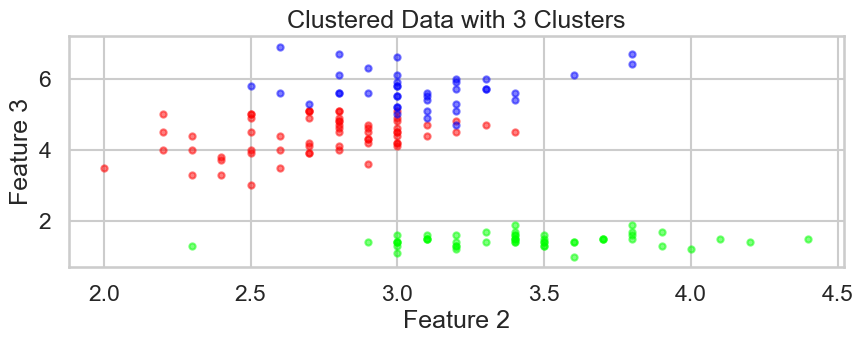

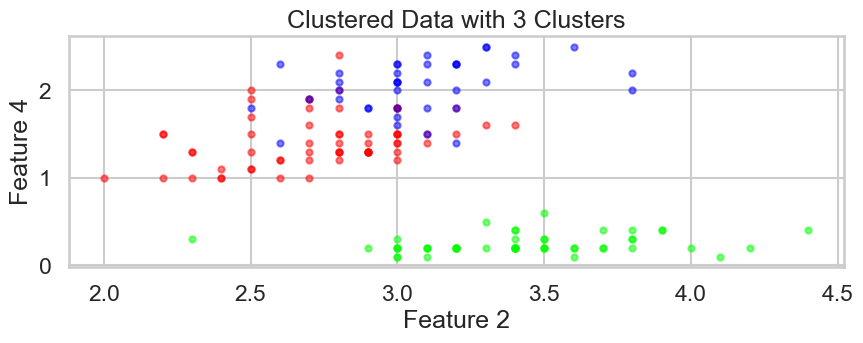

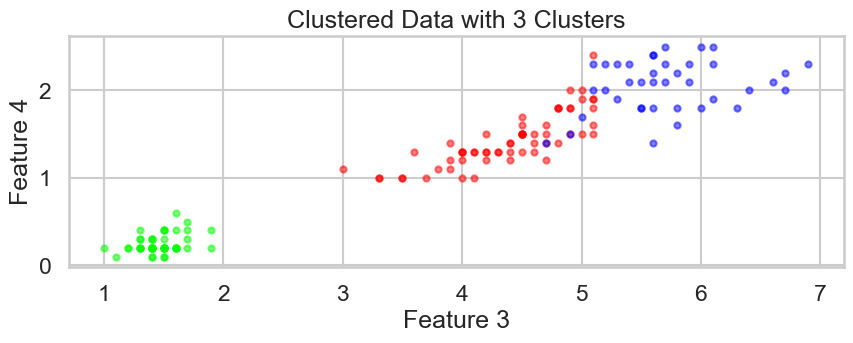

Cluster centers: [[5.88360656 2.74098361 4.38852459 1.43442623]
 [5.006      3.428      1.462      0.246     ]
 [6.85384615 3.07692308 5.71538462 2.05384615]]
Cluster labels: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 2 2 2 2 0 2 2 2 2
 2 2 0 0 2 2 2 2 0 2 0 2 0 2 2 0 0 2 2 2 2 2 0 2 2 2 2 0 2 2 2 0 2 2 2 0 2
 2 0]


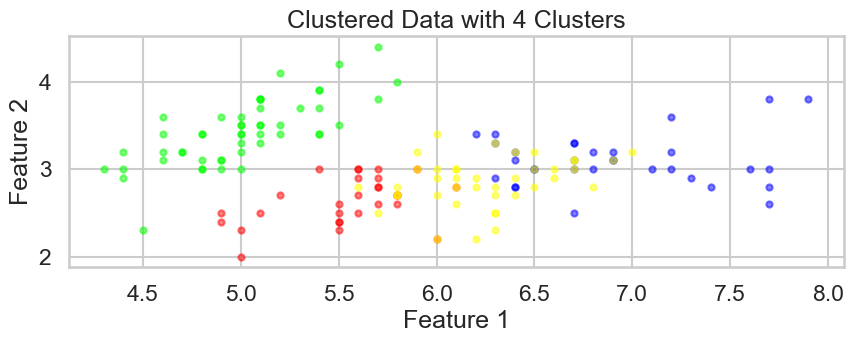

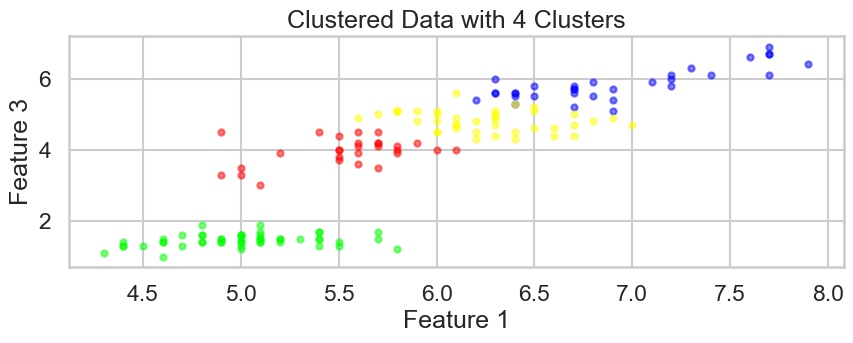

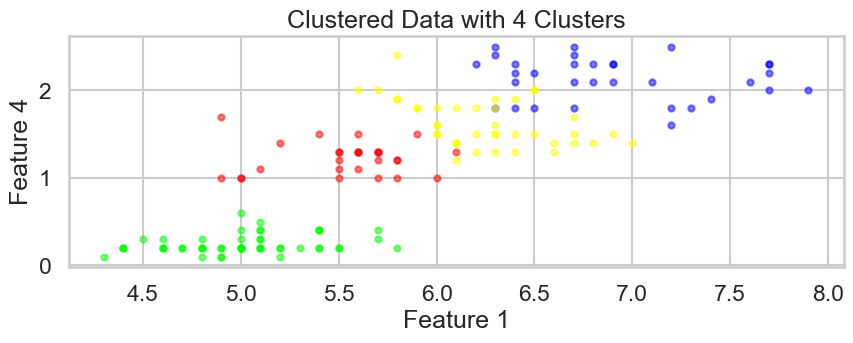

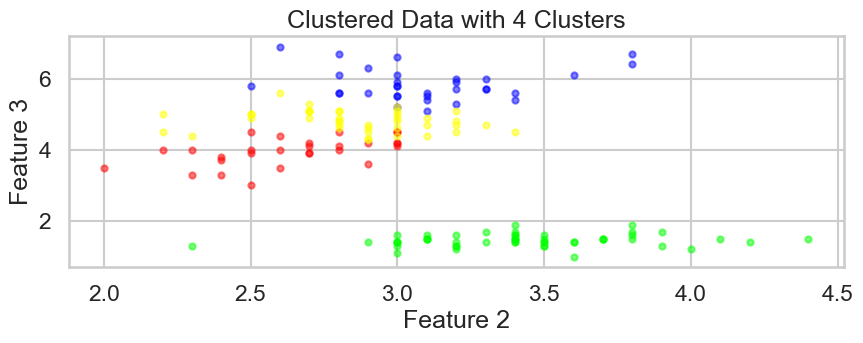

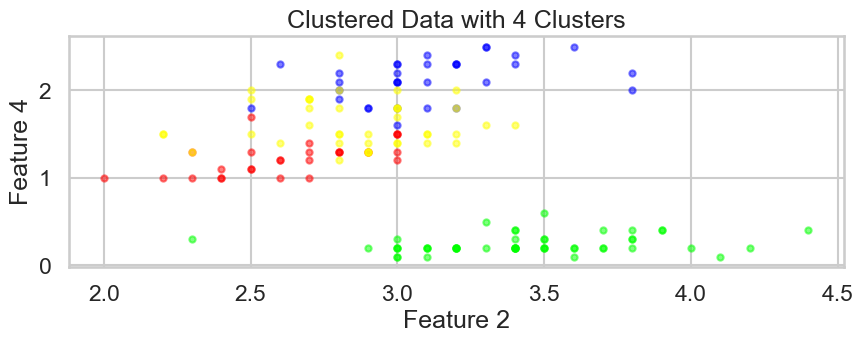

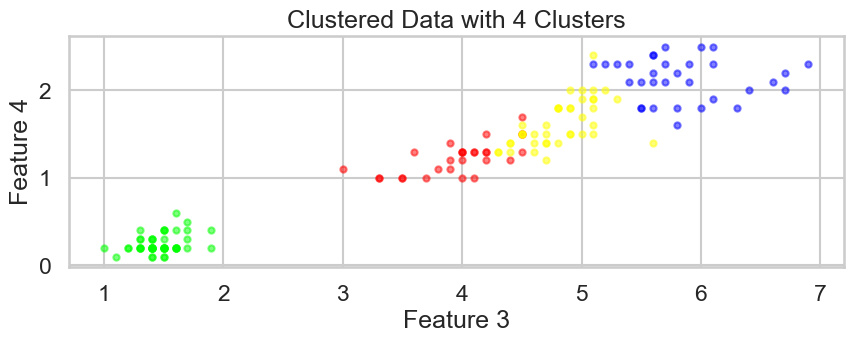

Cluster centers: [[5.53214286 2.63571429 3.96071429 1.22857143]
 [5.006      3.428      1.462      0.246     ]
 [6.9125     3.1        5.846875   2.13125   ]
 [6.2525     2.855      4.815      1.625     ]]
Cluster labels: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 3 3 3 0 3 0 3 0 3 0 0 0 0 3 0 3 0 0 3 0 3 0 3 3
 3 3 3 3 3 0 0 0 0 3 0 3 3 3 0 0 0 3 0 0 0 0 0 3 0 0 2 3 2 2 2 2 0 2 2 2 3
 3 2 3 3 2 2 2 2 3 2 3 2 3 2 2 3 3 2 2 2 2 2 3 3 2 2 2 3 2 2 2 3 2 2 2 3 3
 2 3]


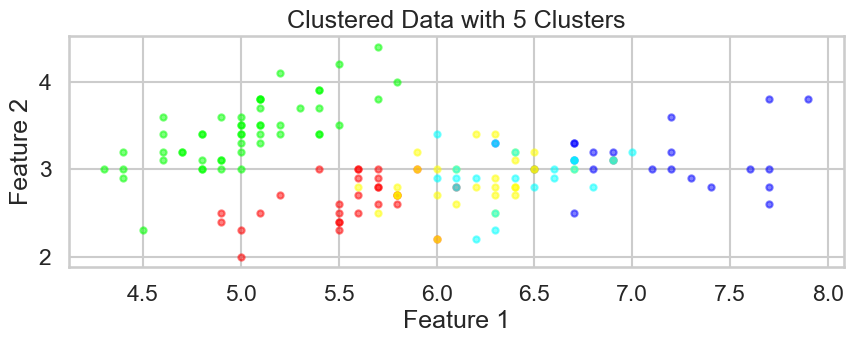

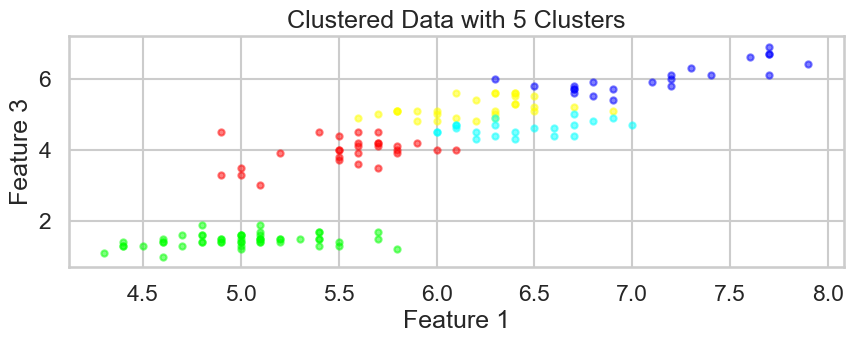

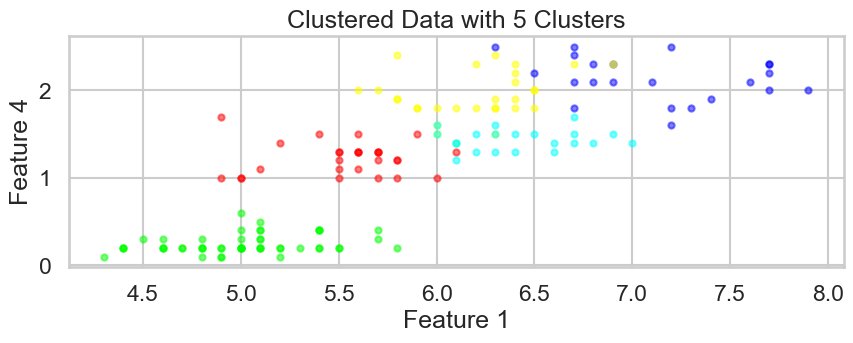

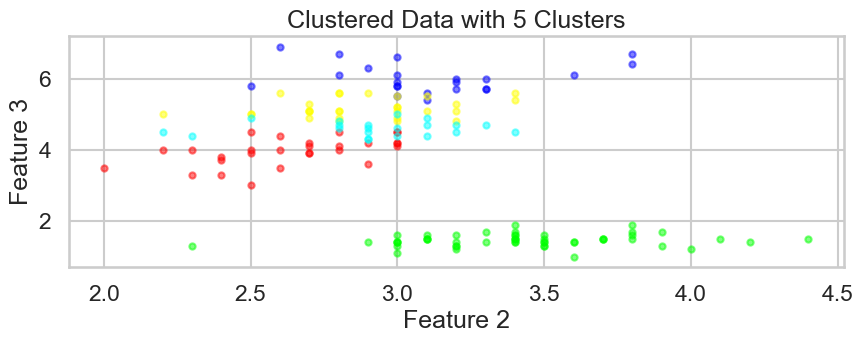

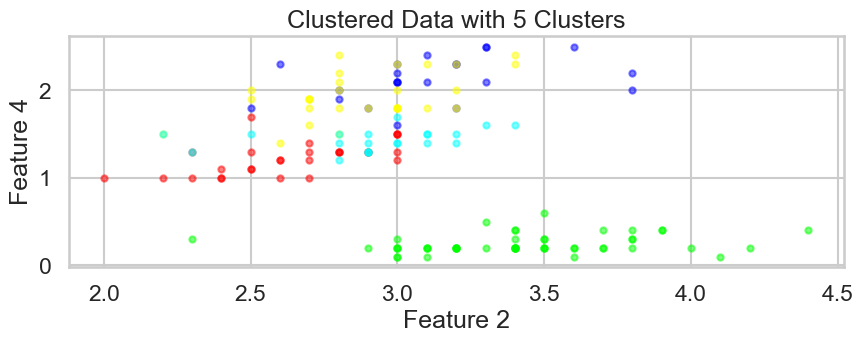

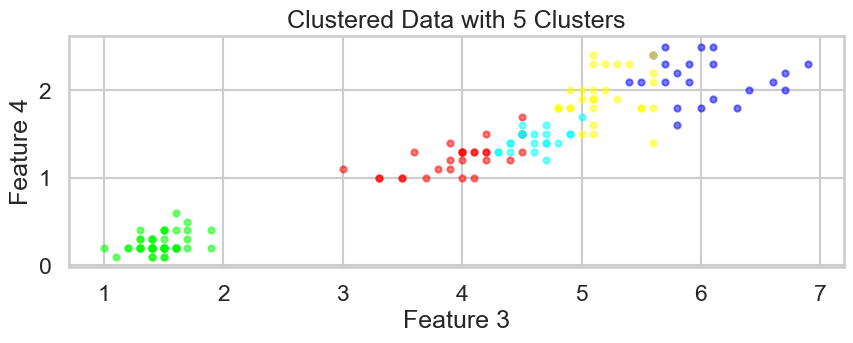

Cluster centers: [[5.53214286 2.63571429 3.96071429 1.22857143]
 [5.006      3.428      1.462      0.246     ]
 [7.12272727 3.11363636 6.03181818 2.13181818]
 [6.19655172 2.88275862 5.18275862 1.93448276]
 [6.42380952 2.91904762 4.6047619  1.43809524]]
Cluster labels: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 4 4 4 0 4 0 4 0 4 0 0 0 0 4 0 4 0 0 4 0 3 0 4 4
 4 4 4 4 4 0 0 0 0 3 0 4 4 4 0 0 0 4 0 0 0 0 0 4 0 0 2 3 2 3 2 2 0 2 2 2 3
 3 2 3 3 3 3 2 2 3 2 3 2 3 2 2 3 3 3 2 2 2 3 3 3 2 3 3 3 2 2 3 3 2 2 3 3 3
 3 3]


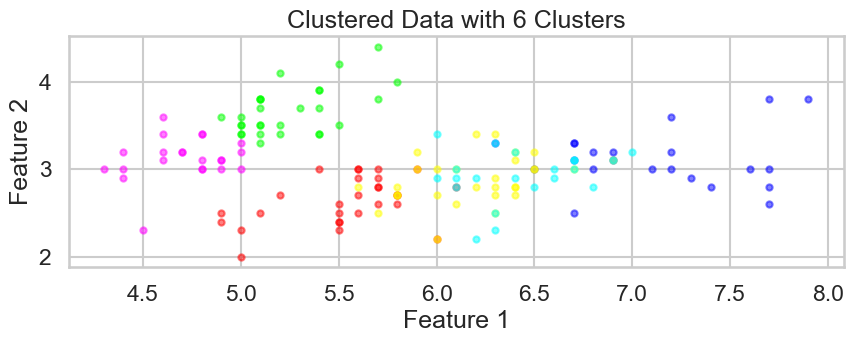

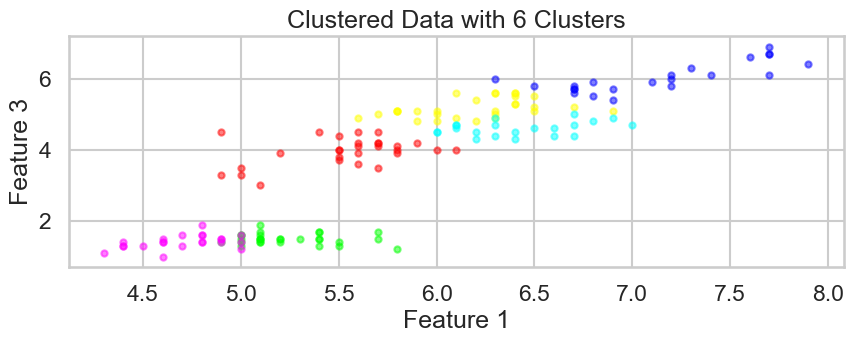

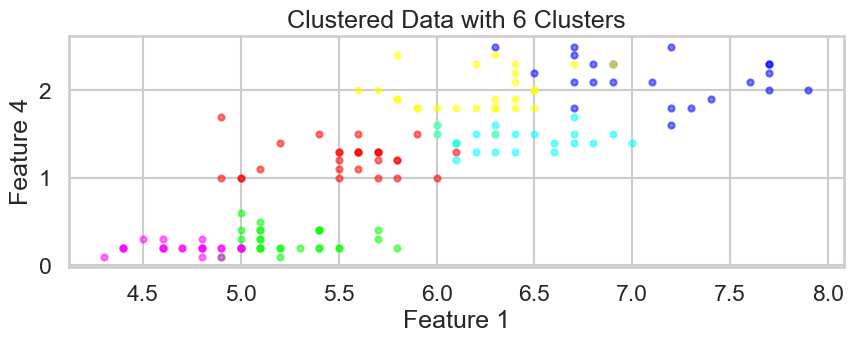

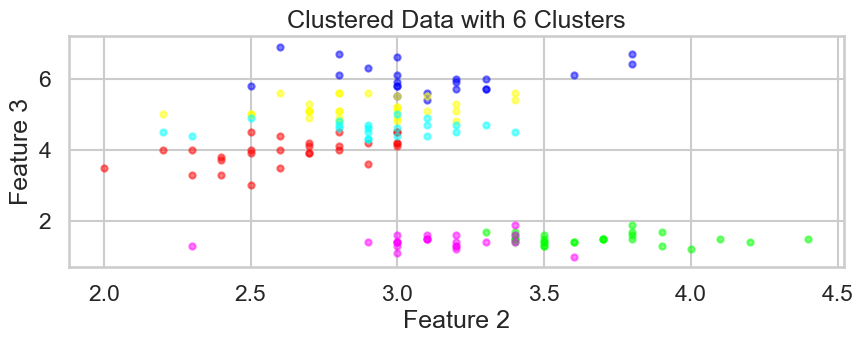

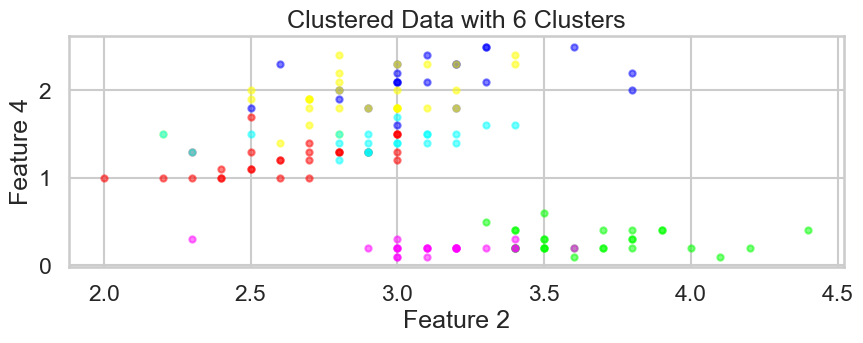

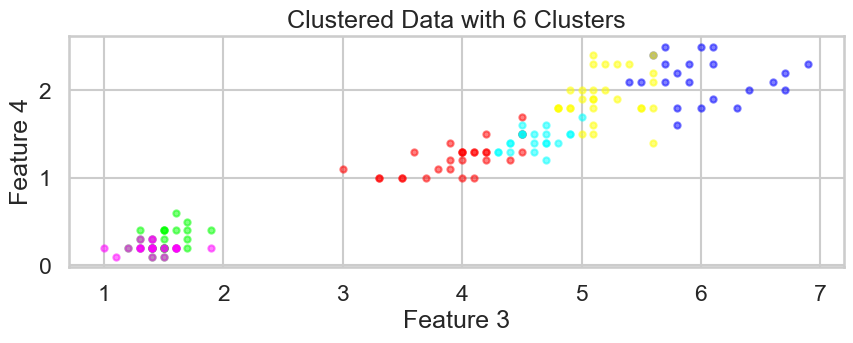

Cluster centers: [[5.53214286 2.63571429 3.96071429 1.22857143]
 [5.24285714 3.66785714 1.5        0.28214286]
 [7.12272727 3.11363636 6.03181818 2.13181818]
 [6.19655172 2.88275862 5.18275862 1.93448276]
 [6.42380952 2.91904762 4.6047619  1.43809524]
 [4.70454545 3.12272727 1.41363636 0.2       ]]
Cluster labels: [1 5 5 5 1 1 5 1 5 5 1 5 5 5 1 1 1 1 1 1 1 1 5 1 5 5 1 1 1 5 5 1 1 1 5 5 1
 1 5 1 1 5 5 1 1 5 1 5 1 5 4 4 4 0 4 0 4 0 4 0 0 0 0 4 0 4 0 0 4 0 3 0 4 4
 4 4 4 4 4 0 0 0 0 3 0 4 4 4 0 0 0 4 0 0 0 0 0 4 0 0 2 3 2 3 2 2 0 2 2 2 3
 3 2 3 3 3 3 2 2 3 2 3 2 3 2 2 3 3 3 2 2 2 3 3 3 2 3 3 3 2 2 3 3 2 2 3 3 3
 3 3]


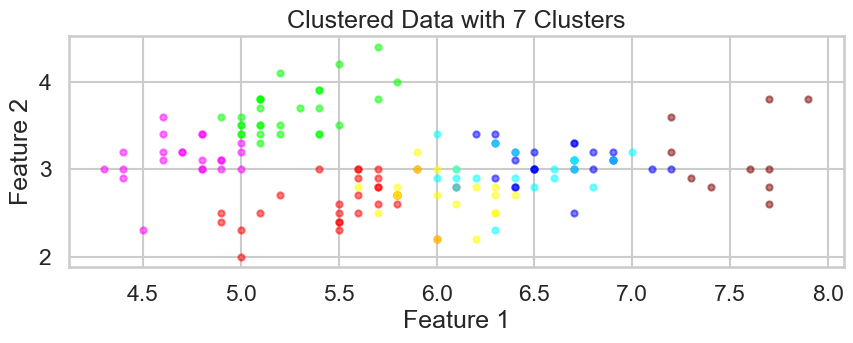

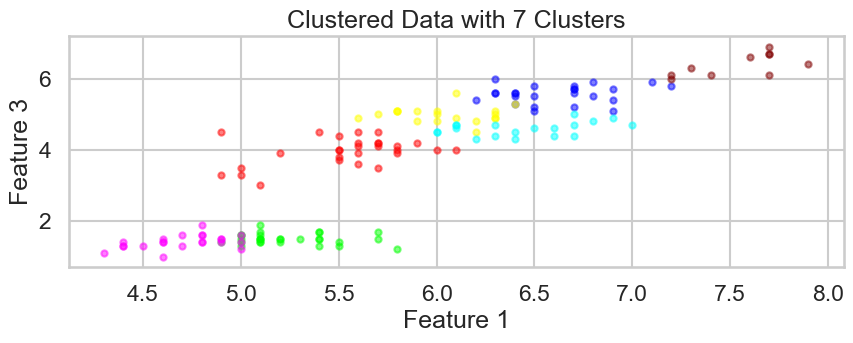

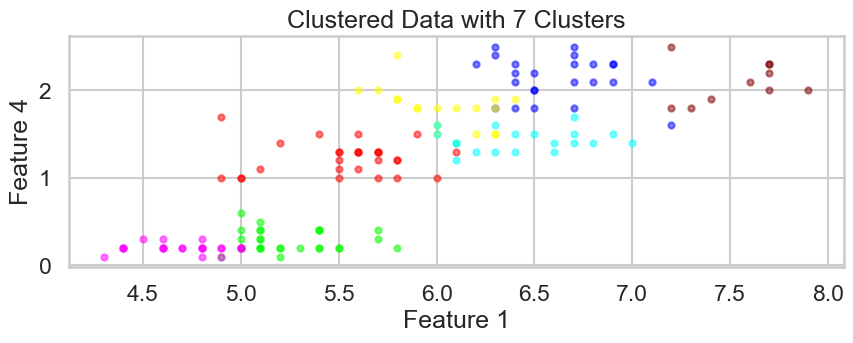

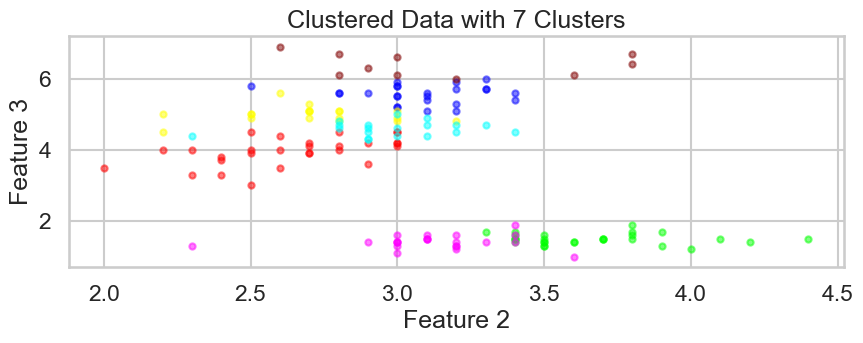

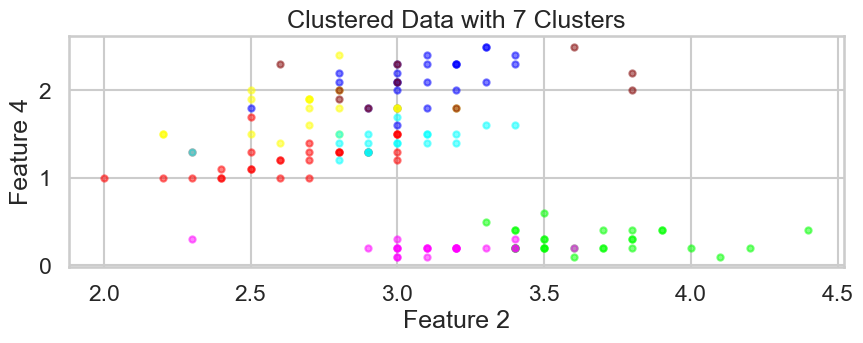

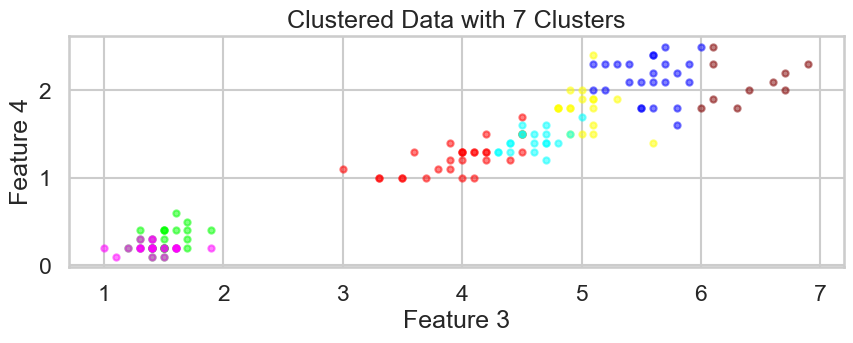

Cluster centers: [[5.53214286 2.63571429 3.96071429 1.22857143]
 [5.24285714 3.66785714 1.5        0.28214286]
 [6.61666667 3.07916667 5.5625     2.1375    ]
 [6.03684211 2.70526316 5.         1.77894737]
 [6.44210526 2.97894737 4.59473684 1.43157895]
 [4.70454545 3.12272727 1.41363636 0.2       ]
 [7.54       3.15       6.39       2.09      ]]
Cluster labels: [1 5 5 5 1 1 5 1 5 5 1 5 5 5 1 1 1 1 1 1 1 1 5 1 5 5 1 1 1 5 5 1 1 1 5 5 1
 1 5 1 1 5 5 1 1 5 1 5 1 5 4 4 4 0 4 0 4 0 4 0 0 0 0 4 0 4 0 0 3 0 3 0 3 4
 4 4 4 4 4 0 0 0 0 3 0 4 4 4 0 0 0 4 0 0 0 0 0 4 0 0 2 3 2 2 2 6 0 6 2 6 2
 3 2 3 3 2 2 6 6 3 2 3 6 3 2 6 3 3 2 2 6 6 2 3 3 6 2 2 3 2 2 2 3 2 2 2 3 2
 2 3]


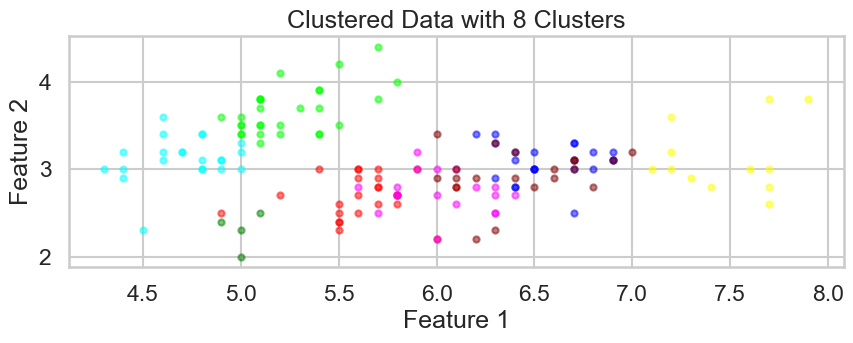

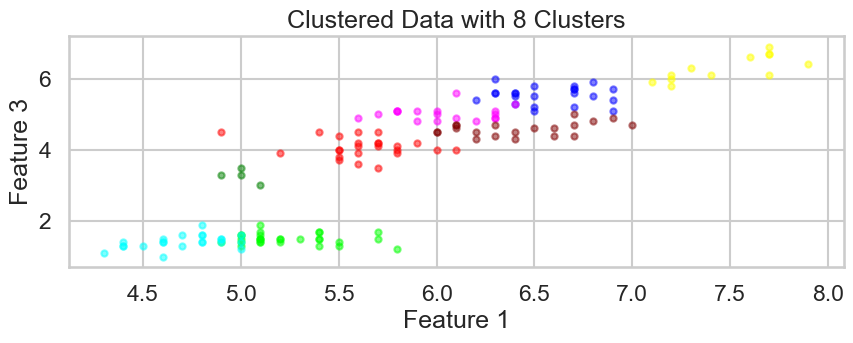

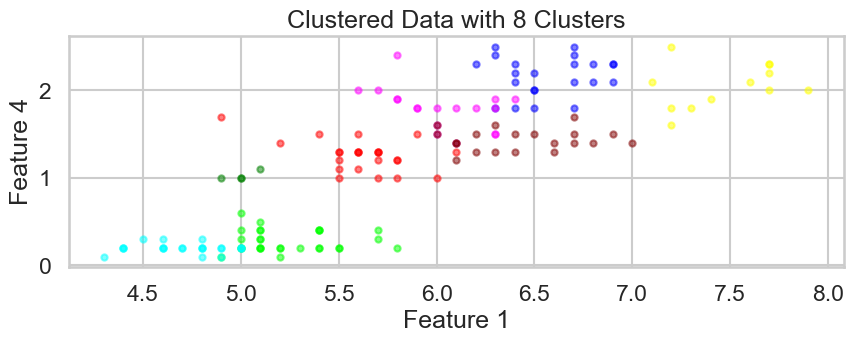

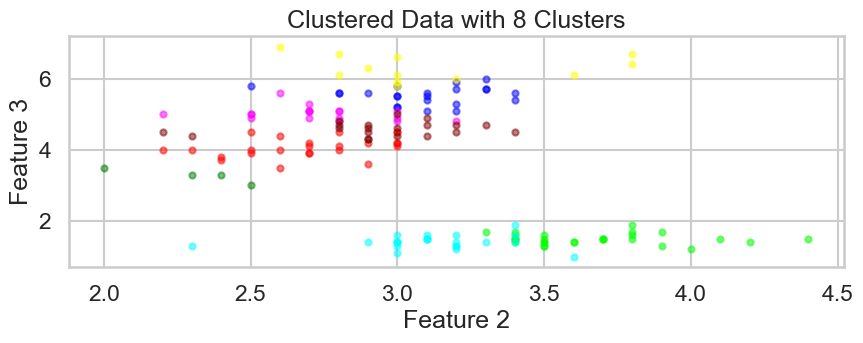

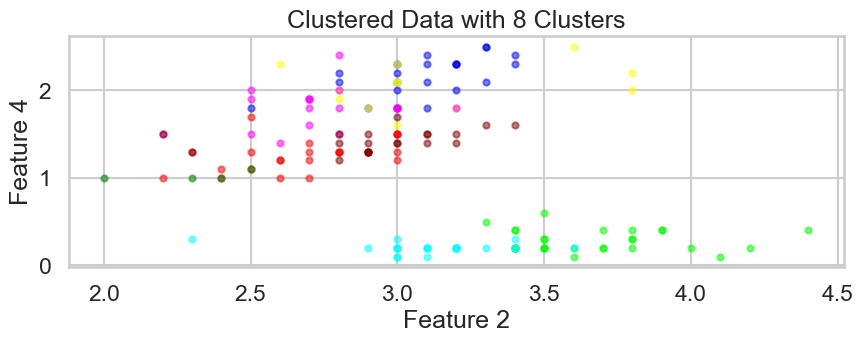

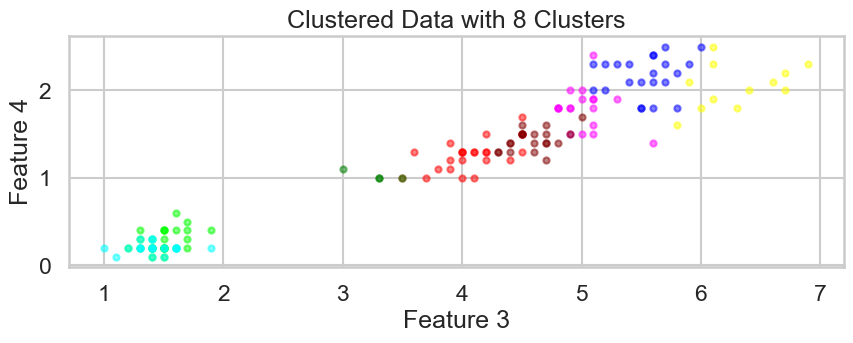

Cluster centers: [[5.62083333 2.69166667 4.075      1.2625    ]
 [5.24285714 3.66785714 1.5        0.28214286]
 [6.56818182 3.08636364 5.53636364 2.16363636]
 [7.475      3.125      6.3        2.05      ]
 [4.70454545 3.12272727 1.41363636 0.2       ]
 [6.02777778 2.73333333 5.02777778 1.79444444]
 [6.43       2.94       4.59       1.435     ]
 [5.         2.3        3.275      1.025     ]]
Cluster labels: [1 4 4 4 1 1 4 1 4 4 1 4 4 4 1 1 1 1 1 1 1 1 4 1 4 4 1 1 1 4 4 1 1 1 4 4 1
 1 4 1 1 4 4 1 1 4 1 4 1 4 6 6 6 0 6 0 6 7 6 0 7 0 0 6 0 6 0 0 6 0 5 0 5 6
 6 6 6 6 6 0 0 0 0 5 0 6 6 6 0 0 0 6 0 7 0 0 0 6 7 0 2 5 3 2 2 3 0 3 2 3 2
 5 2 5 5 2 2 3 3 5 2 5 3 5 2 3 5 5 2 3 3 3 2 5 5 3 2 2 5 2 2 2 5 2 2 2 5 2
 2 5]


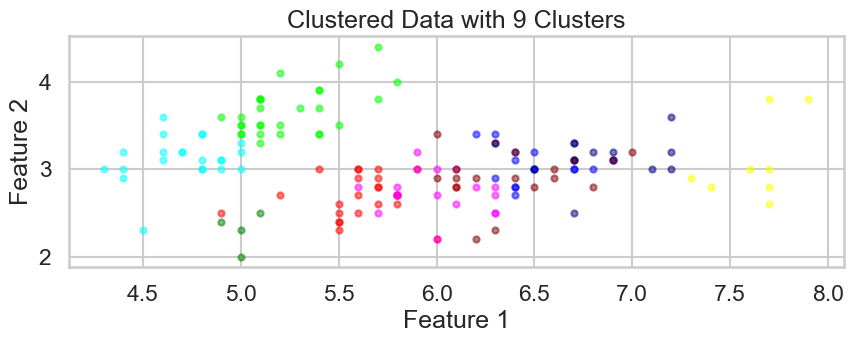

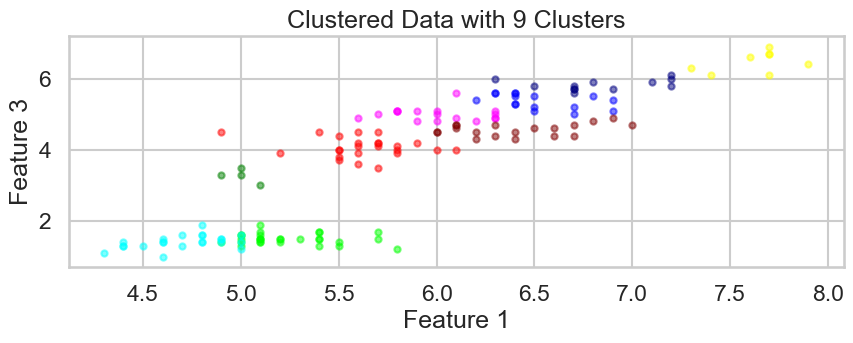

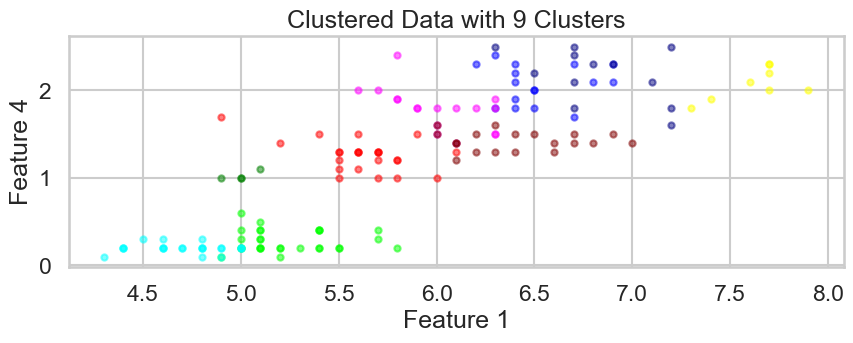

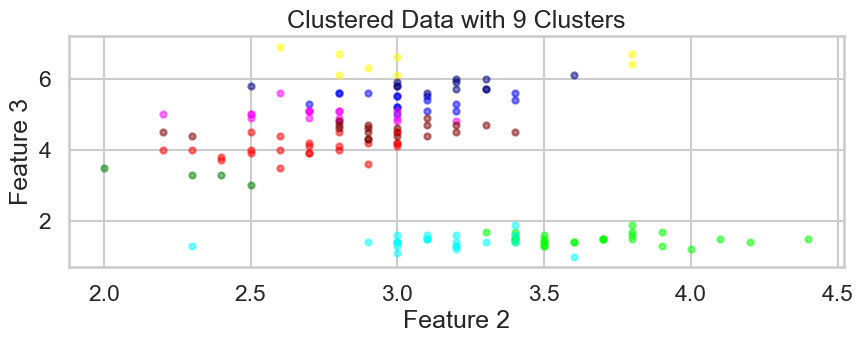

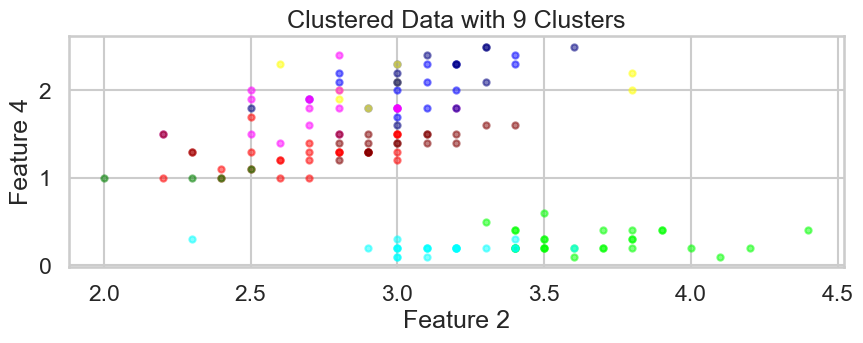

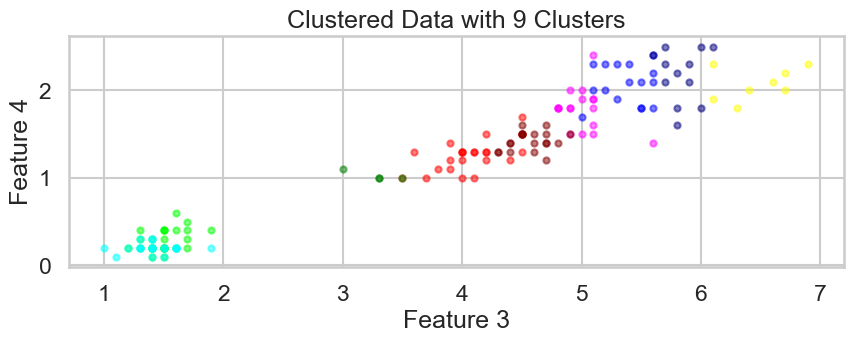

Cluster centers: [[5.62083333 2.69166667 4.075      1.2625    ]
 [5.24285714 3.66785714 1.5        0.28214286]
 [6.51875    3.04375    5.36875    2.06875   ]
 [7.625      3.0875     6.475      2.075     ]
 [4.70454545 3.12272727 1.41363636 0.2       ]
 [6.00588235 2.73529412 5.01176471 1.78823529]
 [6.41578947 2.93684211 4.56842105 1.42105263]
 [5.         2.3        3.275      1.025     ]
 [6.83333333 3.14166667 5.83333333 2.175     ]]
Cluster labels: [1 4 4 4 1 1 4 1 4 4 1 4 4 4 1 1 1 1 1 1 1 1 4 1 4 4 1 1 1 4 4 1 1 1 4 4 1
 1 4 1 1 4 4 1 1 4 1 4 1 4 6 6 6 0 6 0 6 7 6 0 7 0 0 6 0 6 0 0 6 0 5 0 5 6
 6 6 6 2 6 0 0 0 0 5 0 6 6 6 0 0 0 6 0 7 0 0 0 6 7 0 8 5 8 2 8 3 0 3 8 8 2
 2 2 5 5 2 2 3 3 5 8 5 3 5 8 8 5 5 2 8 3 3 2 5 5 3 2 2 5 2 8 2 5 8 8 2 5 2
 2 5]


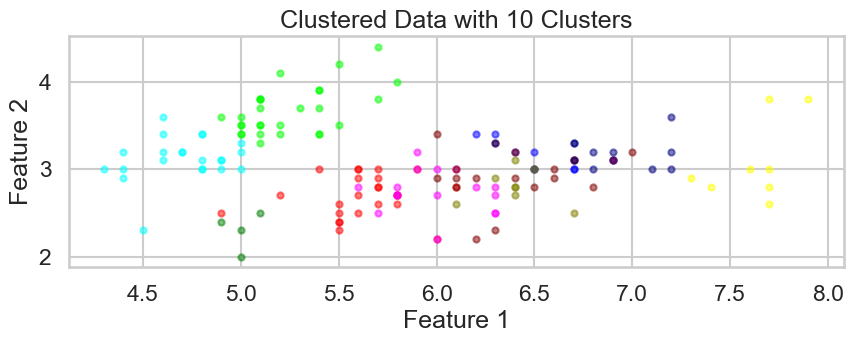

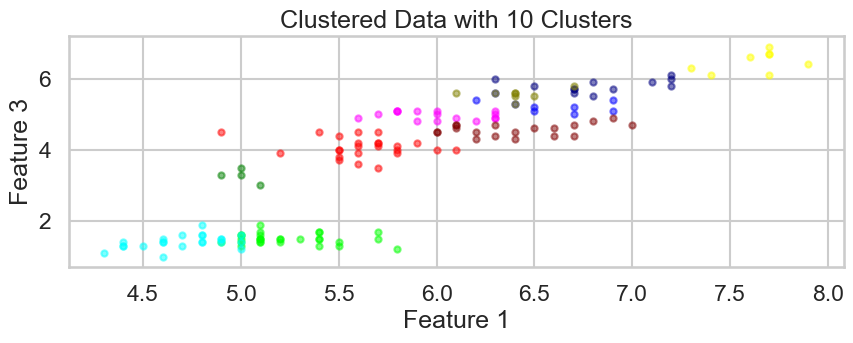

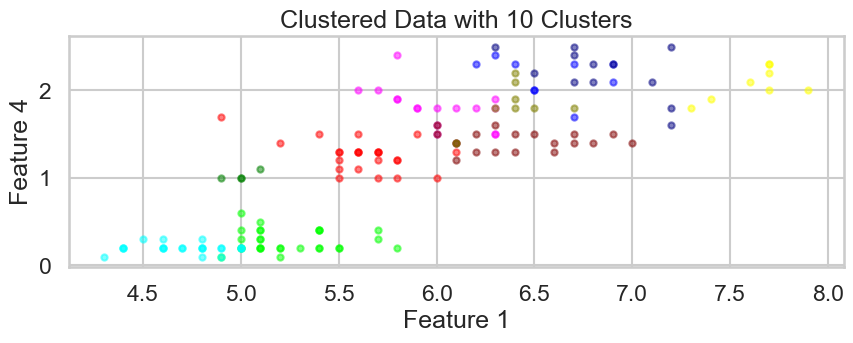

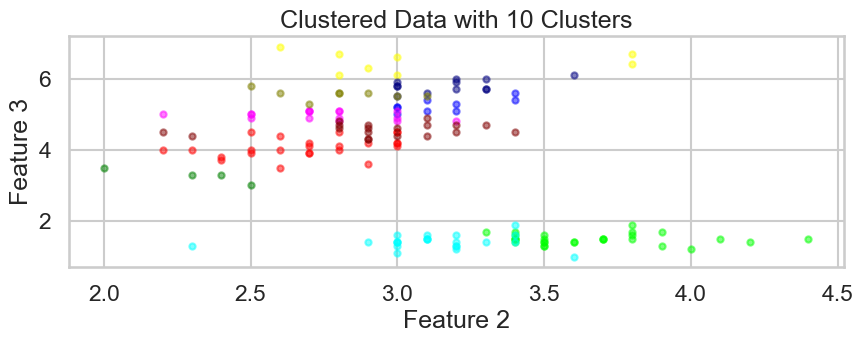

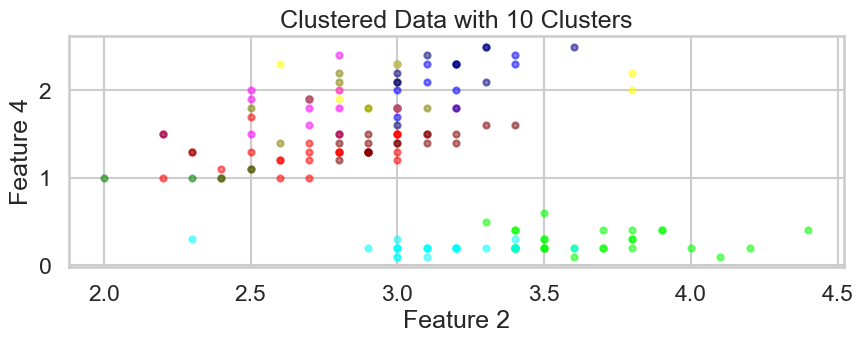

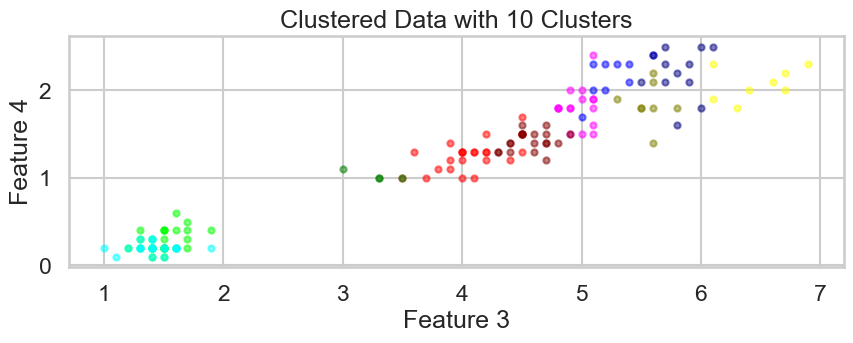

Cluster centers: [[5.62083333 2.69166667 4.075      1.2625    ]
 [5.24285714 3.66785714 1.5        0.28214286]
 [6.56666667 3.15555556 5.25555556 2.15555556]
 [7.625      3.0875     6.475      2.075     ]
 [4.70454545 3.12272727 1.41363636 0.2       ]
 [6.         2.74375    4.975      1.8125    ]
 [6.41578947 2.93684211 4.56842105 1.42105263]
 [5.         2.3        3.275      1.025     ]
 [6.84166667 3.18333333 5.80833333 2.2       ]
 [6.4        2.8        5.5625     1.85      ]]
Cluster labels: [1 4 4 4 1 1 4 1 4 4 1 4 4 4 1 1 1 1 1 1 1 1 4 1 4 4 1 1 1 4 4 1 1 1 4 4 1
 1 4 1 1 4 4 1 1 4 1 4 1 4 6 6 6 0 6 0 6 7 6 0 7 0 0 6 0 6 0 0 6 0 5 0 5 6
 6 6 6 2 6 0 0 0 0 5 0 6 6 6 0 0 0 6 0 7 0 0 0 6 7 0 8 5 8 9 8 3 0 3 9 8 2
 9 8 5 5 2 9 3 3 5 8 5 3 5 8 8 5 5 9 8 3 3 9 5 9 3 2 9 5 2 8 2 5 8 8 2 5 2
 2 5]


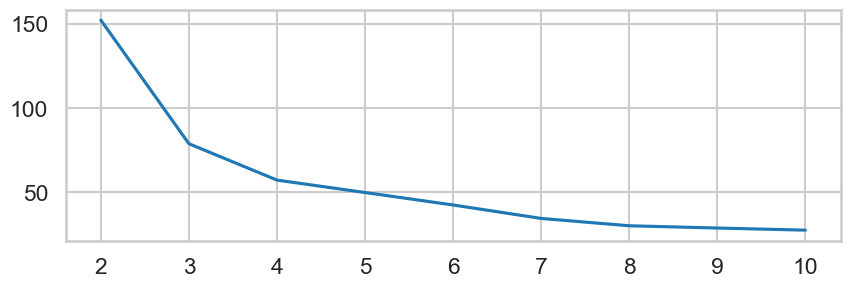

[2]


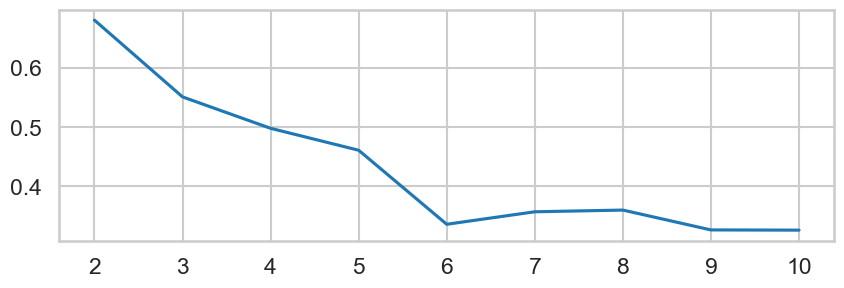

In [82]:
#####kmeans
X=np.array(iris_data.data)
clusters_num=np.arange(2,11)
SSE_draw=np.zeros(9,dtype=float)
Silhouette=np.zeros(9,dtype=float)
for n_clusters in range(2,11):
    kmeans = KMeans(n_clusters, random_state=0)

    # Fit the model to the data
    kmeans.fit(X)

    # Get the cluster centers
    centroids = kmeans.cluster_centers_

    # Get the cluster assignments for each data point
    labels = kmeans.labels_
    display_cluster(X,kmeans,n_clusters)
    SSE=distortion(X,centroids,labels)
    SSE_draw[n_clusters-2]=SSE
    Silhouette[n_clusters-2]=silhouette_score(X,labels)
    print("Cluster centers:", centroids)
    print("Cluster labels:", labels)

plt.figure();
plt.plot(clusters_num,SSE_draw);
plt.show();
plt.figure();
plt.plot(clusters_num,Silhouette);
kmeans_sil_rank= 2+np.where(Silhouette == max(Silhouette))[0]
print(kmeans_sil_rank)
plt.show();

Affinity: euclidean, Linkage: average, Distance Threshold: 3
Silhouette Score: 0.6867350732769777
2


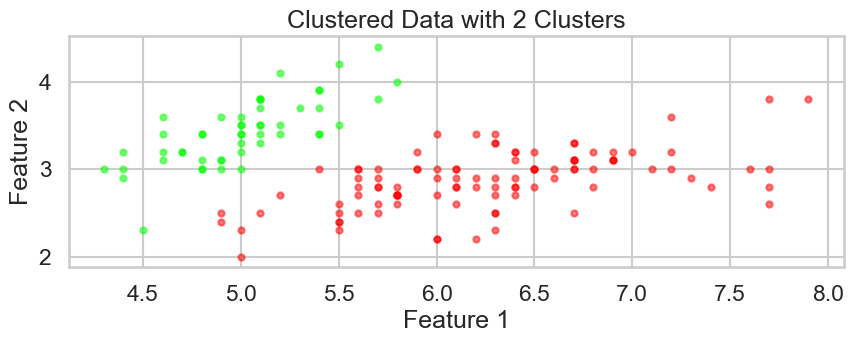

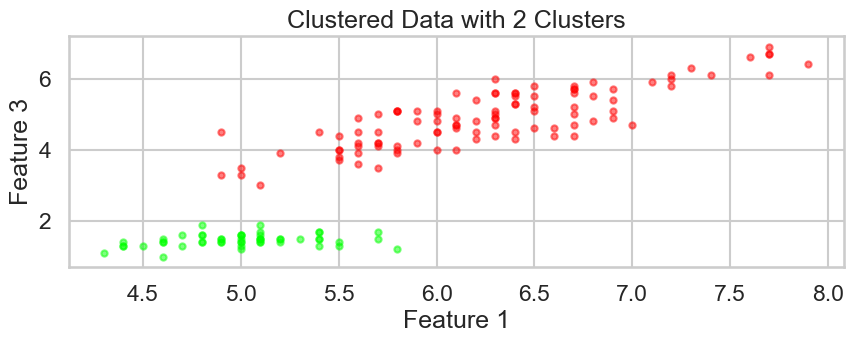

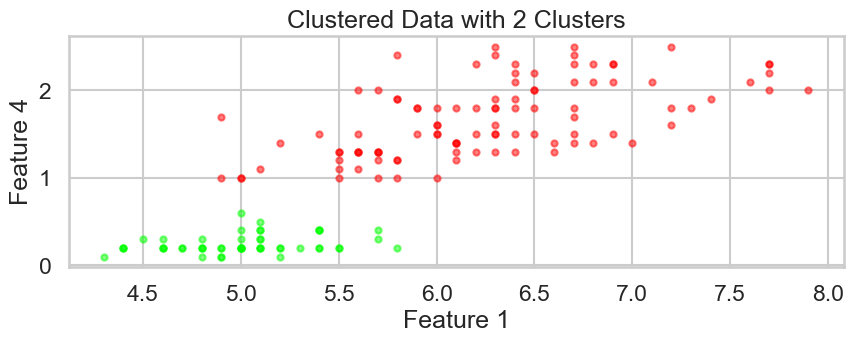

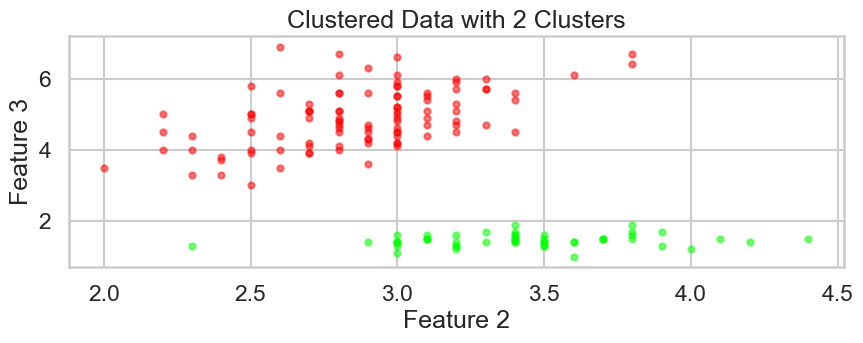

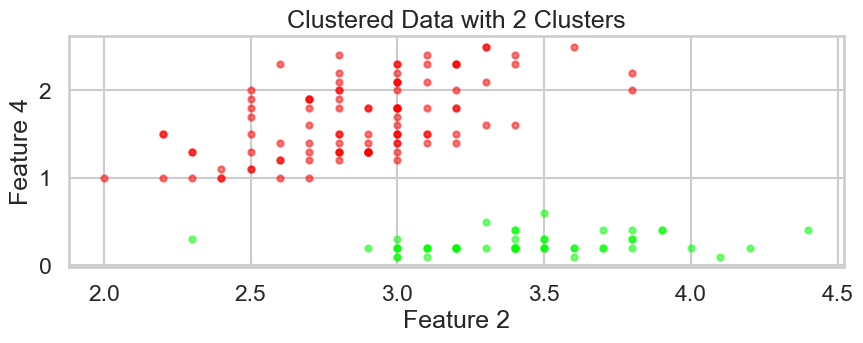

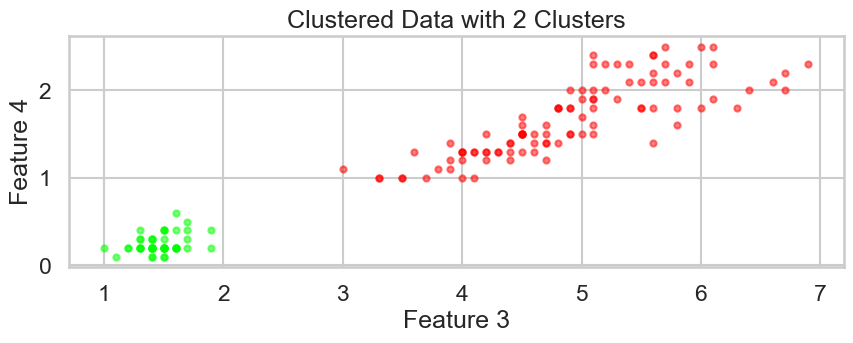

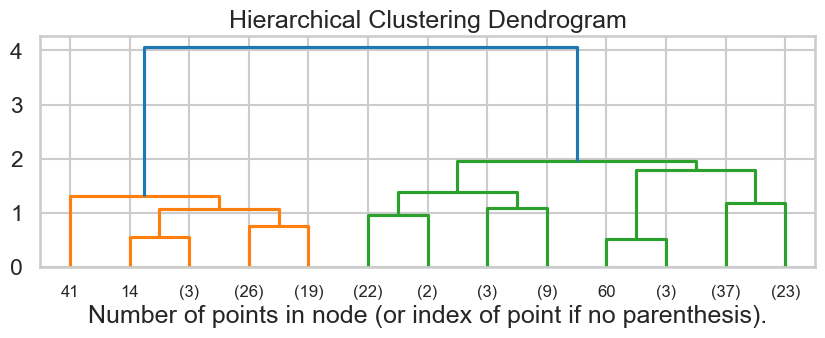

Affinity: euclidean, Linkage: average, Distance Threshold: 4
Silhouette Score: 0.6867350732769777
2


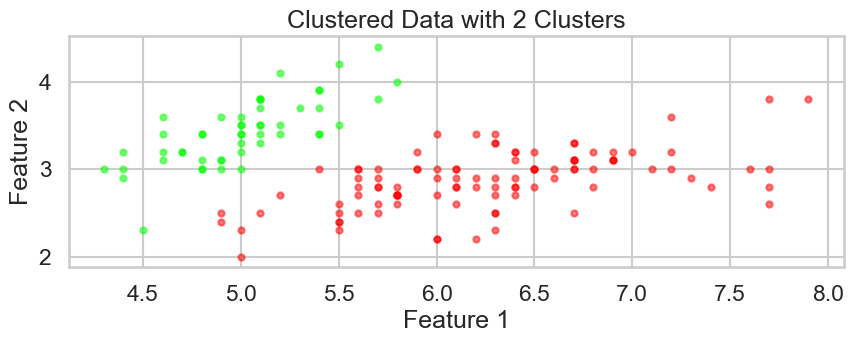

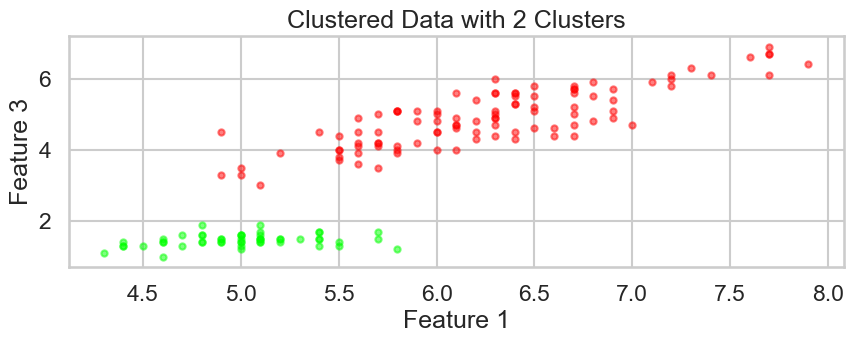

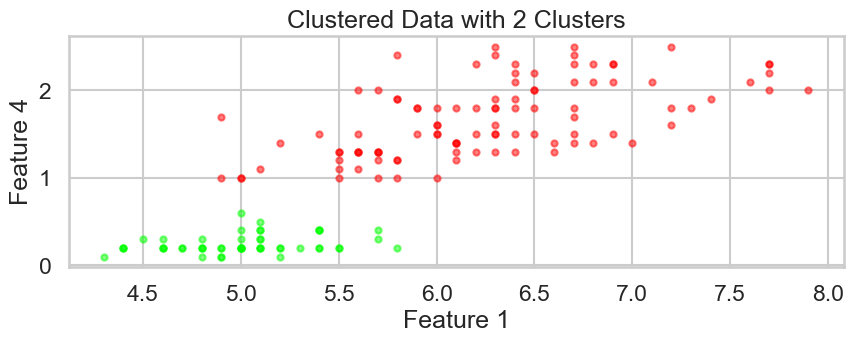

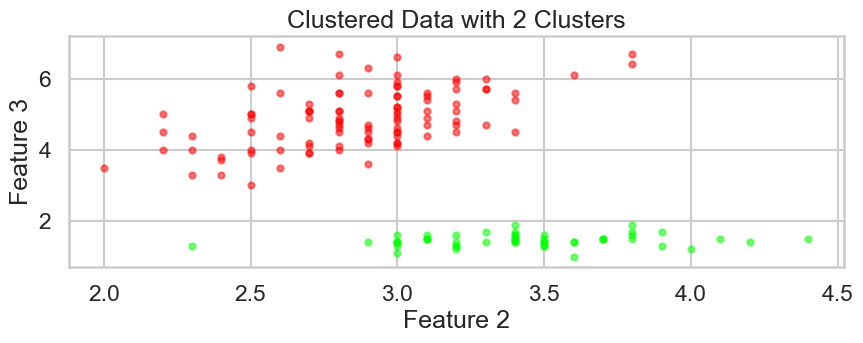

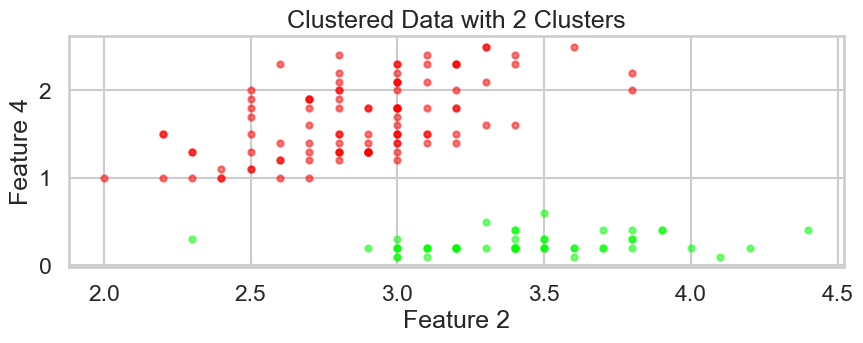

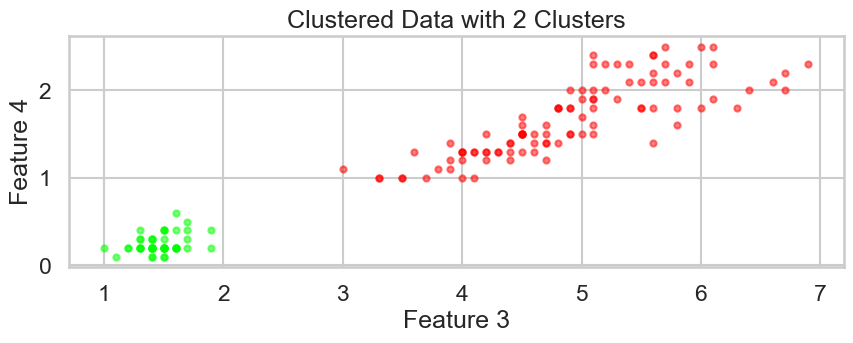

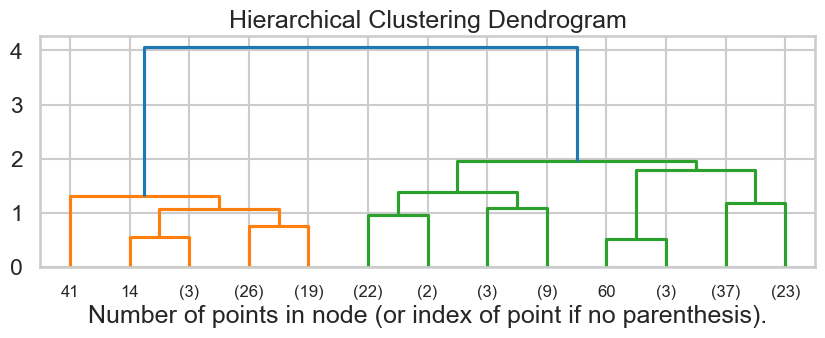

Affinity: euclidean, Linkage: average, Distance Threshold: 5
Silhouette Score: 0.6867350732769777
2


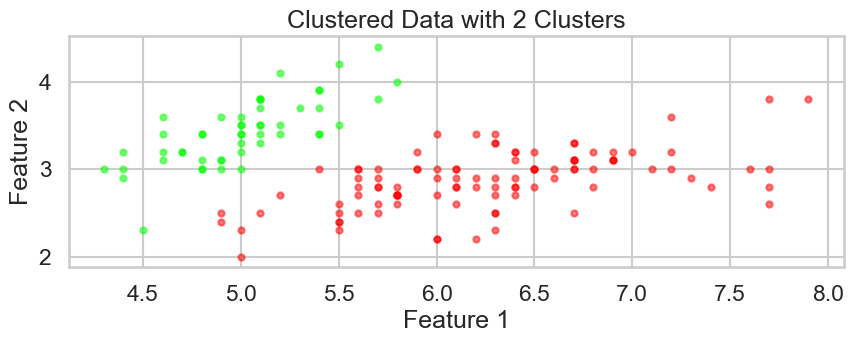

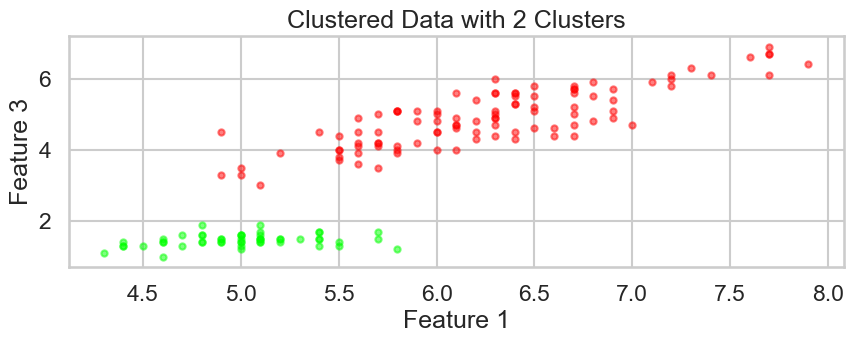

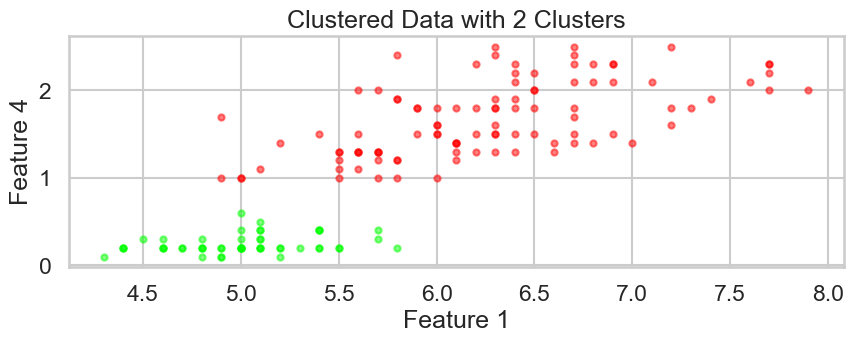

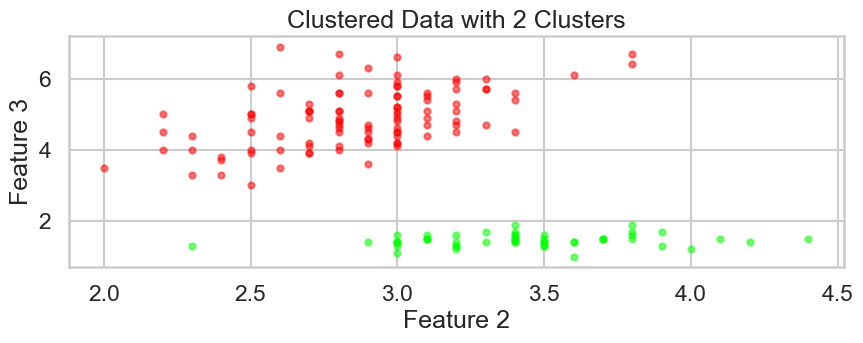

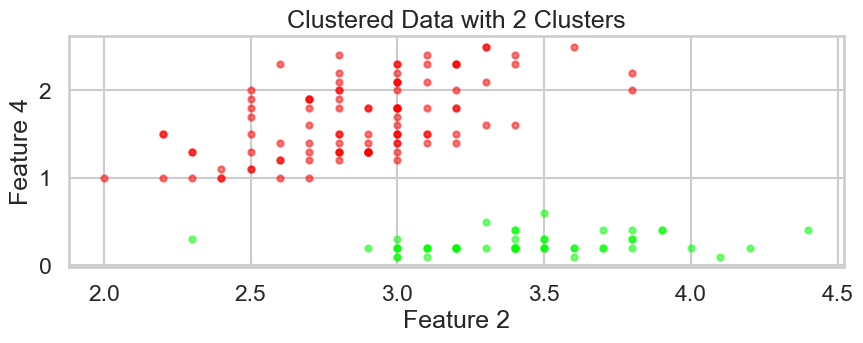

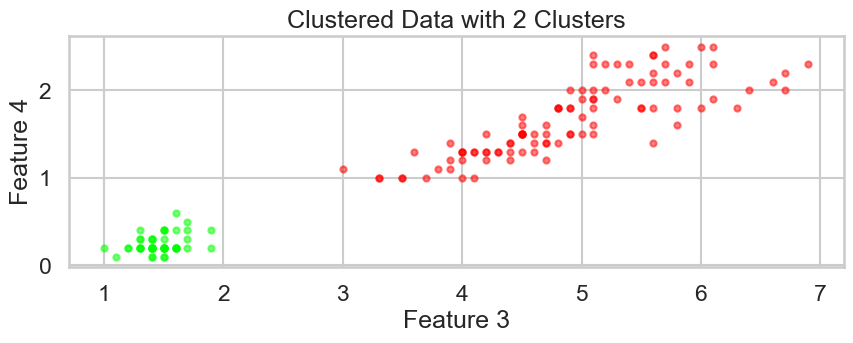

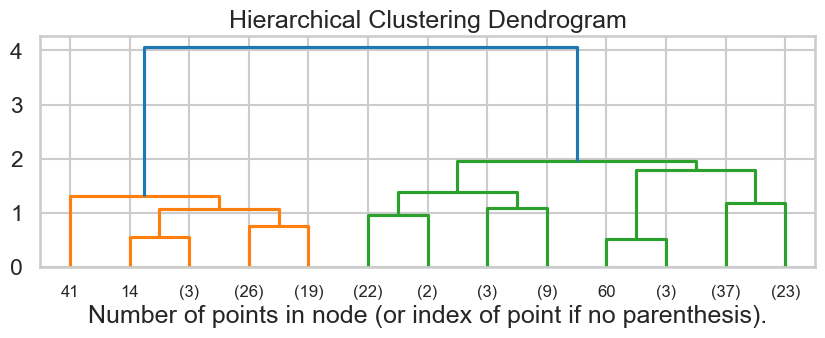

Affinity: euclidean, Linkage: single, Distance Threshold: 3
Silhouette Score: 0.6867350732769777
2


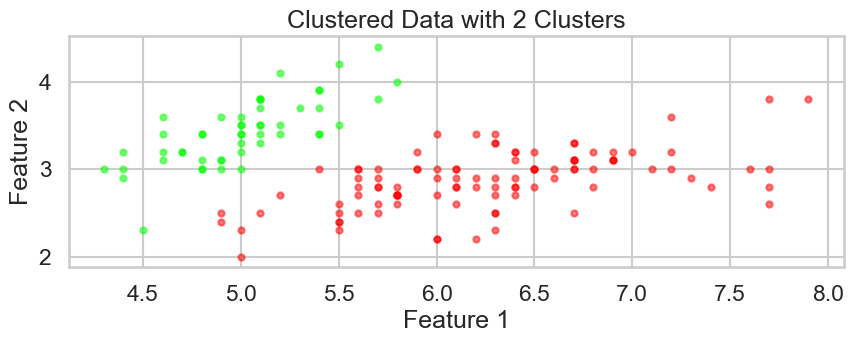

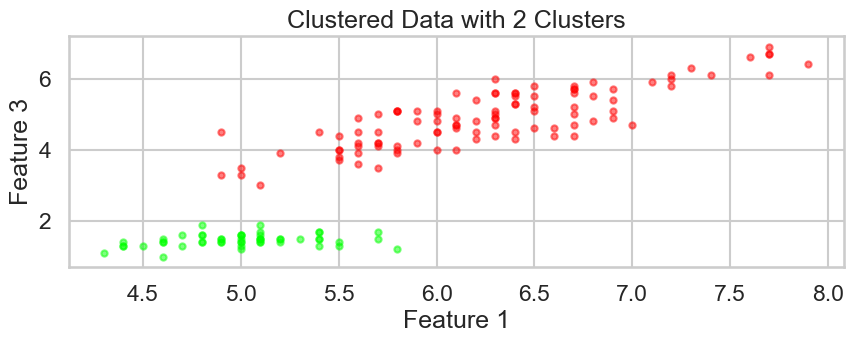

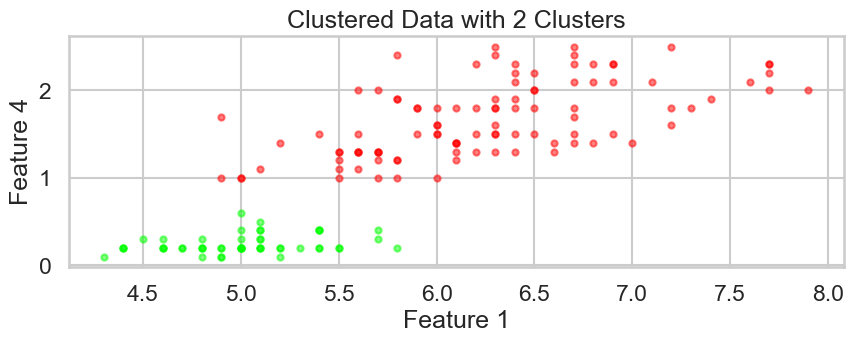

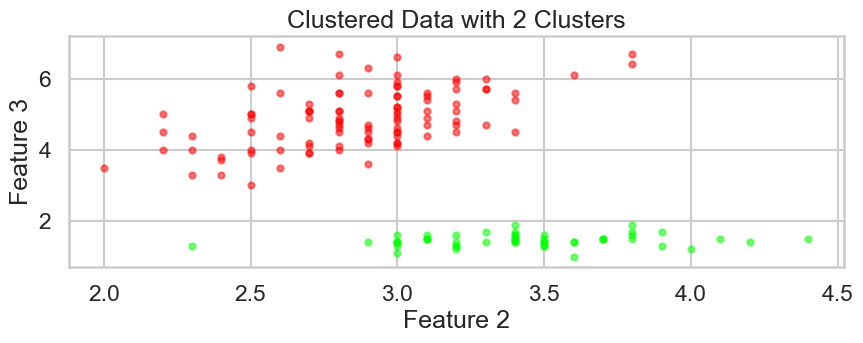

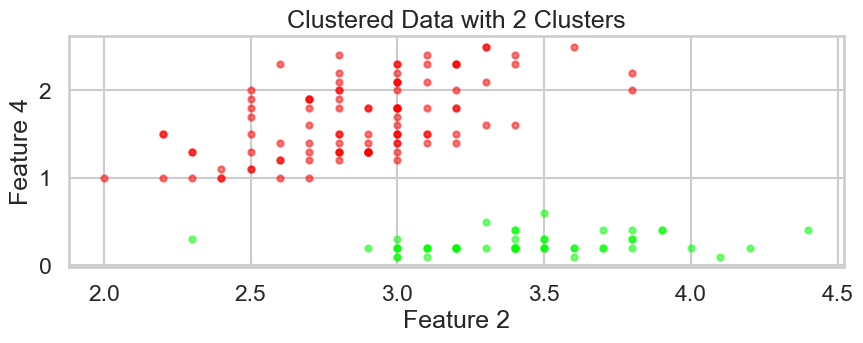

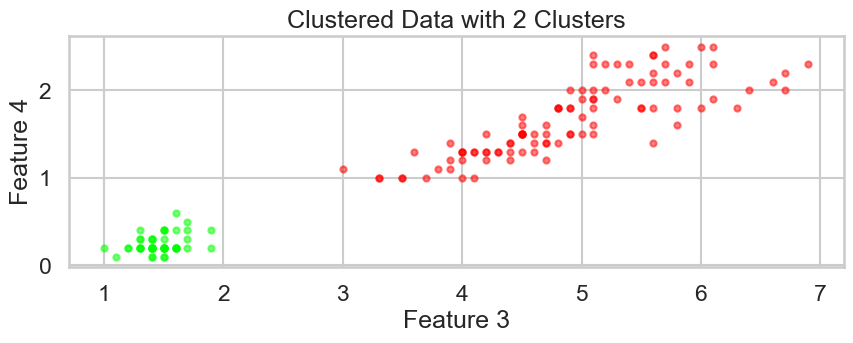

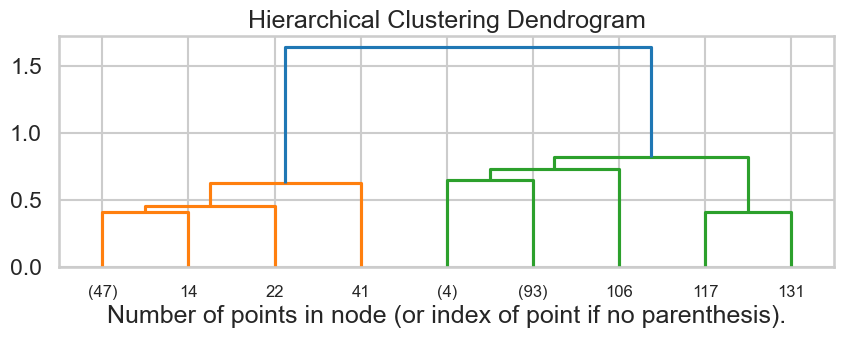

Affinity: euclidean, Linkage: single, Distance Threshold: 4
Silhouette Score: 0.6867350732769777
2


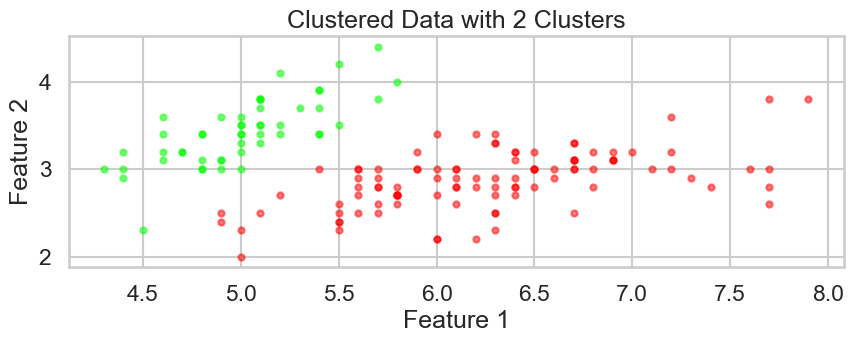

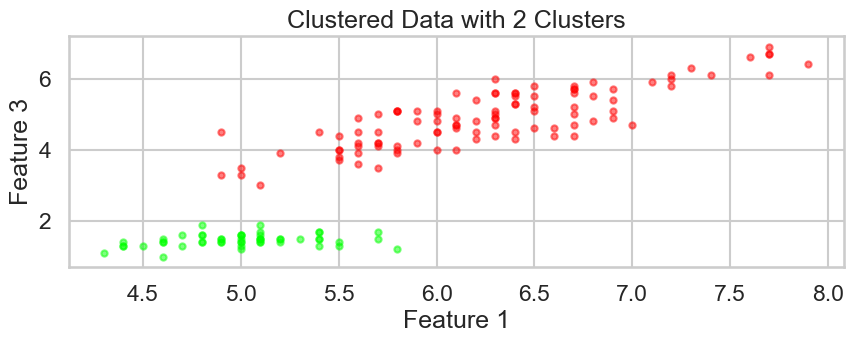

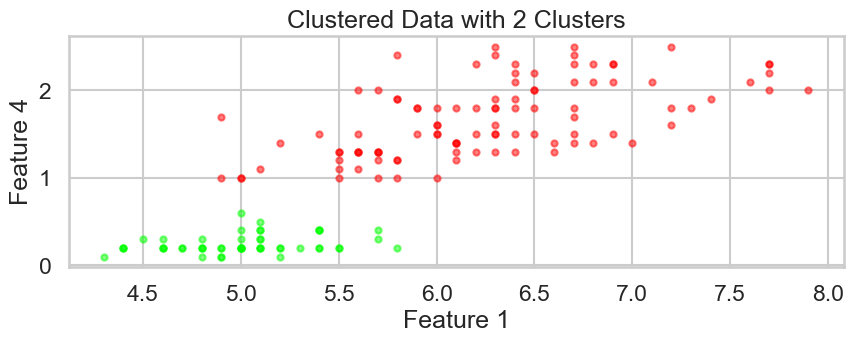

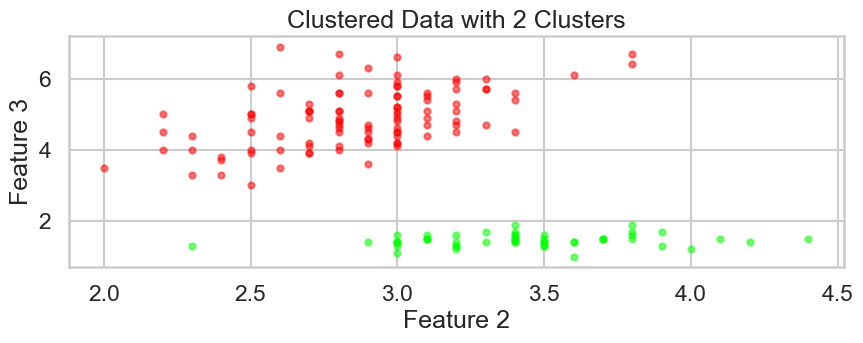

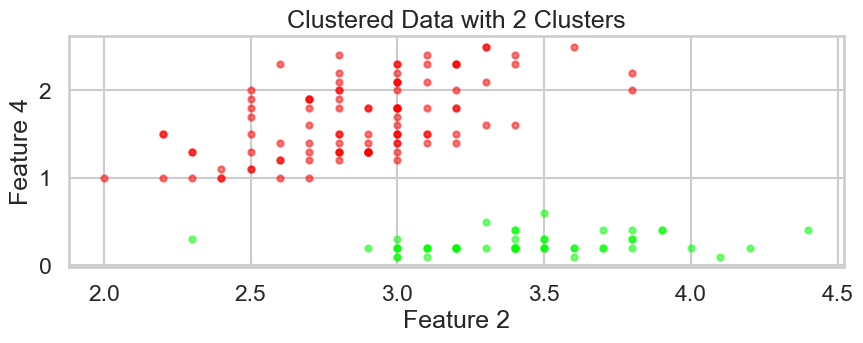

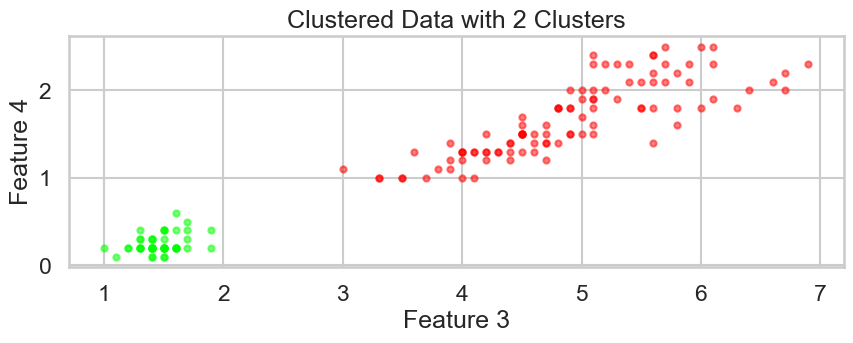

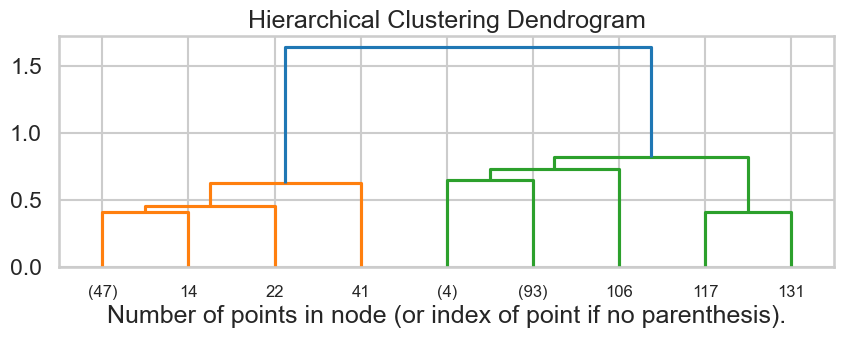

Affinity: euclidean, Linkage: single, Distance Threshold: 5
Silhouette Score: 0.6867350732769777
2


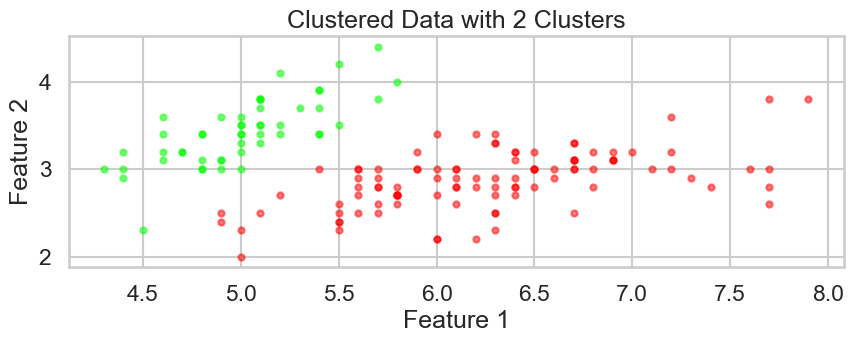

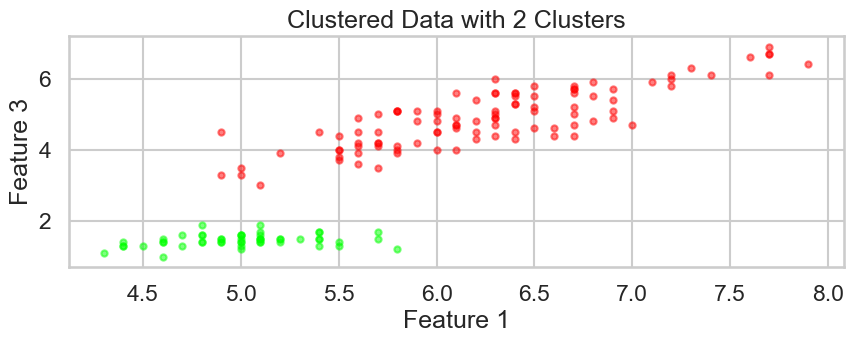

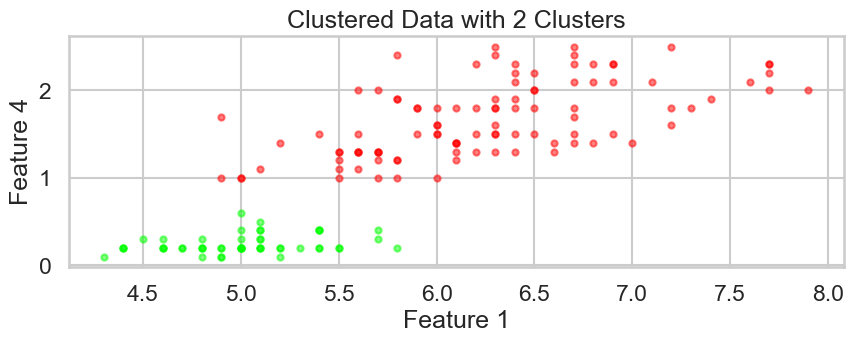

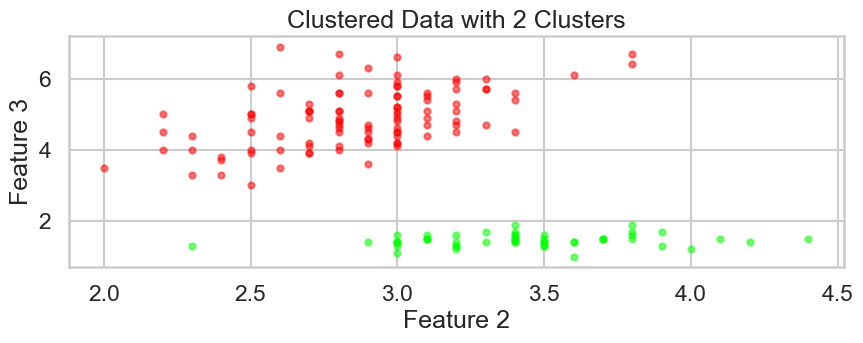

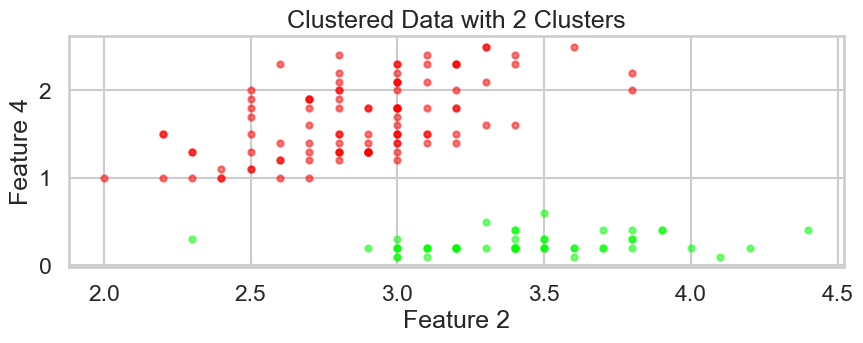

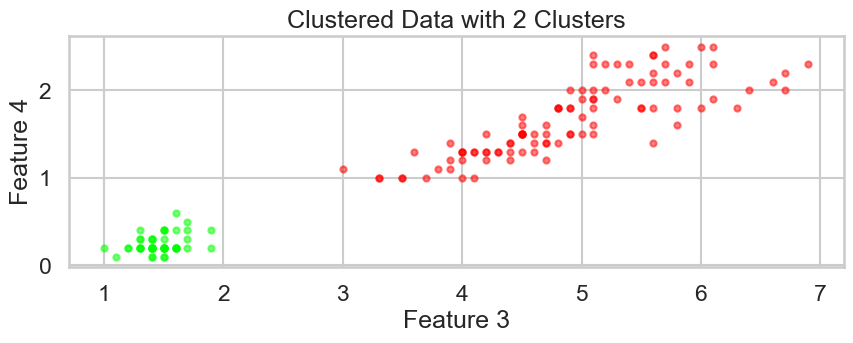

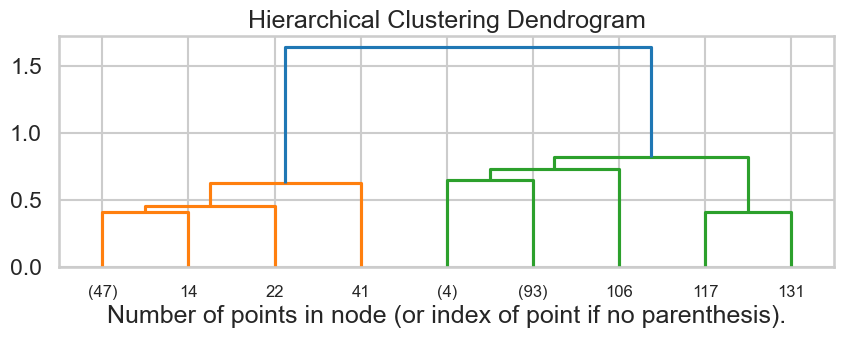

Affinity: manhattan, Linkage: average, Distance Threshold: 3
Silhouette Score: 0.47195185980984994
4


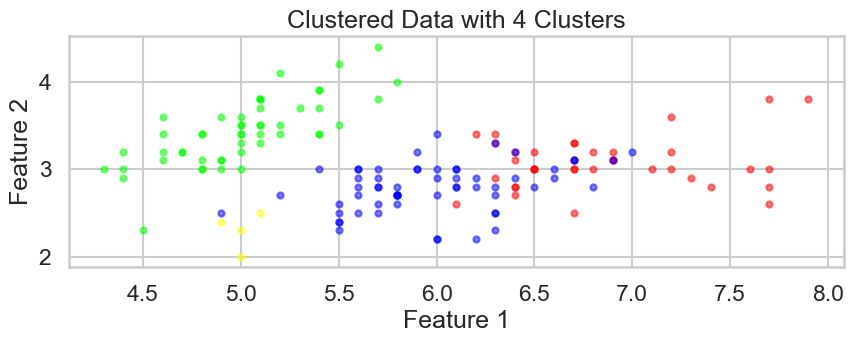

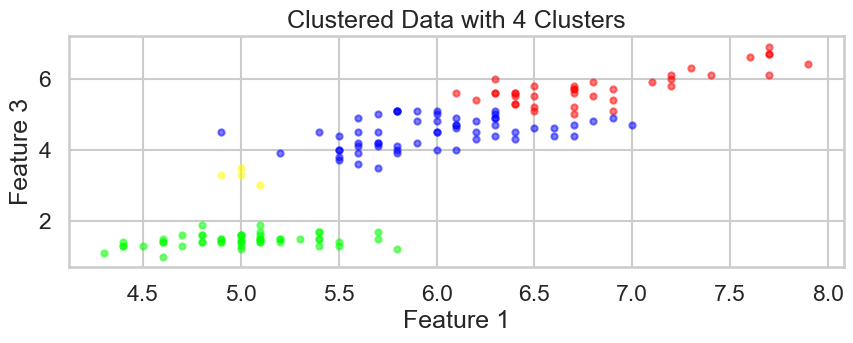

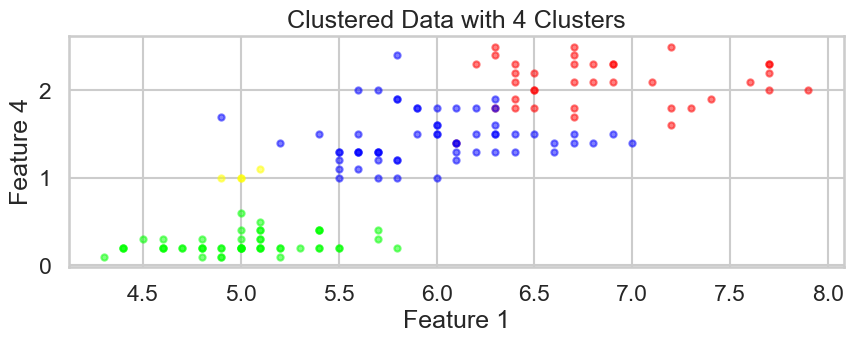

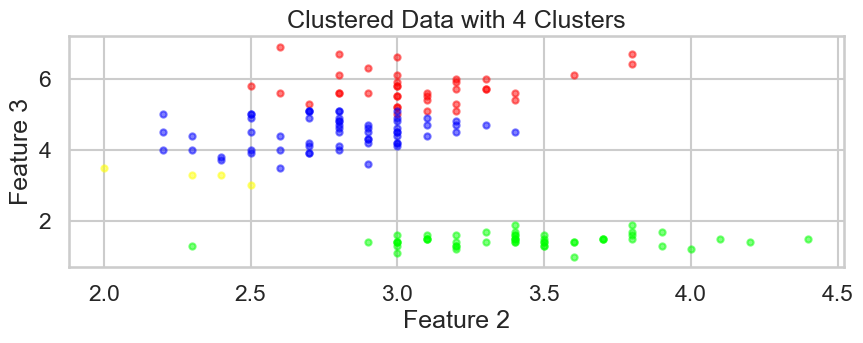

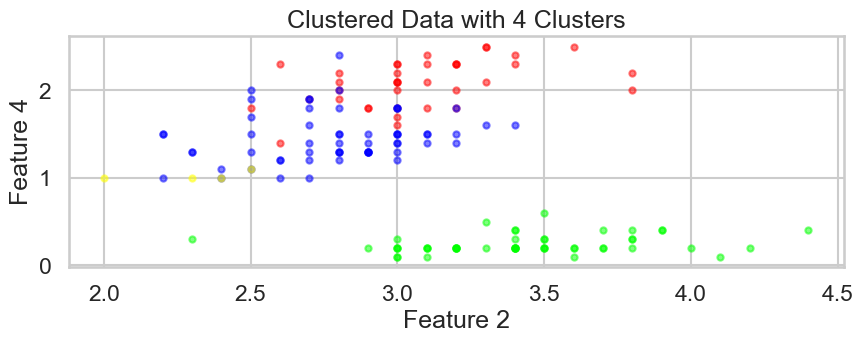

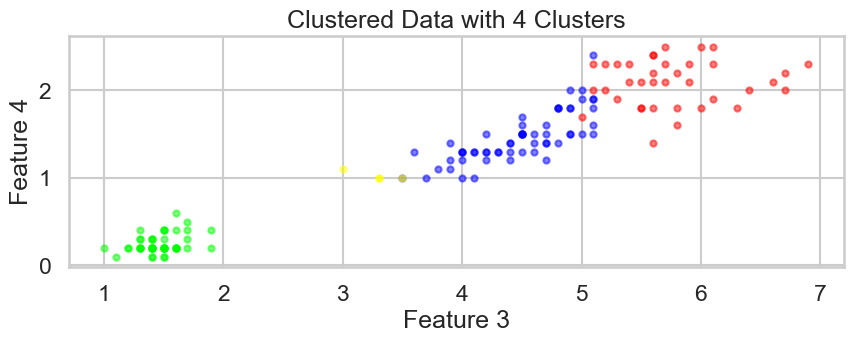

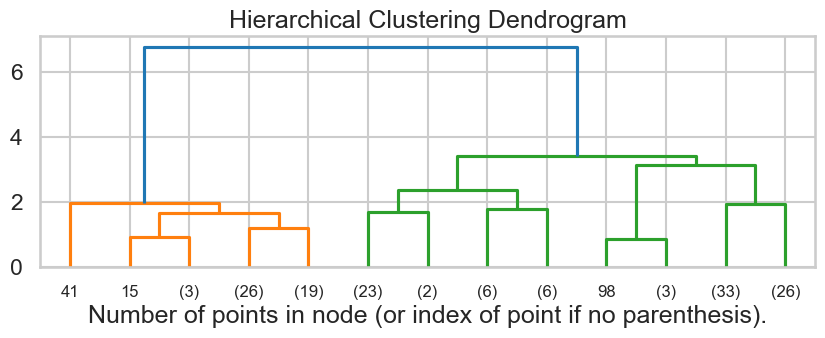

Affinity: manhattan, Linkage: average, Distance Threshold: 4
Silhouette Score: 0.6867350732769777
2


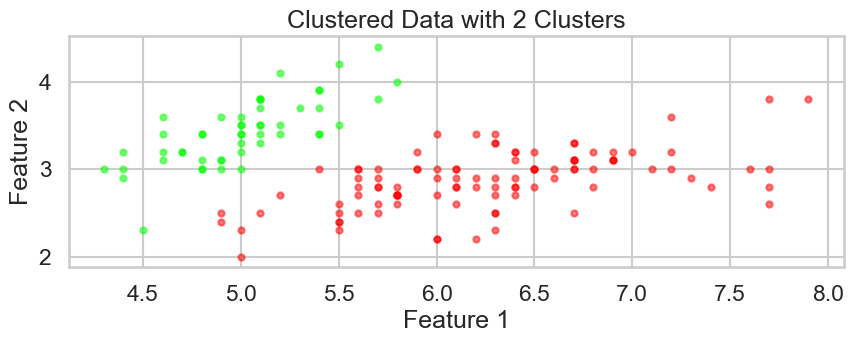

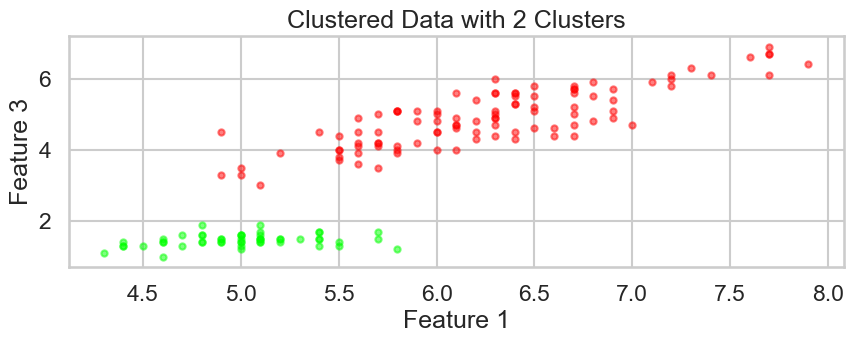

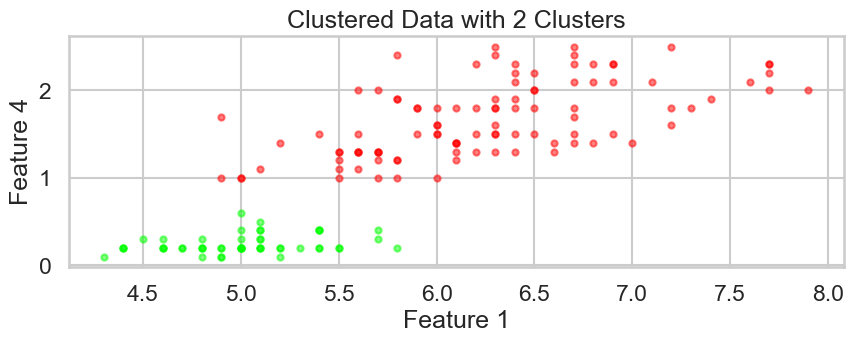

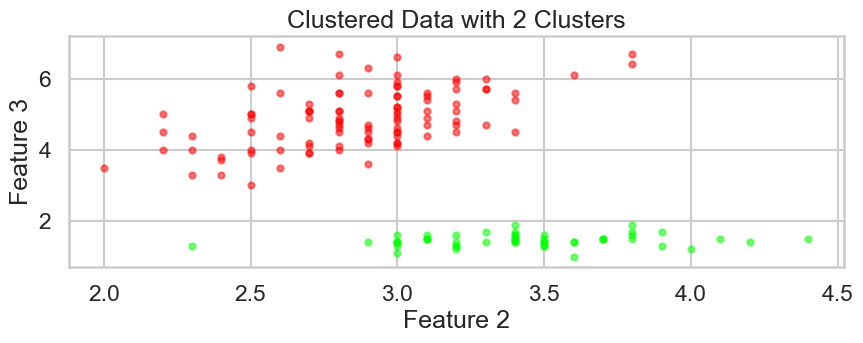

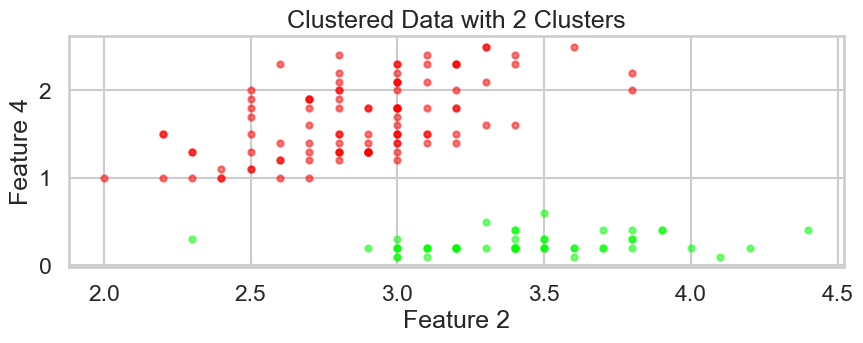

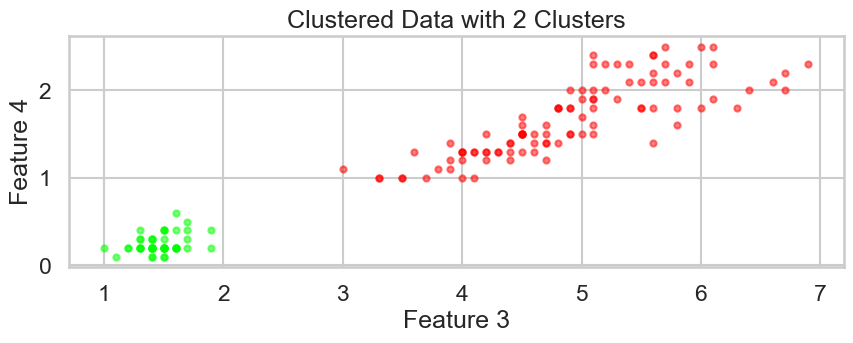

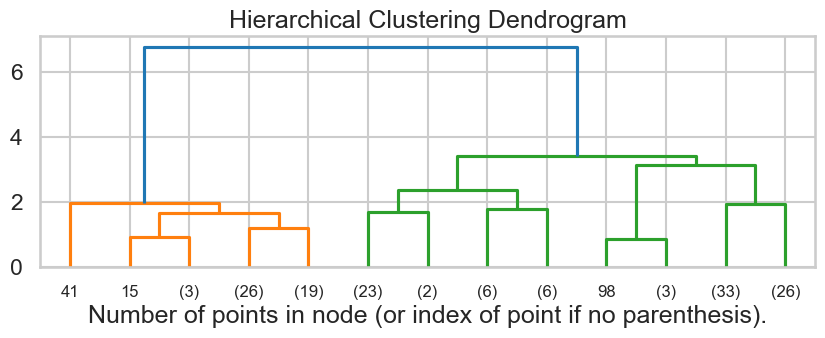

Affinity: manhattan, Linkage: average, Distance Threshold: 5
Silhouette Score: 0.6867350732769777
2


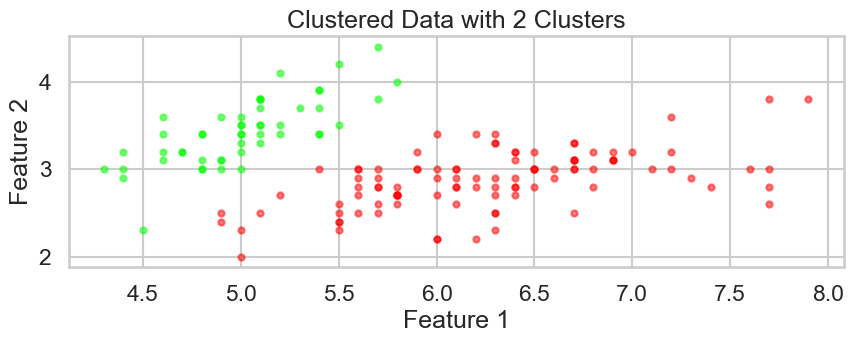

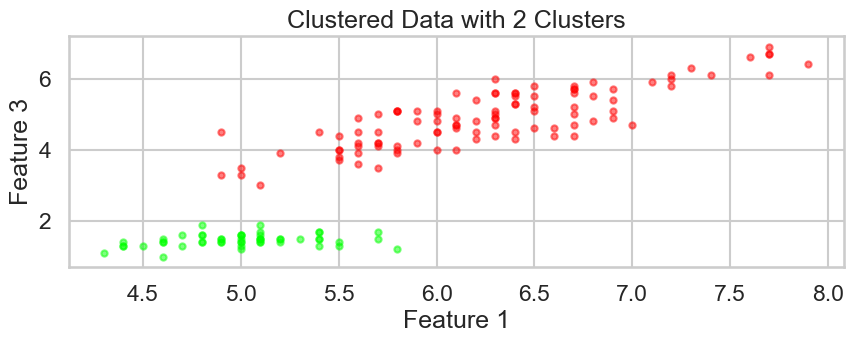

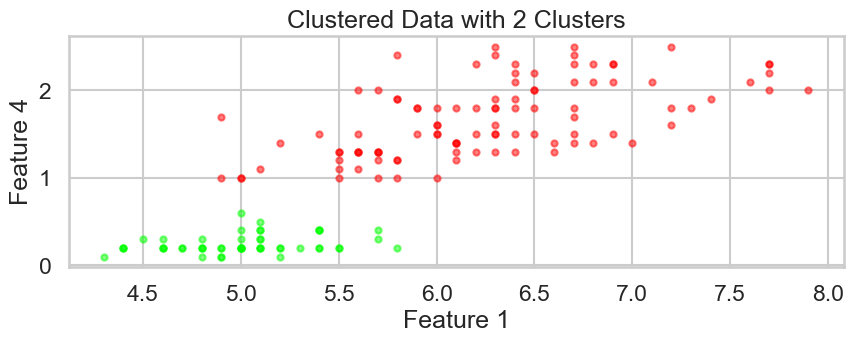

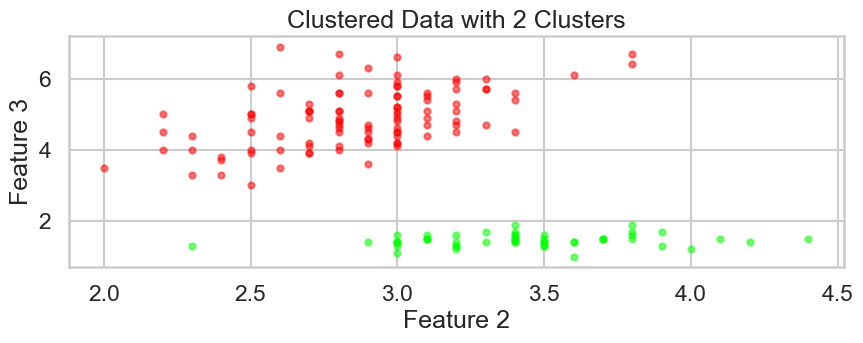

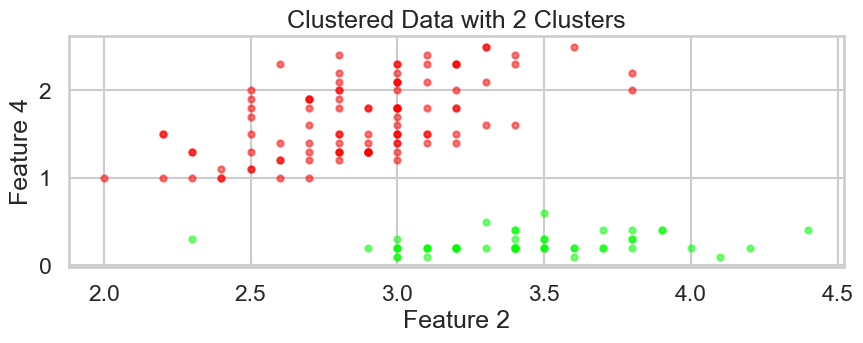

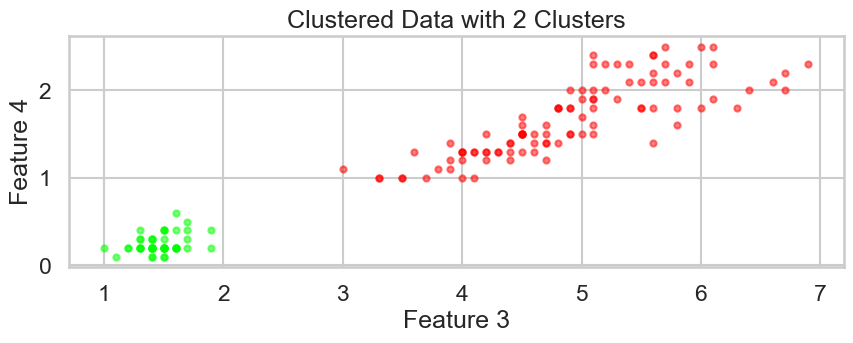

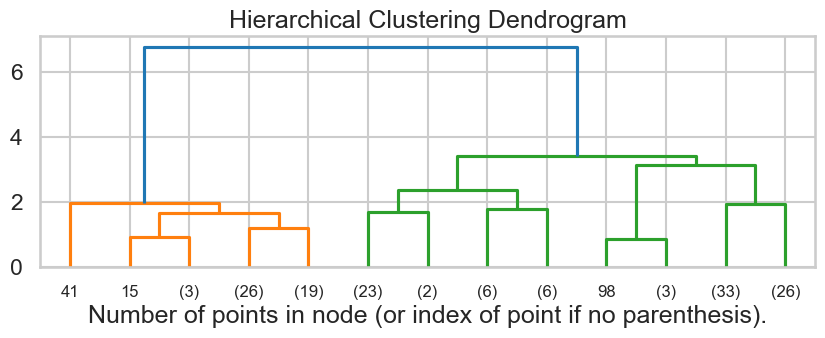

Affinity: manhattan, Linkage: single, Distance Threshold: 3
Silhouette Score: 0.6867350732769777
2


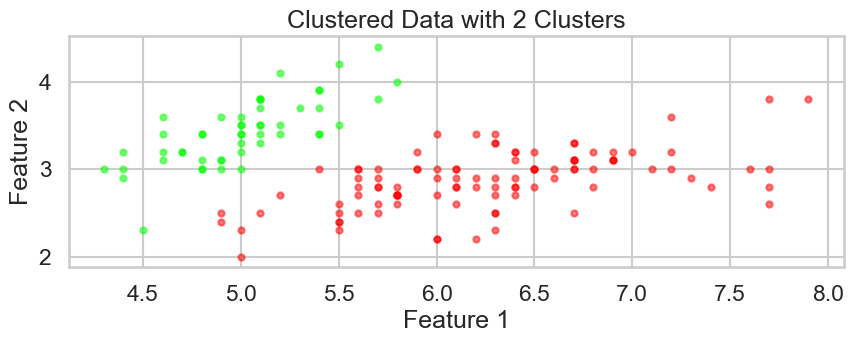

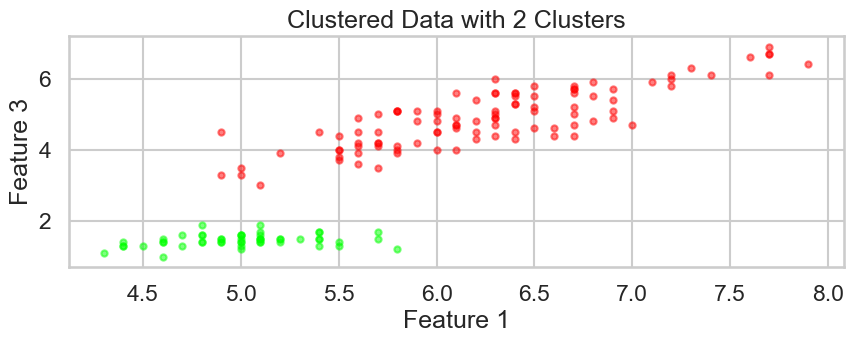

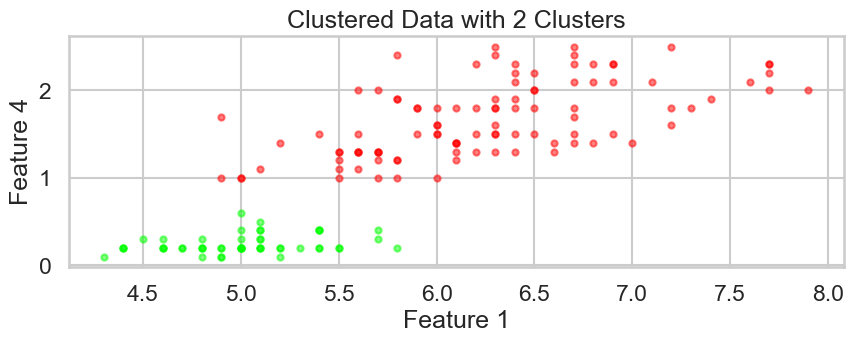

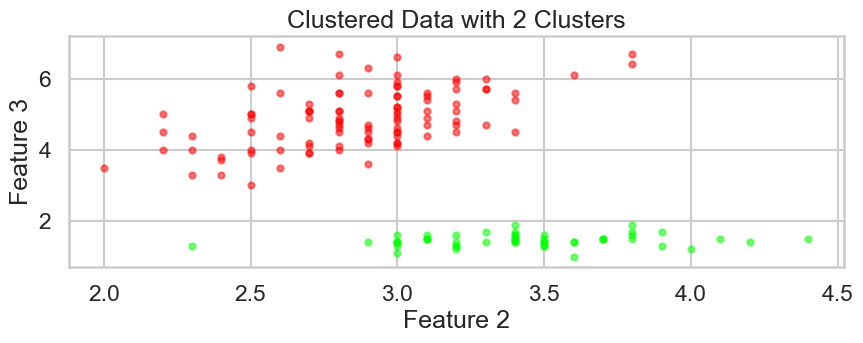

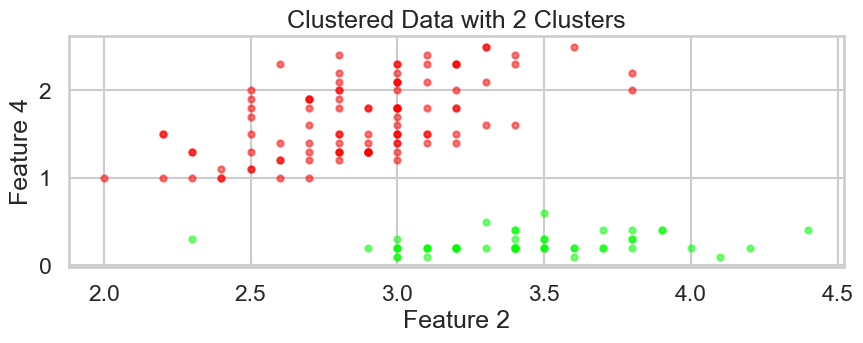

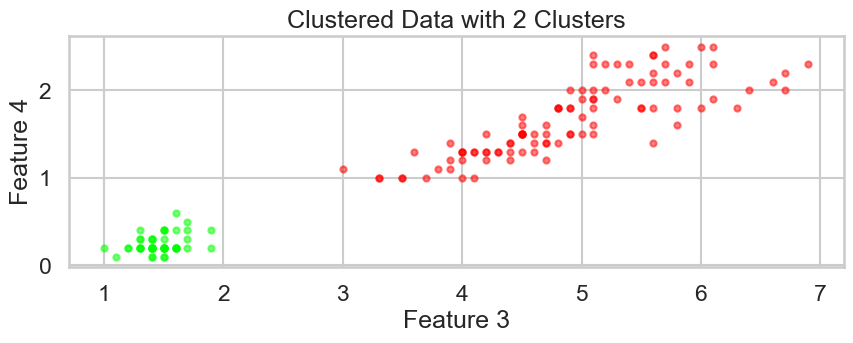

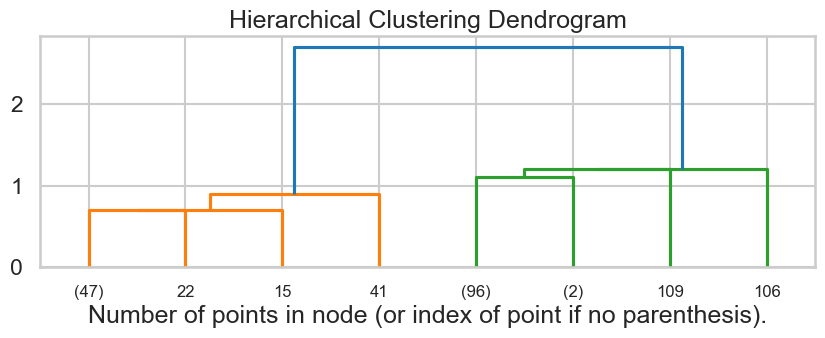

Affinity: manhattan, Linkage: single, Distance Threshold: 4
Silhouette Score: 0.6867350732769777
2


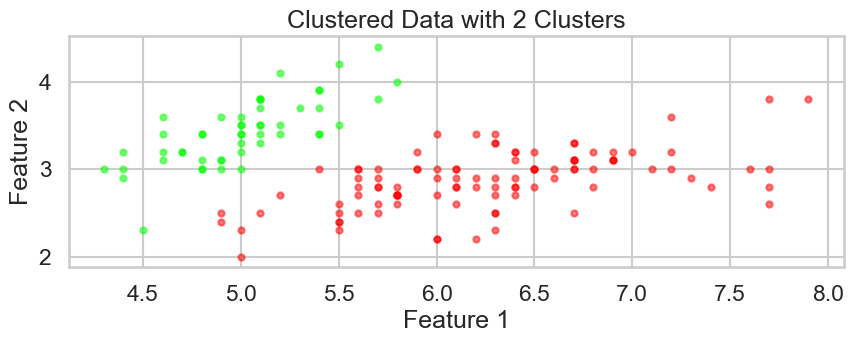

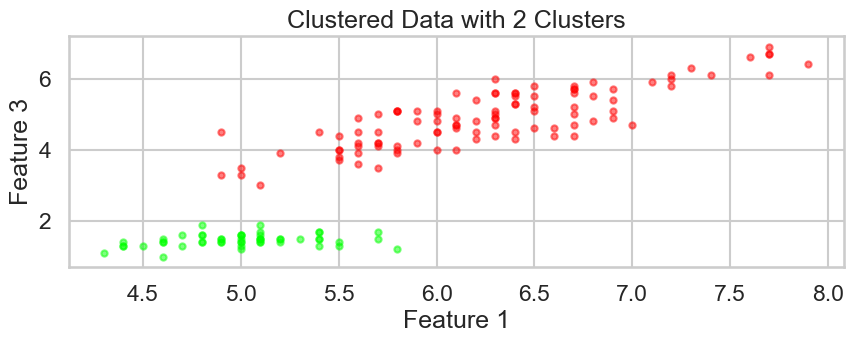

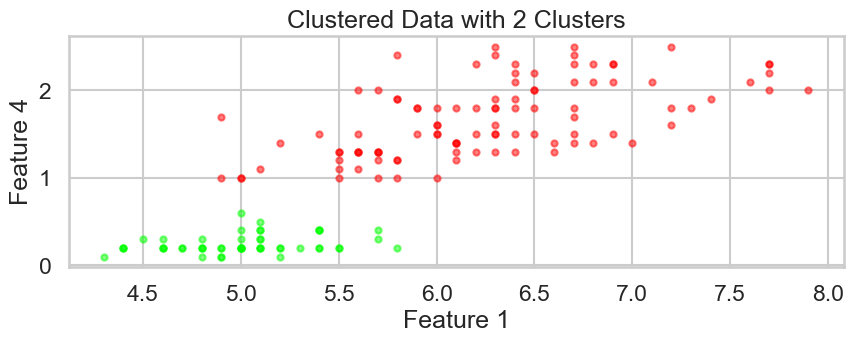

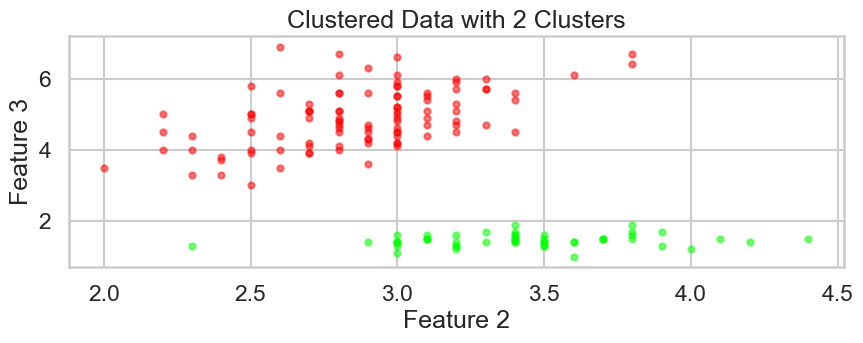

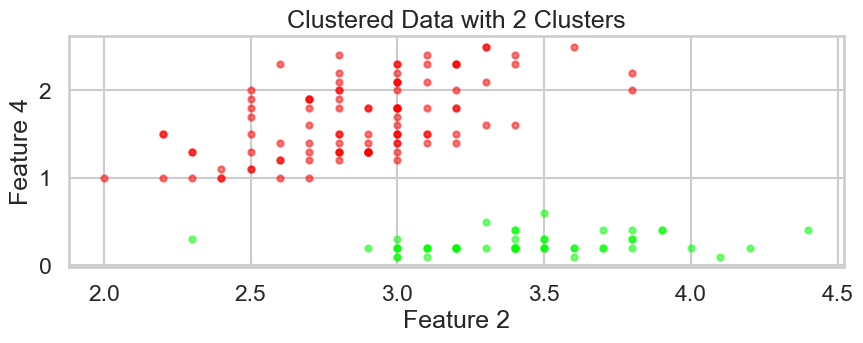

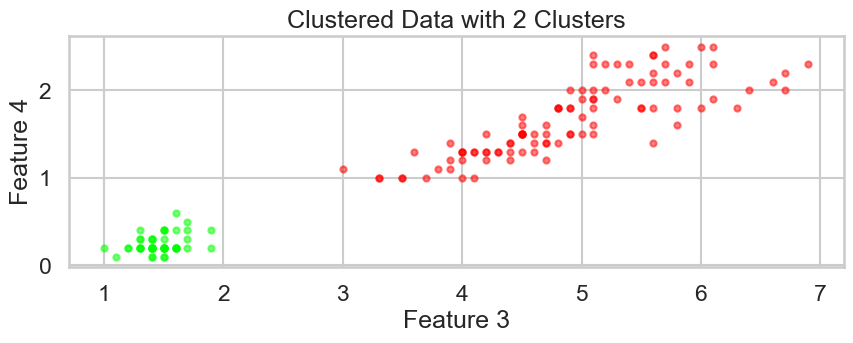

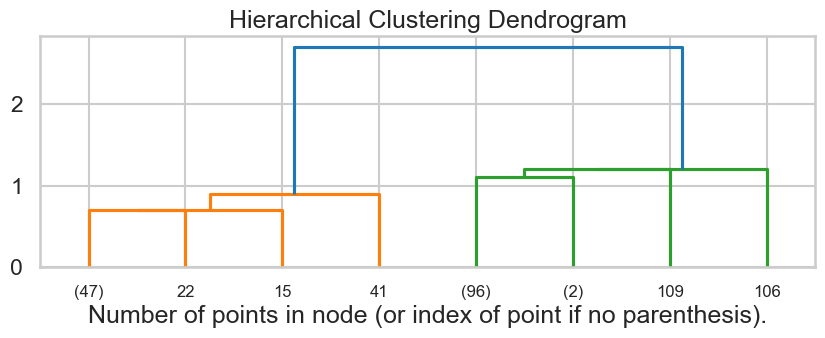

Affinity: manhattan, Linkage: single, Distance Threshold: 5
Silhouette Score: 0.6867350732769777
2


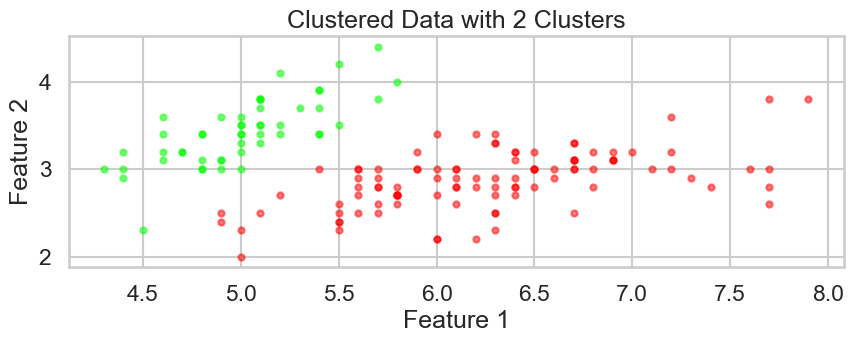

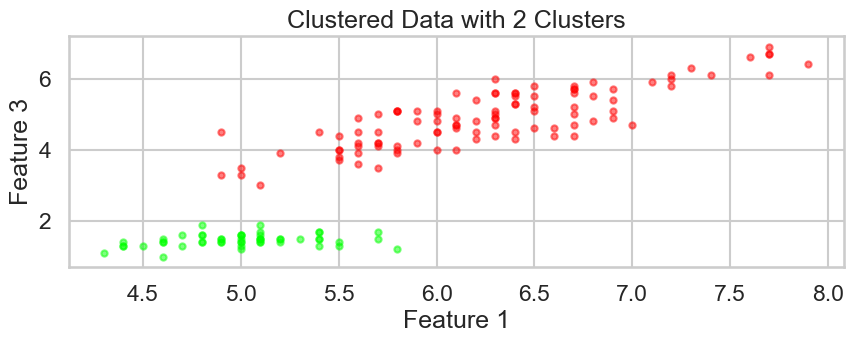

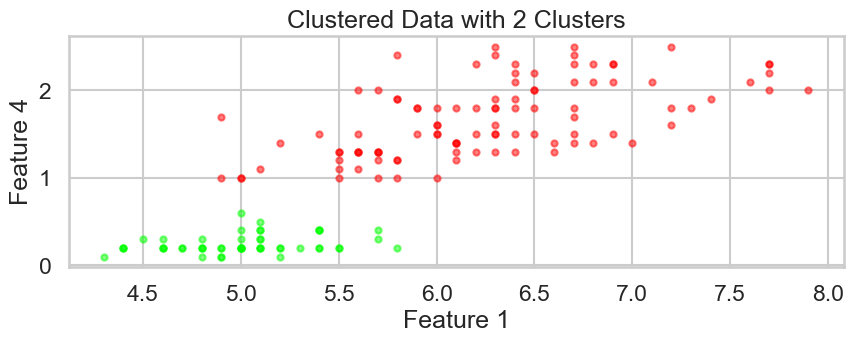

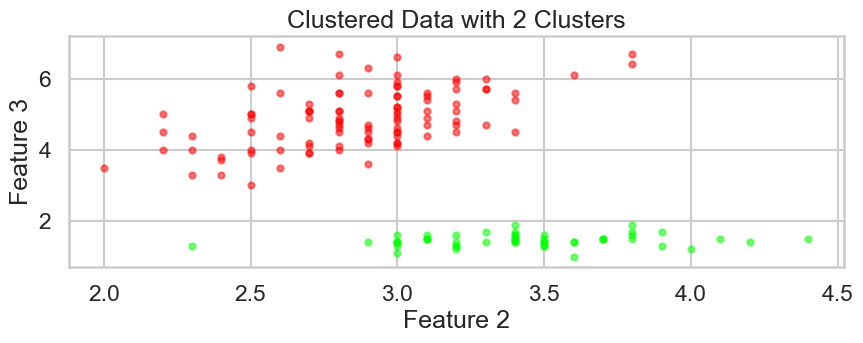

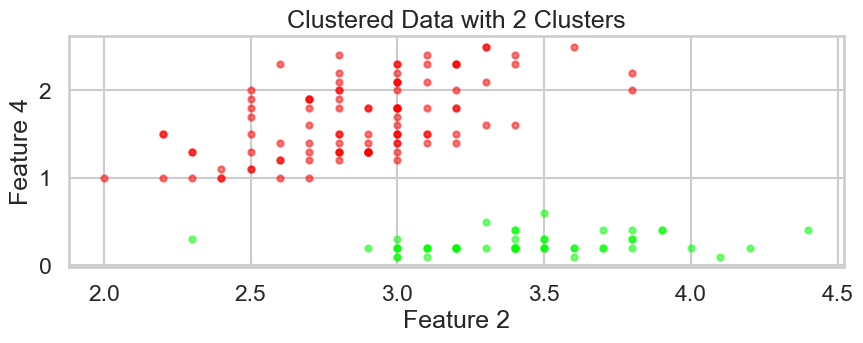

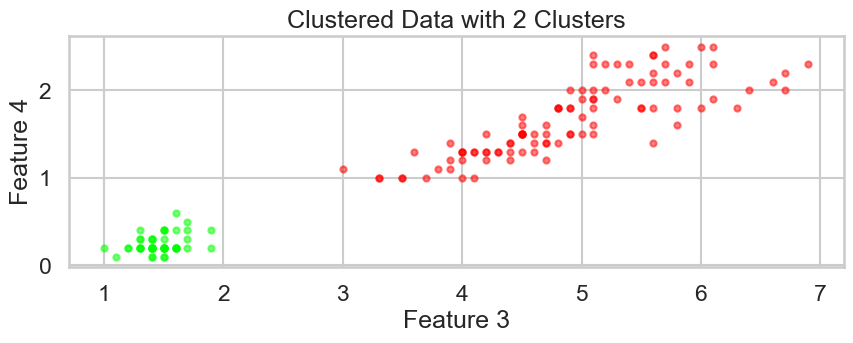

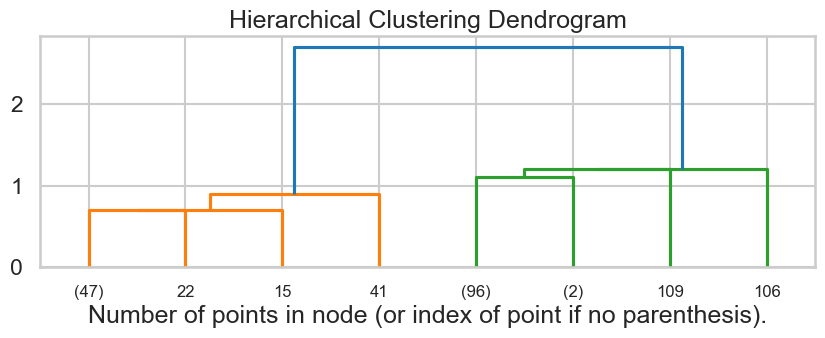

Affinity: cosine, Linkage: average, Distance Threshold: 3
Silhouette Score: 0.6867350732769777
2


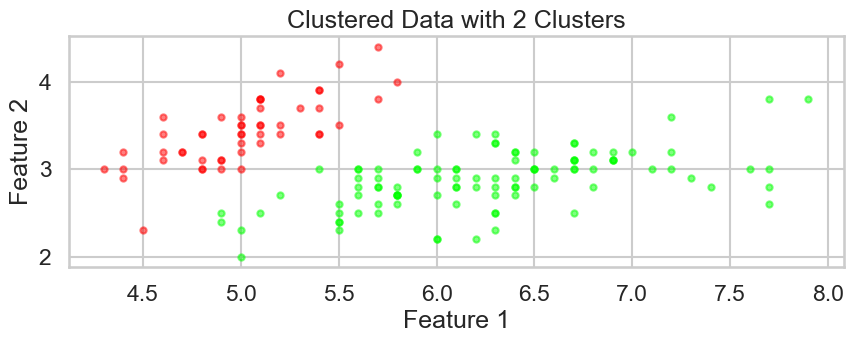

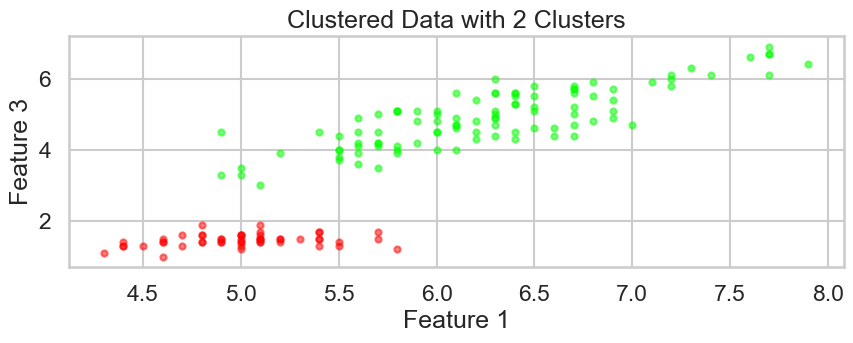

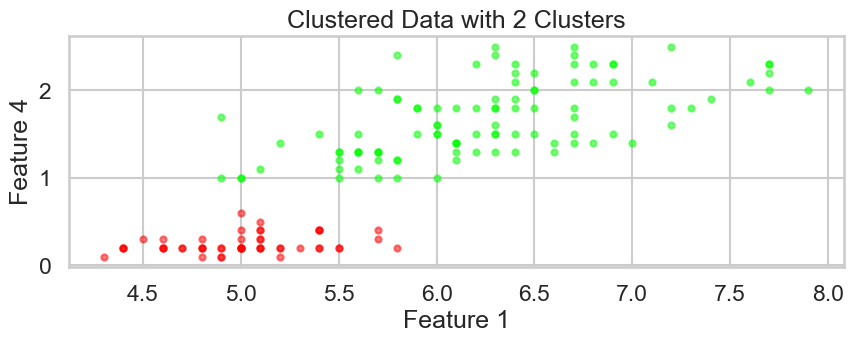

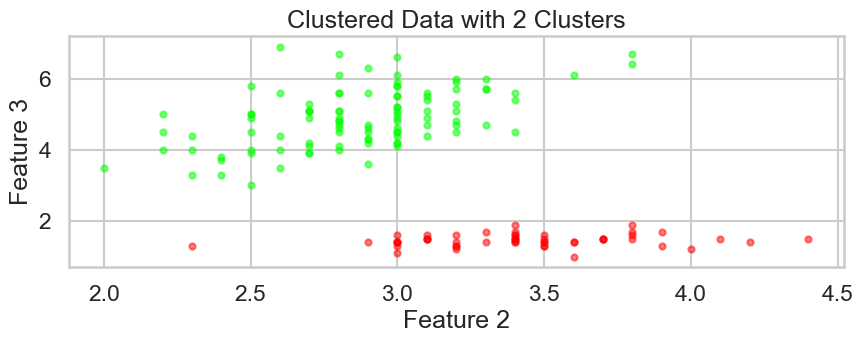

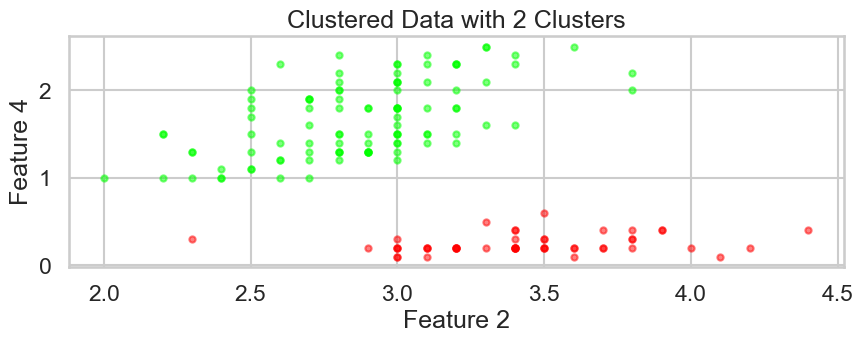

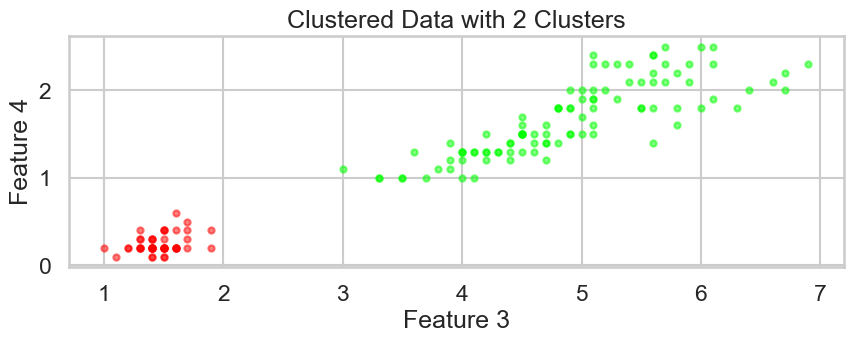

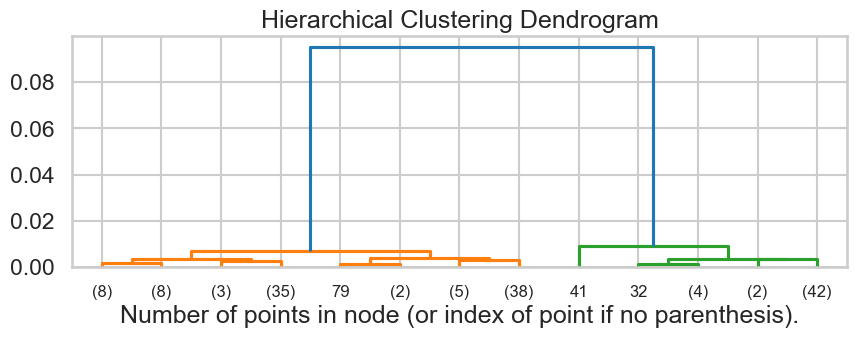

Affinity: cosine, Linkage: average, Distance Threshold: 4
Silhouette Score: 0.6867350732769777
2


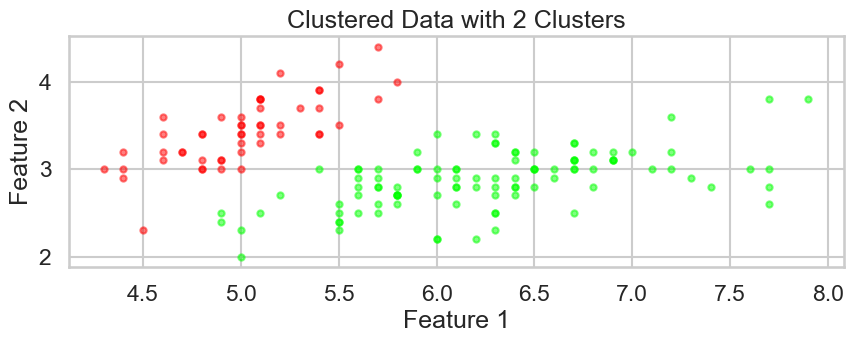

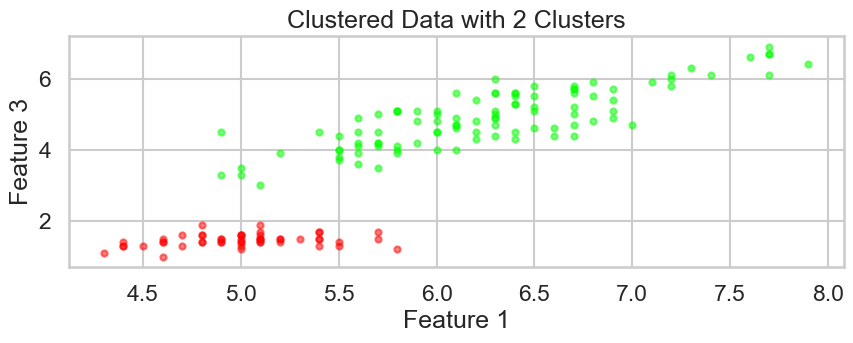

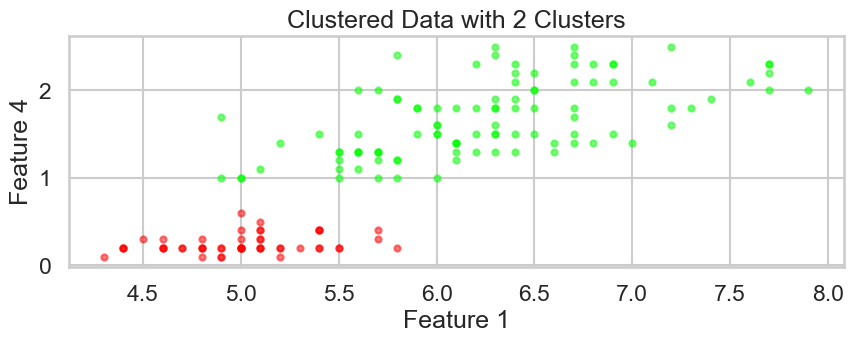

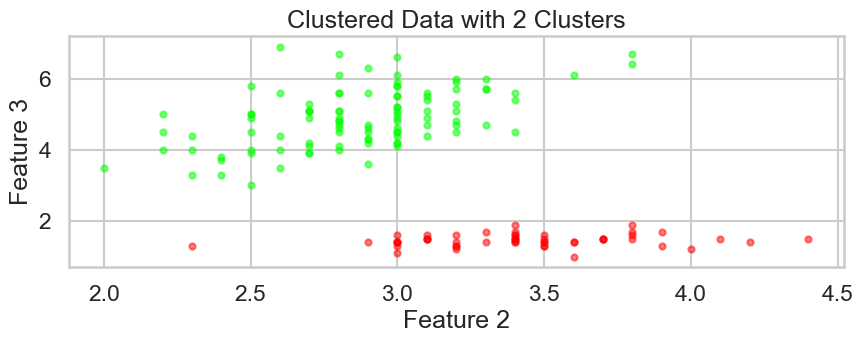

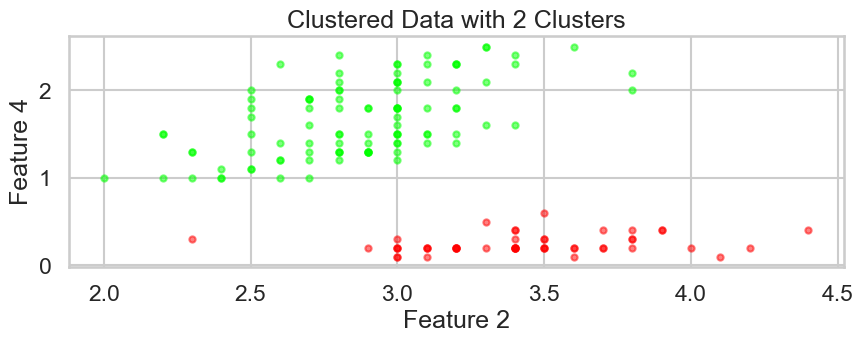

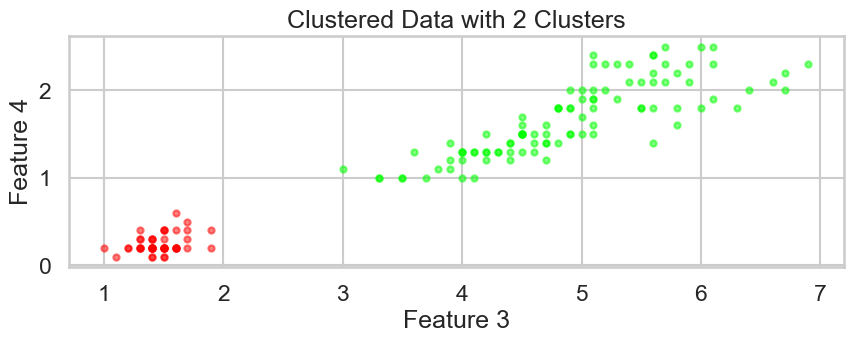

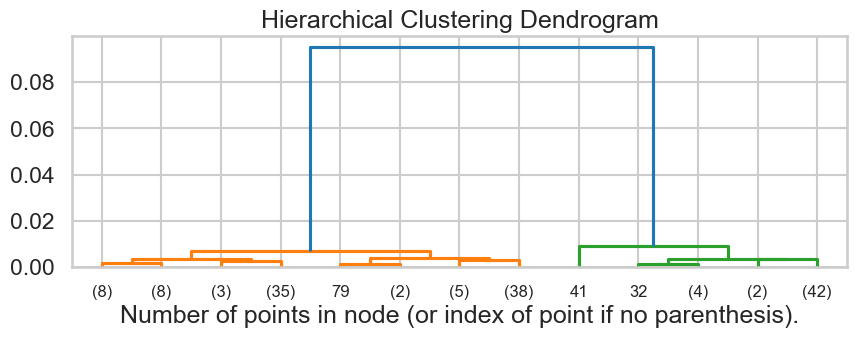

Affinity: cosine, Linkage: average, Distance Threshold: 5
Silhouette Score: 0.6867350732769777
2


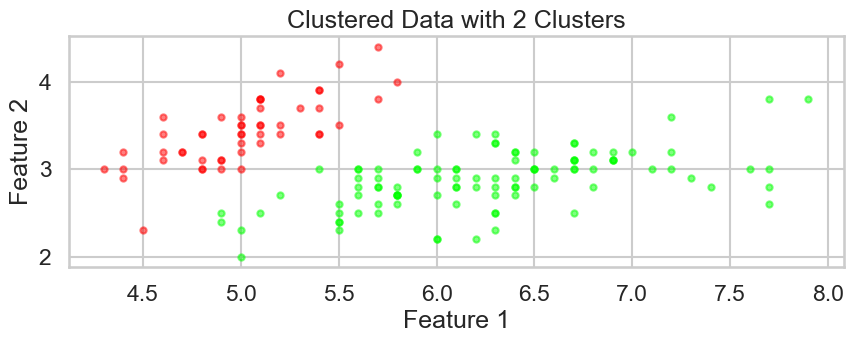

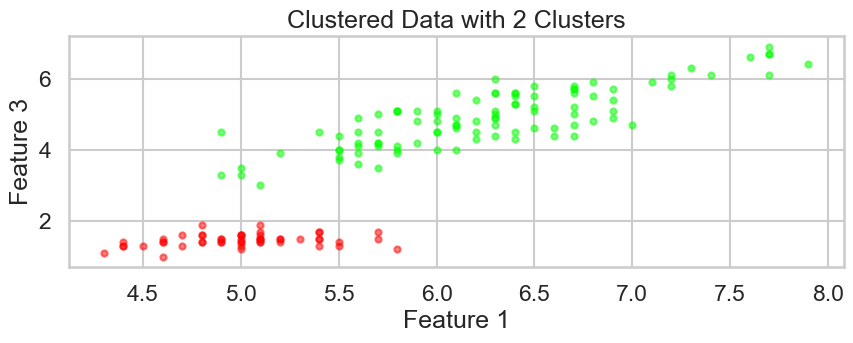

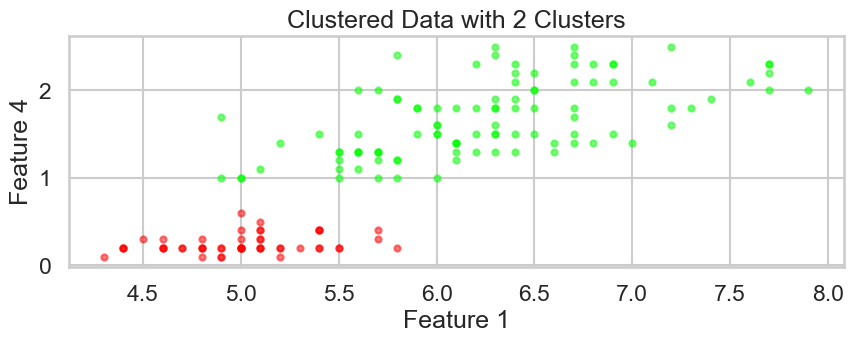

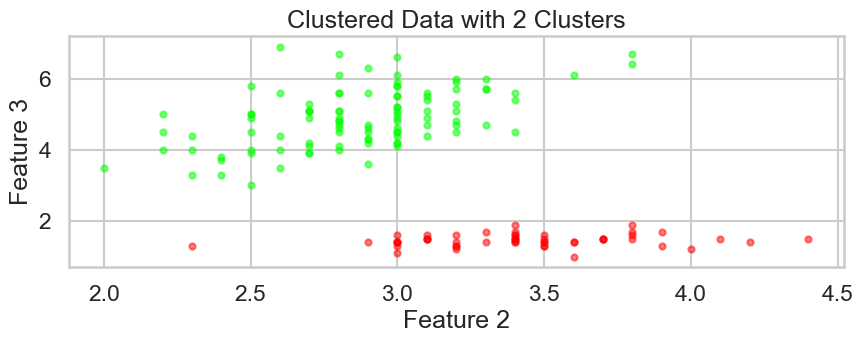

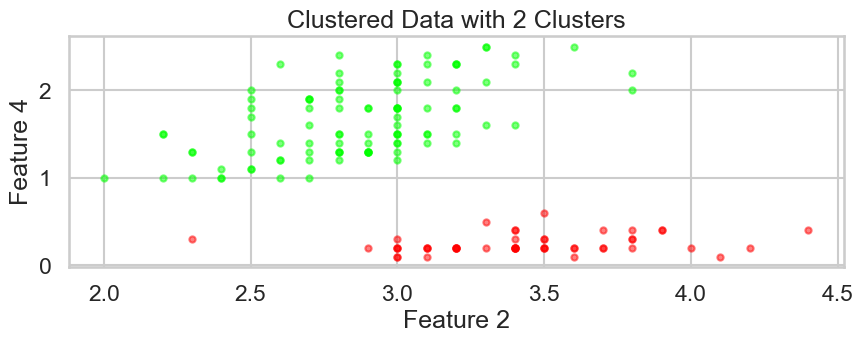

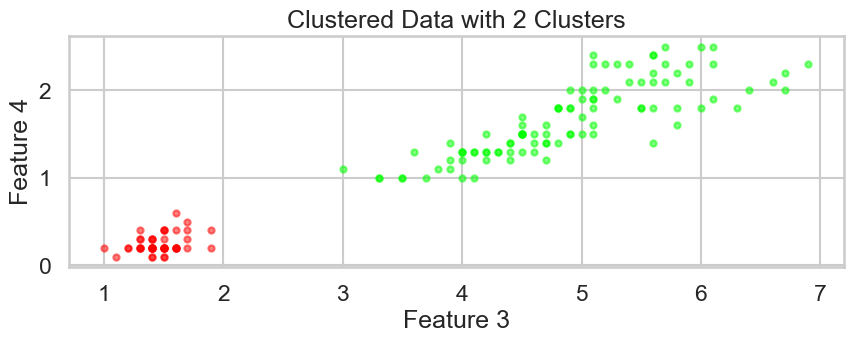

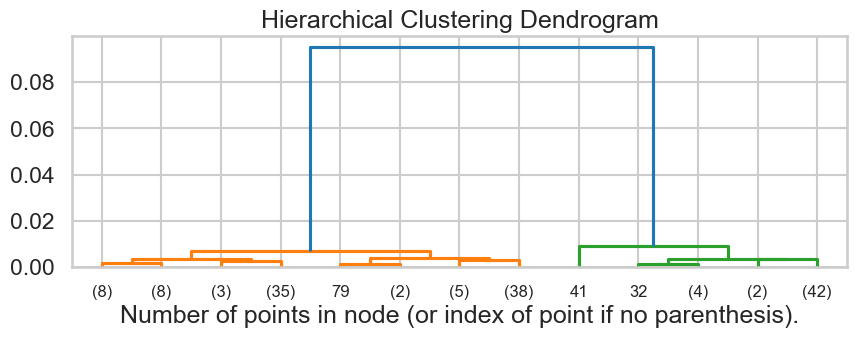

Affinity: cosine, Linkage: single, Distance Threshold: 3
Silhouette Score: 0.6867350732769777
2


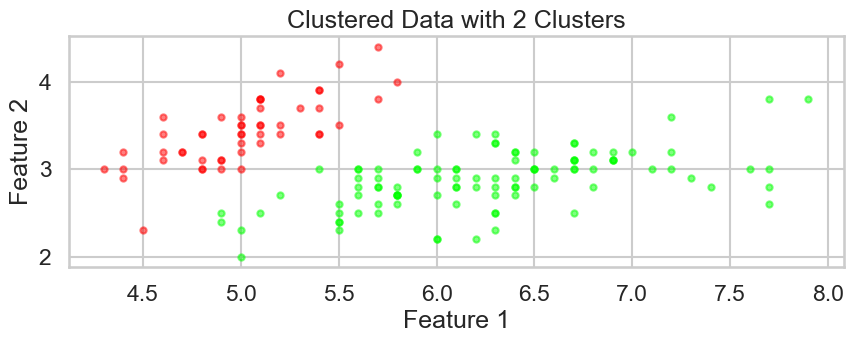

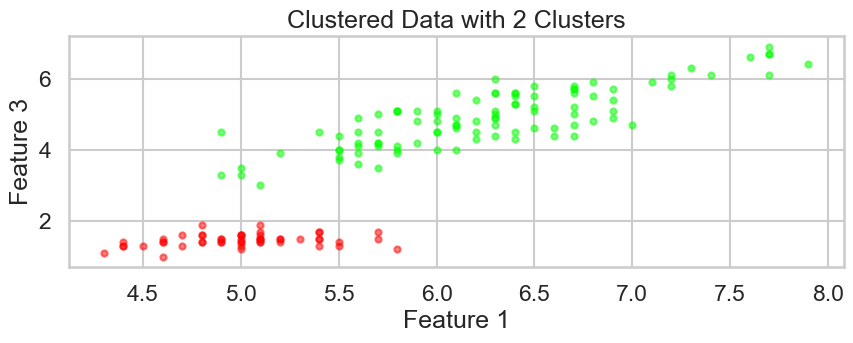

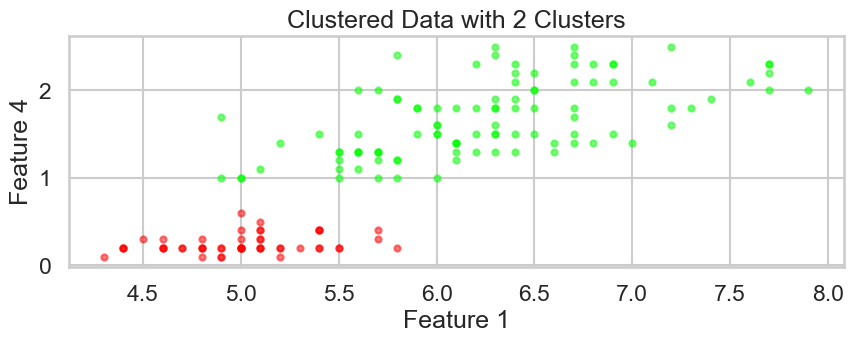

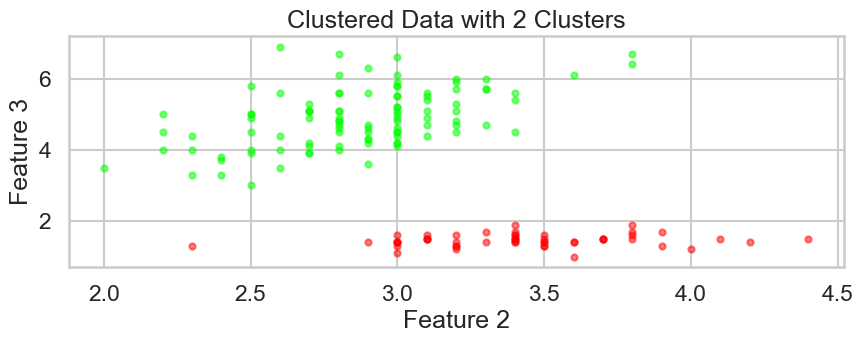

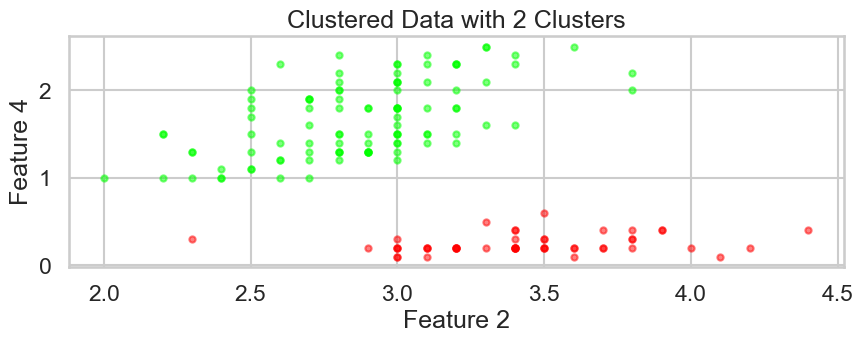

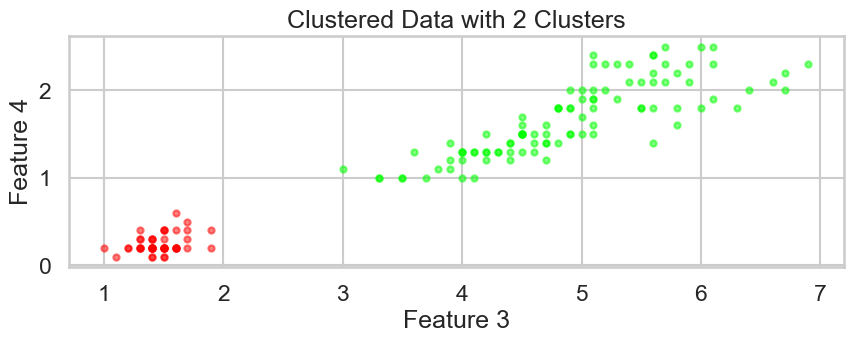

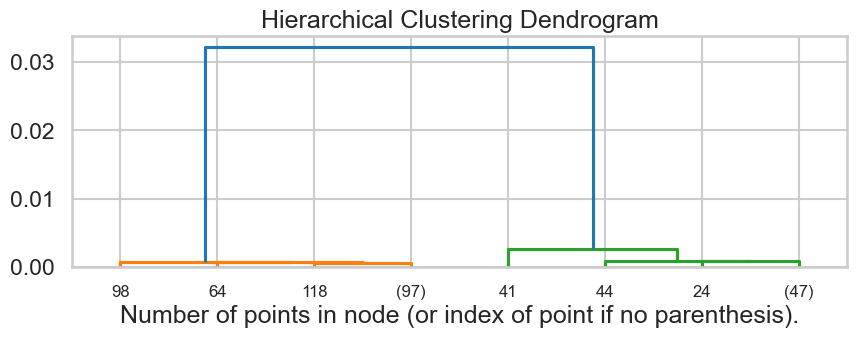

Affinity: cosine, Linkage: single, Distance Threshold: 4
Silhouette Score: 0.6867350732769777
2


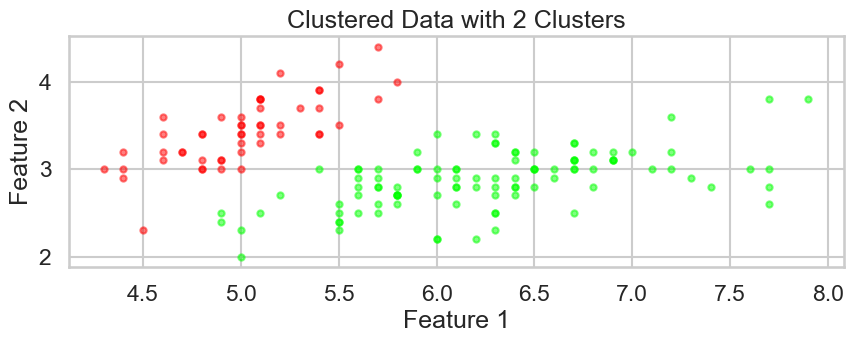

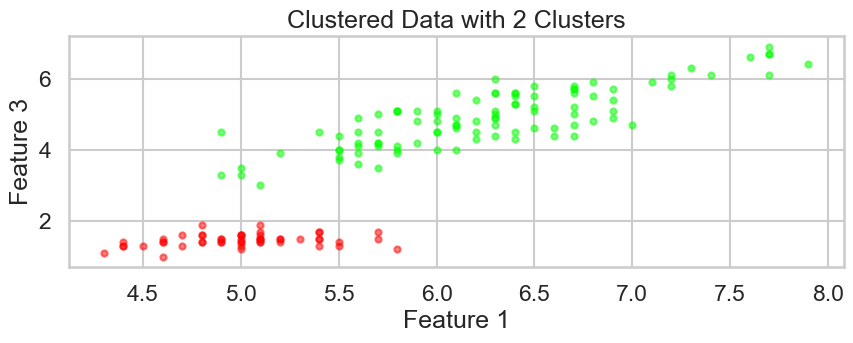

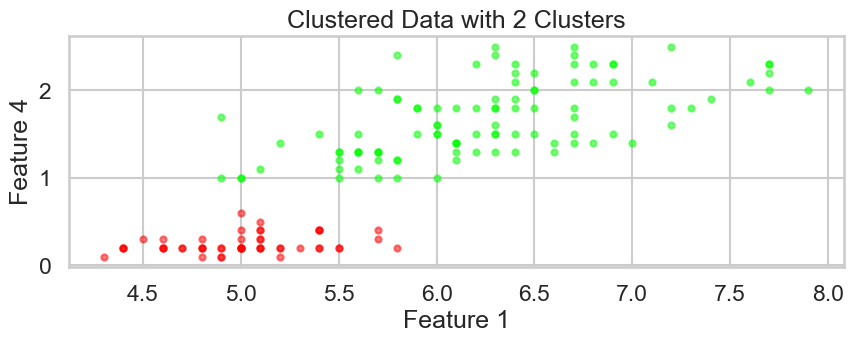

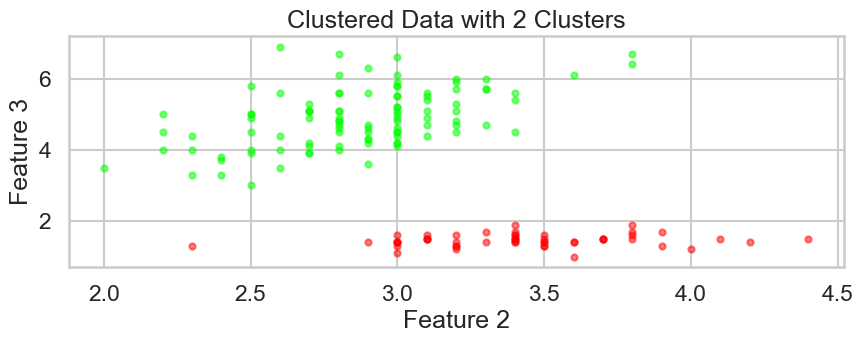

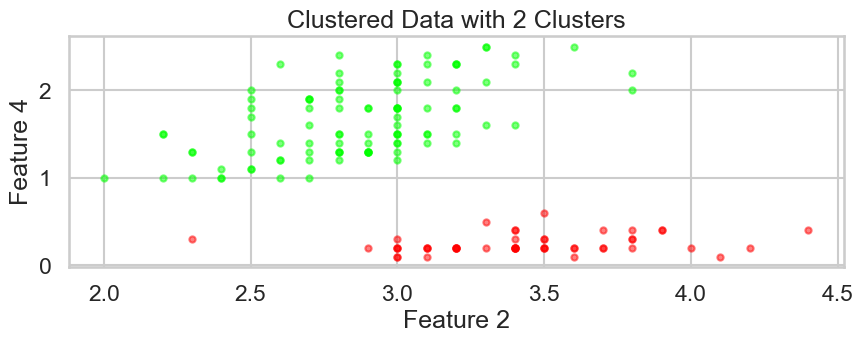

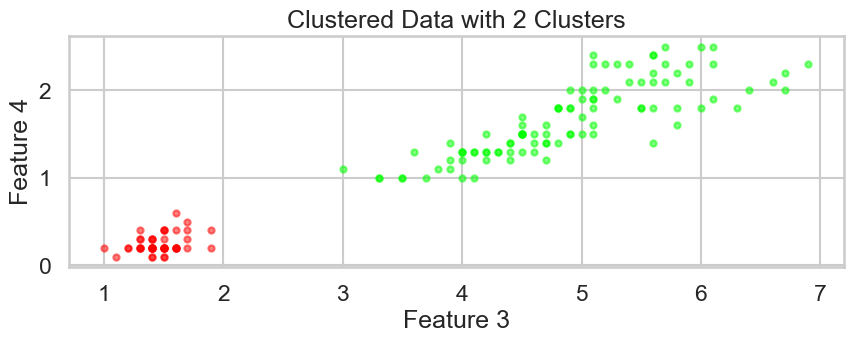

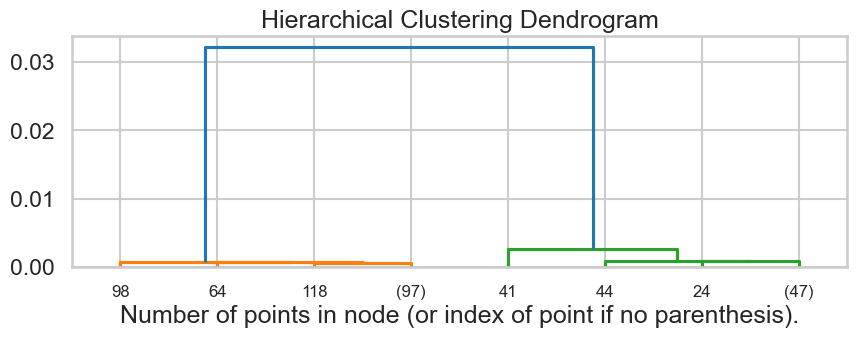

Affinity: cosine, Linkage: single, Distance Threshold: 5
Silhouette Score: 0.6867350732769777
2


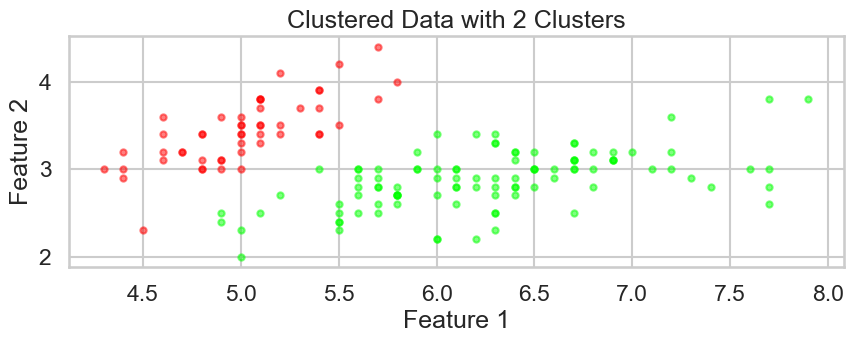

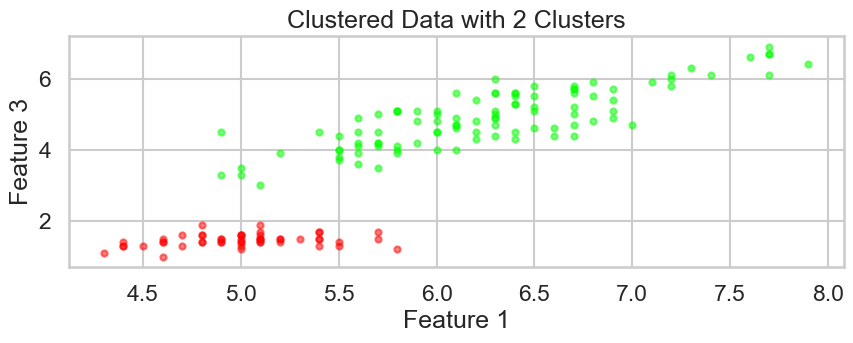

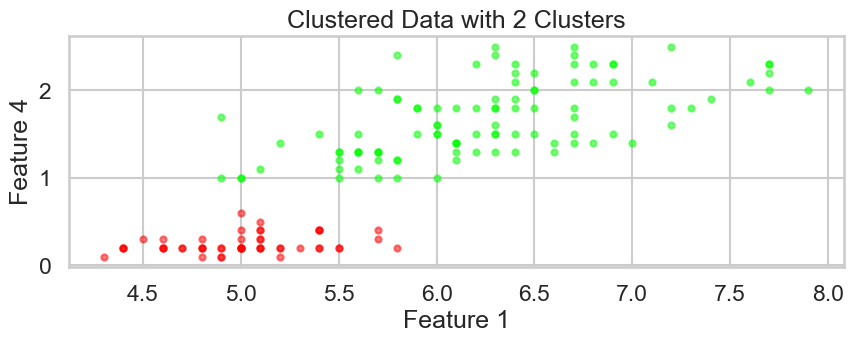

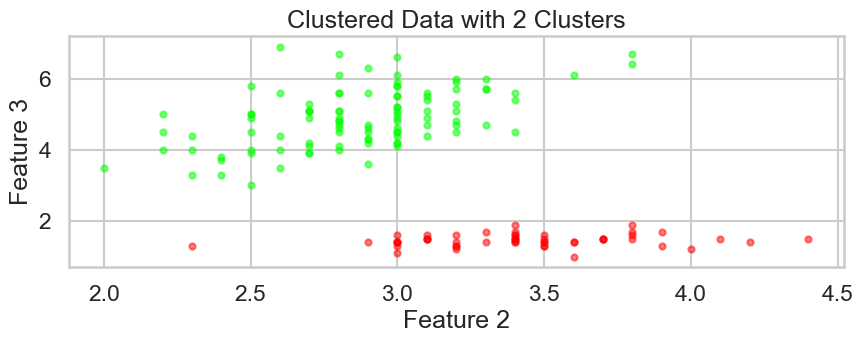

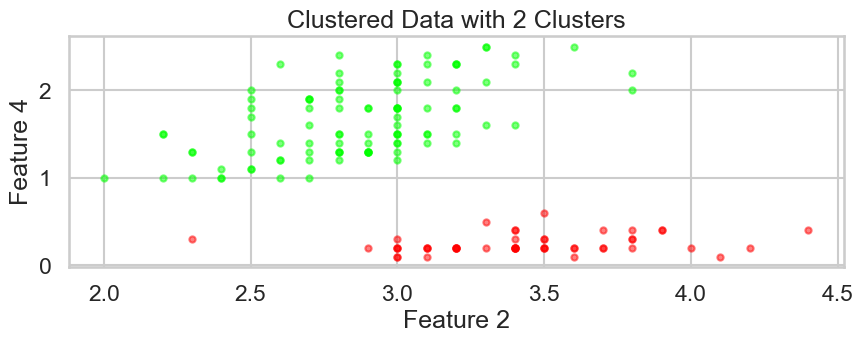

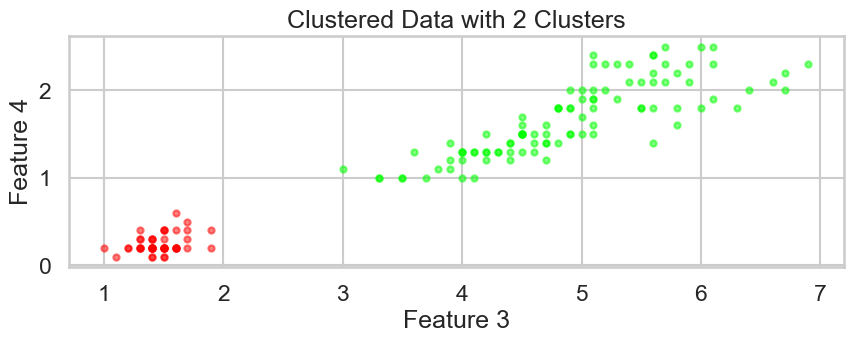

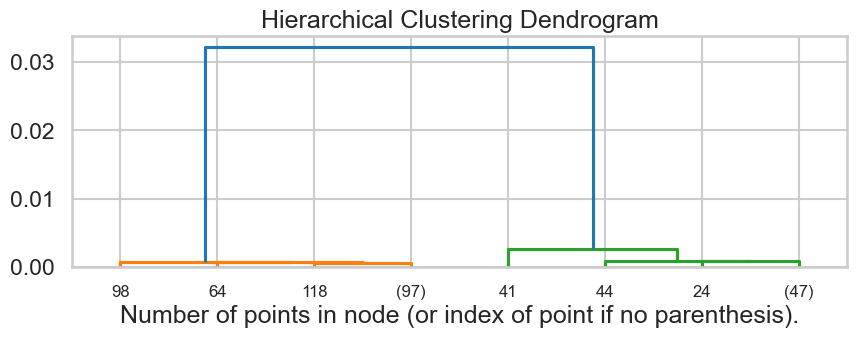

Best Silhouette Score: 0.6867350732769777
Best Parameters: ('euclidean', 'average', 3)
Cluster labels for best parameters: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0]


In [83]:
####HIERARCHIAL CLUSTER





X=np.array(iris_data.data)


# Define parameters to try
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['average', 'single']
distance_thresholds = [3,4,5]

best_silhouette_score = -1
best_parameters = None
best_labels = None

# Iterate over parameter combinations
for affinity in affinities:
    for linkage in linkages:
        for distance_threshold in distance_thresholds:
            print(f"Affinity: {affinity}, Linkage: {linkage}, Distance Threshold: {distance_threshold}")
            
            # Compute pairwise distances
           
            
            # Initialize AgglomerativeClustering with parameters
            model = AgglomerativeClustering(n_clusters=None, linkage=linkage,metric=affinity, distance_threshold=distance_threshold)
            
            # Fit the model to the data
            labels = model.fit_predict(X)
            for J in range (1000):        
                if (len(np.unique(model.labels_))<2 ):
                    distance_threshold=distance_threshold/2
                    model = AgglomerativeClustering(n_clusters=None, linkage=linkage,metric=affinity, distance_threshold=distance_threshold)
                    labels = model.fit_predict(X)
                elif (len(np.unique(model.labels_))>16 ):
                    distance_threshold=distance_threshold*2
                    model = AgglomerativeClustering(n_clusters=None, linkage=linkage,metric=affinity, distance_threshold=distance_threshold)
                    labels = model.fit_predict(X)
                else:
                    break;
            # Calculate silhouette score
            silhouette_avg = silhouette_score(X, labels)
            print("Silhouette Score:", silhouette_avg)
            print(len(np.unique(model.labels_)))
            display_cluster(X,km=model,num_clusters=len(np.unique(model.labels_)))
            # Plot dendrogram
            #plt.figure(figsize=(10, 5))
            plt.title("Hierarchical Clustering Dendrogram")
            # plot the top three levels of the dendrogram
            plot_dendrogram(model, truncate_mode="level", p=3)
            plt.xlabel("Number of points in node (or index of point if no parenthesis).")
            plt.show()
            
            # Update best silhouette score and parameters
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_parameters = (affinity, linkage, distance_threshold)
                best_labels = labels

# Display the resulting clusters for the best parameters
print("Best Silhouette Score:", best_silhouette_score)
print("Best Parameters:", best_parameters)
print("Cluster labels for best parameters:", best_labels)


EPS: 0.1, Min_samples: 5
EPS: 0.1, Min_samples: 6
EPS: 0.1, Min_samples: 7
EPS: 0.1, Min_samples: 8
EPS: 0.1, Min_samples: 9
EPS: 0.1, Min_samples: 10
EPS: 0.1, Min_samples: 11
EPS: 0.1, Min_samples: 12
EPS: 0.1, Min_samples: 13
EPS: 0.1, Min_samples: 14
EPS: 0.1, Min_samples: 15
EPS: 0.1, Min_samples: 16
EPS: 0.1, Min_samples: 17
EPS: 0.1, Min_samples: 18
EPS: 0.1, Min_samples: 19
EPS: 0.1, Min_samples: 20
EPS: 0.1, Min_samples: 21
EPS: 0.1, Min_samples: 22
EPS: 0.1, Min_samples: 23
EPS: 0.1, Min_samples: 24
EPS: 0.1, Min_samples: 25
EPS: 0.2, Min_samples: 5
EPS: 0.2, Min_samples: 6
EPS: 0.2, Min_samples: 7
EPS: 0.2, Min_samples: 8
EPS: 0.2, Min_samples: 9
EPS: 0.2, Min_samples: 10
EPS: 0.2, Min_samples: 11
EPS: 0.2, Min_samples: 12
EPS: 0.2, Min_samples: 13
EPS: 0.2, Min_samples: 14
EPS: 0.2, Min_samples: 15
EPS: 0.2, Min_samples: 16
EPS: 0.2, Min_samples: 17
EPS: 0.2, Min_samples: 18
EPS: 0.2, Min_samples: 19
EPS: 0.2, Min_samples: 20
EPS: 0.2, Min_samples: 21
EPS: 0.2, Min_samples:

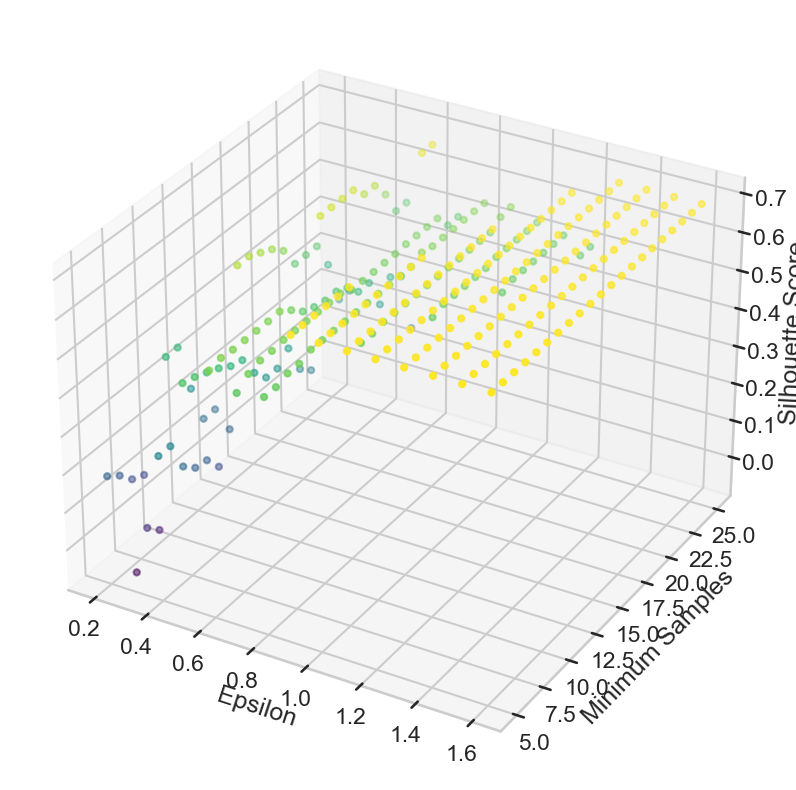

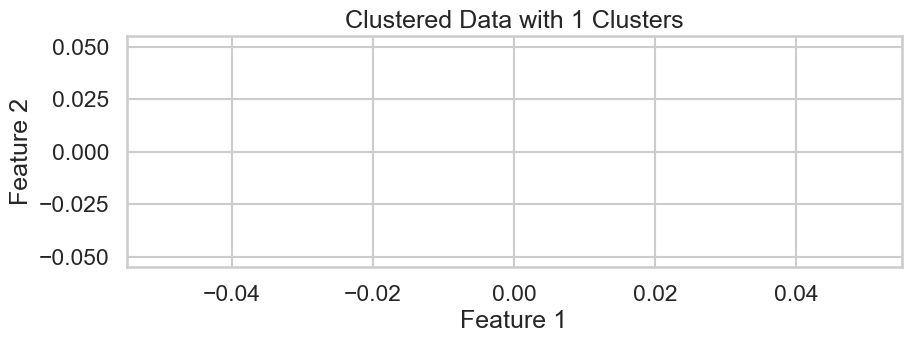

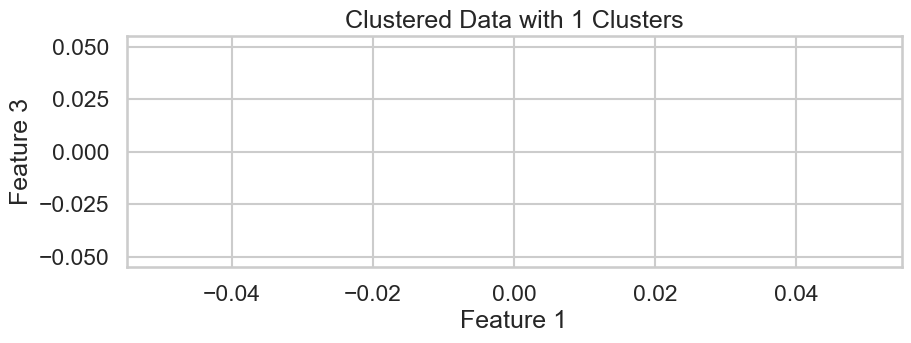

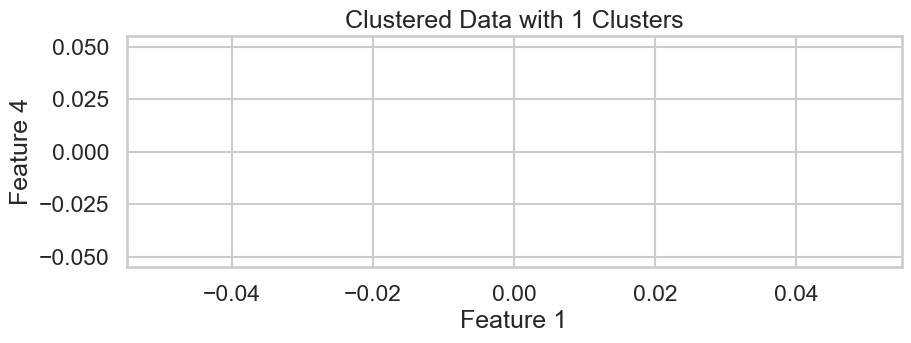

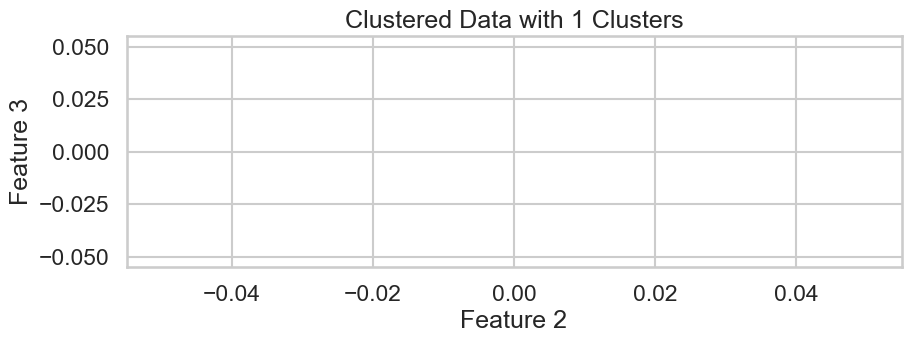

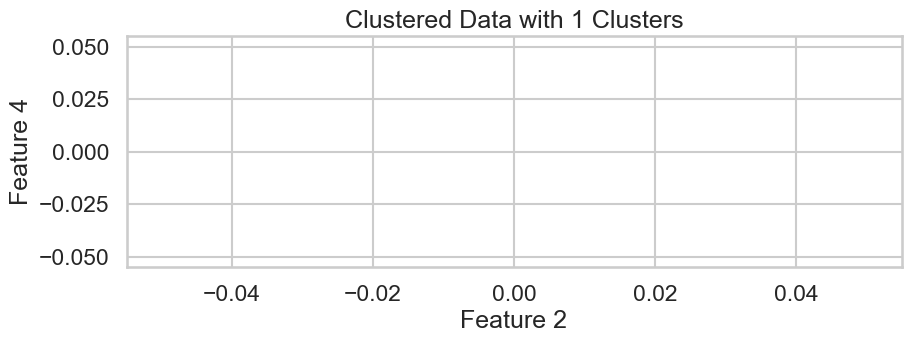

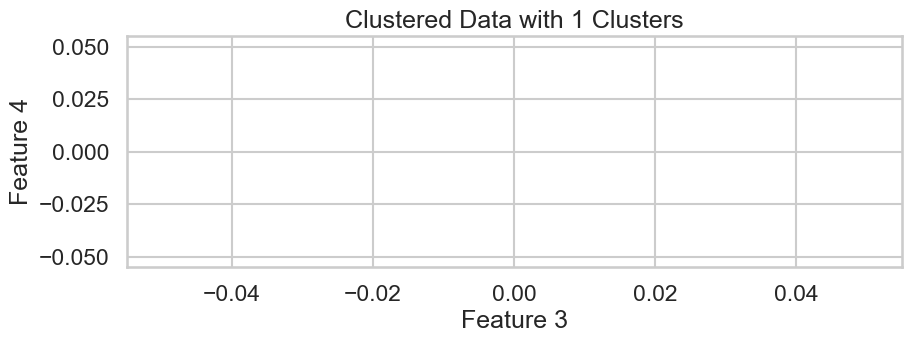

In [85]:
####DBSCAN
X = np.array(iris_data.data)

# Define parameters to try
EPS_range = np.linspace(0.1, 3, 30)
min_samples_range = range(5, 26)

best_silhouette_score = -1
best_parameters = None
best_labels = None
silhouette_scores = []

# Iterate over parameter combinations
for EPS in EPS_range:
    for min_samples in min_samples_range:
        print(f"EPS: {EPS}, Min_samples: {min_samples}")
        
        # Initialize DBSCAN with parameters
        dbscan = DBSCAN(eps=EPS, min_samples=min_samples)
        
        # Fit the model to the data
        labels = dbscan.fit_predict(X)
          
        if (len(np.unique(dbscan.labels_))>1 and len(np.unique(dbscan.labels_))<=16):
            silhouette_avg = silhouette_score(X, labels)
            silhouette_scores.append((EPS, min_samples, silhouette_avg))
            #display_cluster(Multi_blob_Data,km=dbscan,num_clusters=len(np.unique(dbscan.labels_)))
        # Calculate silhouette score

        
        # Update best silhouette score and parameters
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_parameters = (EPS, min_samples)
            best_labels = labels
x = [s[0] for s in silhouette_scores]
y = [s[1] for s in silhouette_scores]
z = [s[2] for s in silhouette_scores]

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=z, cmap='viridis') #color scheme that ranges from a deep blue (for low values) to a bright yellow (for high values)
ax.set_xlabel('Epsilon')
ax.set_ylabel('Minimum Samples')
ax.set_zlabel('Silhouette Score')
plt.show()
dbscan = DBSCAN(eps=best_parameters[0], min_samples=best_parameters[1])
labels = dbscan.fit_predict(X)
display_cluster(X,km=dbscan,num_clusters=len(np.unique(dbscan.labels_)))
        # Fit the model to the data
    

## Customer dataset
Repeat all the above on the customer data set 

EPS: 0.1, Min_samples: 5
EPS: 0.1, Min_samples: 6
EPS: 0.1, Min_samples: 7
EPS: 0.1, Min_samples: 8
EPS: 0.1, Min_samples: 9
EPS: 0.1, Min_samples: 10
EPS: 0.1, Min_samples: 11
EPS: 0.1, Min_samples: 12
EPS: 0.1, Min_samples: 13
EPS: 0.1, Min_samples: 14
EPS: 0.1, Min_samples: 15
EPS: 0.1, Min_samples: 16
EPS: 0.1, Min_samples: 17
EPS: 0.1, Min_samples: 18
EPS: 0.1, Min_samples: 19
EPS: 0.1, Min_samples: 20
EPS: 0.1, Min_samples: 21
EPS: 0.1, Min_samples: 22
EPS: 0.1, Min_samples: 23
EPS: 0.1, Min_samples: 24
EPS: 0.1, Min_samples: 25
EPS: 0.2, Min_samples: 5
EPS: 0.2, Min_samples: 6
EPS: 0.2, Min_samples: 7
EPS: 0.2, Min_samples: 8
EPS: 0.2, Min_samples: 9
EPS: 0.2, Min_samples: 10
EPS: 0.2, Min_samples: 11
EPS: 0.2, Min_samples: 12
EPS: 0.2, Min_samples: 13
EPS: 0.2, Min_samples: 14
EPS: 0.2, Min_samples: 15
EPS: 0.2, Min_samples: 16
EPS: 0.2, Min_samples: 17
EPS: 0.2, Min_samples: 18
EPS: 0.2, Min_samples: 19
EPS: 0.2, Min_samples: 20
EPS: 0.2, Min_samples: 21
EPS: 0.2, Min_samples:

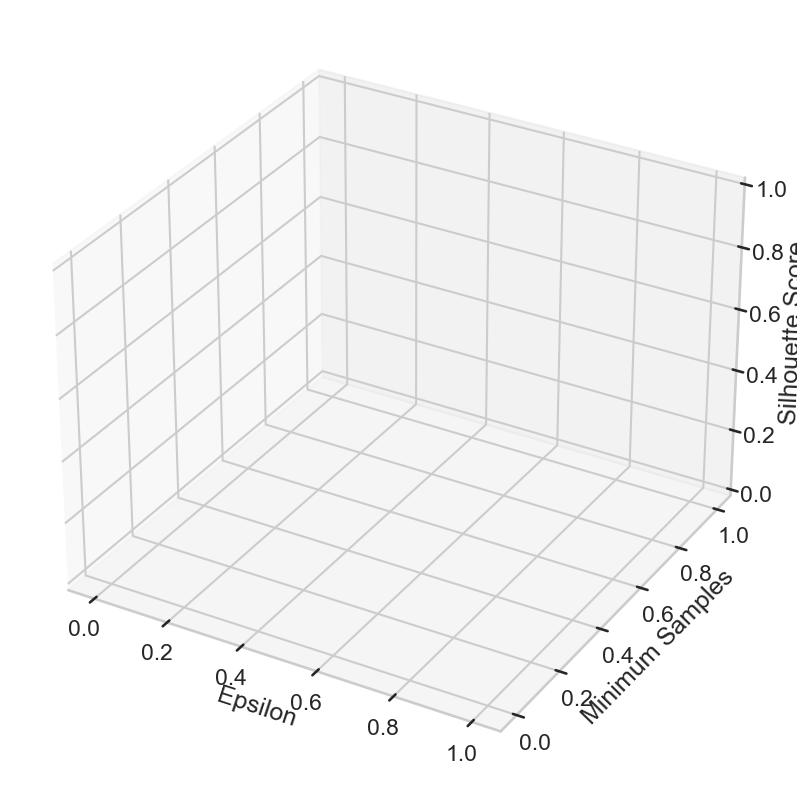

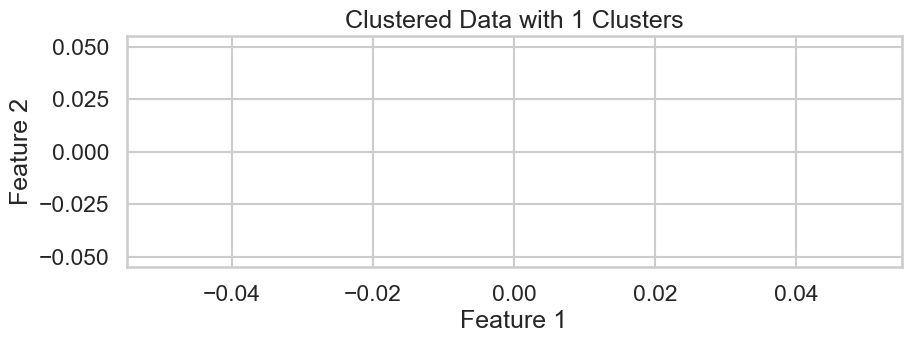

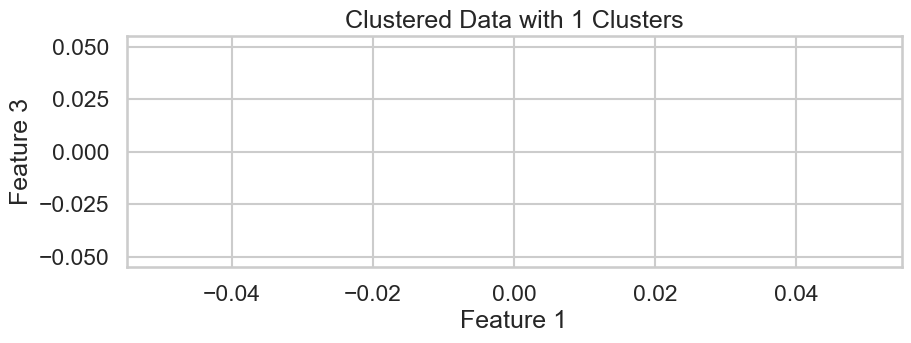

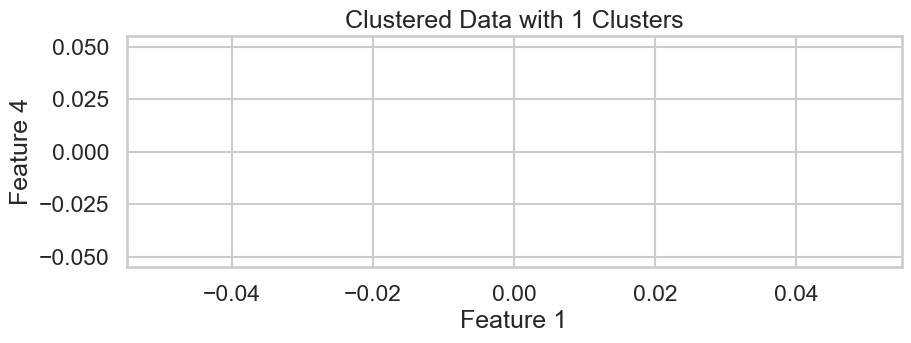

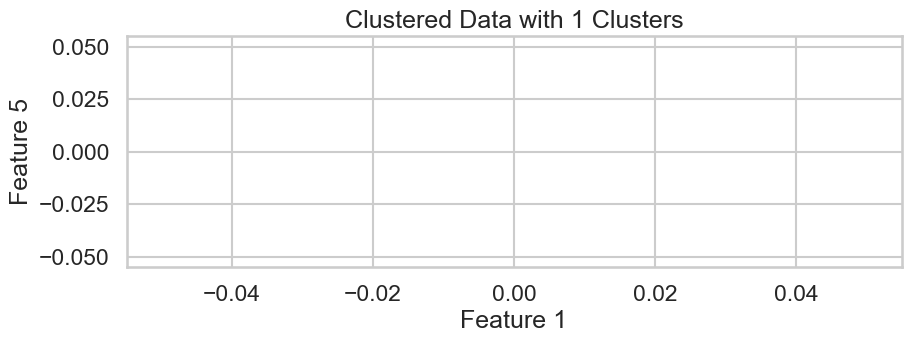

...

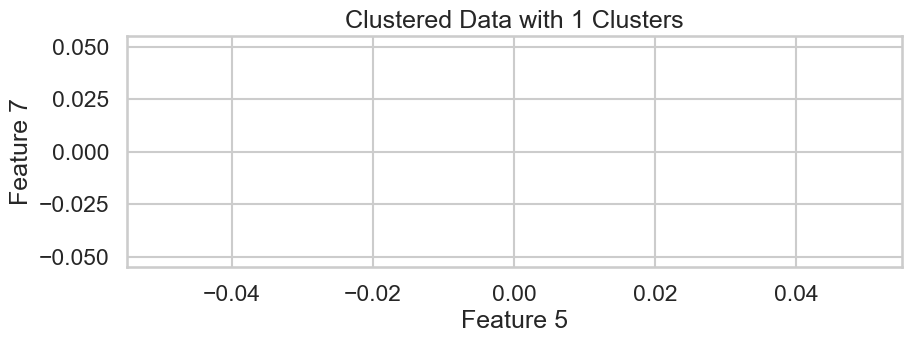

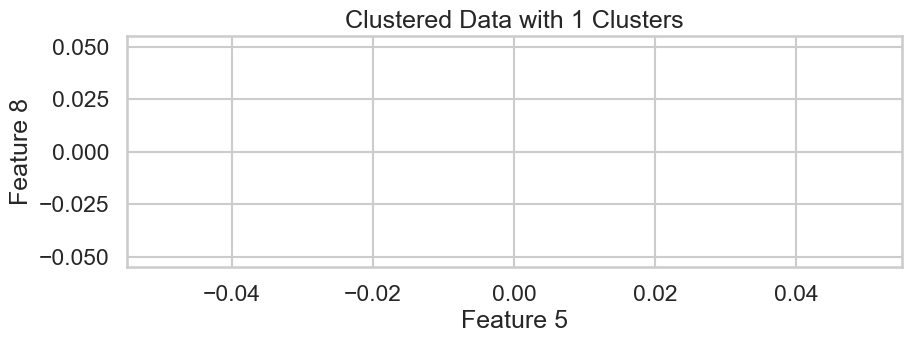

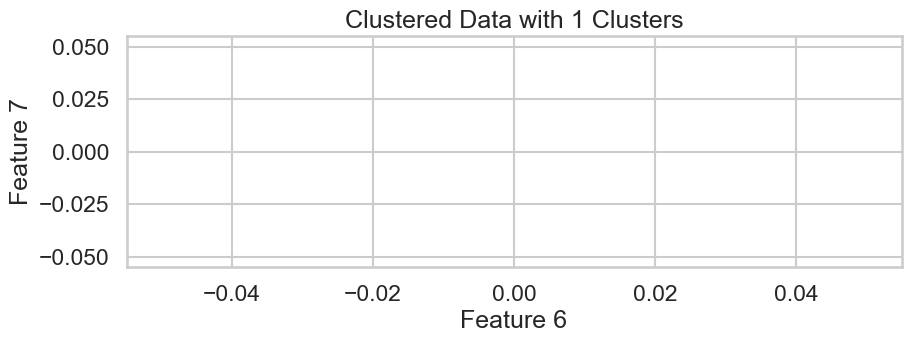

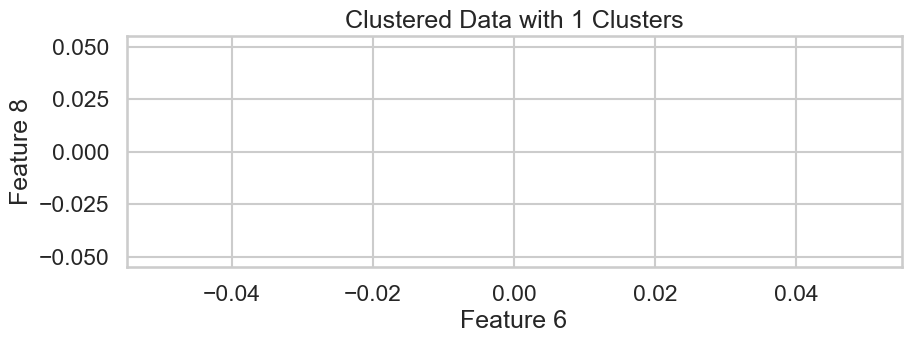

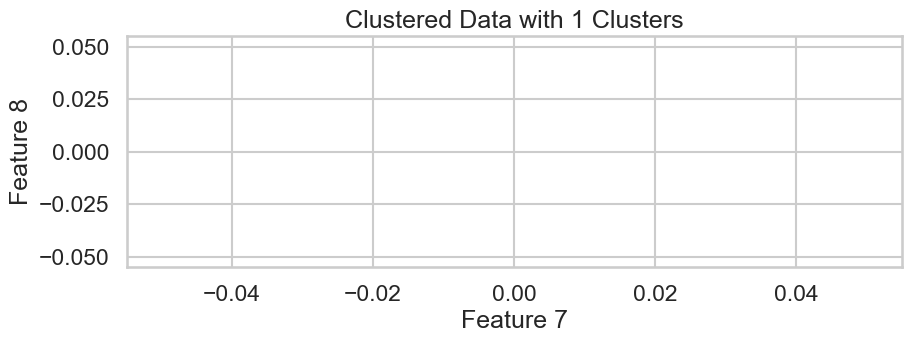

In [89]:
####DBSCAN
X=np.loadtxt("F:/My_sem_10/sem10_my_material/Machine_learning/assignments/kmeans_assignment/Customer_data.csv",delimiter=",",skiprows=1,dtype=float)

# Define parameters to try
EPS_range = np.linspace(0.1, 3, 30)
min_samples_range = range(5, 26)

best_silhouette_score = -1
best_parameters = None
best_labels = None
silhouette_scores = []

# Iterate over parameter combinations
for EPS in EPS_range:
    for min_samples in min_samples_range:
        print(f"EPS: {EPS}, Min_samples: {min_samples}")
        
        # Initialize DBSCAN with parameters
        dbscan = DBSCAN(eps=EPS, min_samples=min_samples)
        
        # Fit the model to the data
        labels = dbscan.fit_predict(X)
          
        if (len(np.unique(dbscan.labels_))>1 and len(np.unique(dbscan.labels_))<=50):
            print("ARRIVED")
            silhouette_avg = silhouette_score(X, labels)
            silhouette_scores.append((EPS, min_samples, silhouette_avg))
            #display_cluster(Multi_blob_Data,km=dbscan,num_clusters=len(np.unique(dbscan.labels_)))
        # Calculate silhouette score

        
        # Update best silhouette score and parameters
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_parameters = (EPS, min_samples)
            best_labels = labels
x = [s[0] for s in silhouette_scores]
y = [s[1] for s in silhouette_scores]
z = [s[2] for s in silhouette_scores]

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=z, cmap='viridis') #color scheme that ranges from a deep blue (for low values) to a bright yellow (for high values)
ax.set_xlabel('Epsilon')
ax.set_ylabel('Minimum Samples')
ax.set_zlabel('Silhouette Score')
plt.show()
dbscan = DBSCAN(eps=best_parameters[0], min_samples=best_parameters[1])
labels = dbscan.fit_predict(X)
display_cluster(X,km=dbscan,num_clusters=len(np.unique(dbscan.labels_)))
        # Fit the model to the data
    